# 이번주: 4가지 문제 공부
  
  
1. Symbolic differenciation  
    : 매번 도함수나 gradient를 함수를 통해서 지정하는것 번거로움.  
    미분 어려움, 파이썬에 미분 자동적으로 수행해주는 모듈로 미분이 어떻게 일어날까??  
    
  
2. symbolic 미분을 이용해 지난주 우리가 공부했던 **Backtracking line search** / **Strong backtracking** 알고리즘 다시 프로그래밍  
    : 교재에서는 backtraking과 strong backtracking 설명만 나와 있음  
  
  
3. Local desent : multivariate  
   - 실제 2가지 방법(backtraking/strong backtracking) 이용해 step-size 결정한 다음에 어떻게 최적화 이루어지는지. 교재에 없음  
   - Symbolic differenciation 방법 이용해 local desent 직접 구현  
   - 다변량 문제 -> 작성된 코드들이 일변량에도 적용 가능  
  
   
4. 문제해결 과제 : univariate , 일변량 

In [1]:
#!pip install sympy

In [1]:
# sympy 설치 : symbolic diffe
import sympy as sp
import numpy as np #array 계산

In [2]:
# Example 3.1 : univariate
# sympy 이용해 symbolic differenciation 수행

x=sp.Symbol('x') #심볼로 사용하게 될 변수 선언. x는 변수가 아니라 기호로 인식

f=sp.exp(x-2)-x #sp.exp는 계산 수행함수 아니라 심볼로 처리

df=f.diff(x) #f라는 sympy 함수를 미분. 심볼 x를 통해서~

print(df) #지수부분은 그대로 -x->-1로! 미분 잘됨

# 여기서 df라는 것은 x처럼 심볼일 뿐이지 
# 계산을 수행하는 일반적인 파이썬 변수, 함수와는 다르다.

# df라는 심볼릭 differenceation이 일어난 객체의 값을 부여해서 실제 값을 계산하기 위해
# lambdify 함수 이용

# 함수 값 계산
derv=sp.lambdify(x,df,'numpy') #x,df: symbol
print(derv(1)) #계산된 도함수 값 나옴
print(derv(2)) 
print(derv(3)) #지수 값이 양수되면 계산된 도함수 값 급격한 증가

## 최적화 문제를 경험적으로 해결할 때, 굉장히 중요한 information
# ex. 하이퍼 파라미터 지정할 때, 도함수나 gradient 값이 어느정도 되는지 알면 
# 초기값/조율모수 설정 시 굉장히 중요한 정보 얻을 수 있음


# 도함수, gradient 가 어떤 값들로 계산되는지를 미리 알고 최적화 알고리즘 실행하고 구현하는 것이 중요한 경험적 정보 얻는데 유용

exp(x - 2) - 1
-0.6321205588285577
0.0
1.718281828459045


In [3]:
# Example 4.2 : p.58

def f(x):
    y=x[0]**2+x[0]*x[1]+x[1]**2
    return y

# 이 함수는 x를 vec, array로 처리하기 위해 x[0] 이런식으로 처리

In [4]:
# multivariate인 경우 
# 심볼 정해야하는데 내가 정한 함수의 x라는 벡터 객체를 인덱스로 인식하기 위해
# IndexedBase 함수 사용

x=sp.IndexedBase('x')
print(sp.diff(f(x),x[0])) # x[0]에 대한 f(x)편미분

print(sp.diff(f(x),x[1])) # gradient 얻기 위해 2개의 편미분 값 필요
# 이 두개 모아 놓은 것이 gradient


print([sp.diff(f(x),x[i]) for i in range(2)]) #편미분 한 값들을 리스트로 저장

# 리스트에는 값을 대입해 그 변수에 해당되는 값 얻기 어려움
# 리스트 컴프리헨션을 이용한 np.array로 그 값 쉽게 구현 가능
# 리스트 컴프리헨션 한 값을 numpy array 형태로 바꿈
gradients=np.array([sp.diff(f(x),x[i]) for i in range(2)])

# df와 같이 gradients가 객체로 만들어짐
# 실제 도함수 값을 얻듯이, gradients라는 심볼릭 미분된 결과를 가지고 있는 리스트를 
# lambdify를 가지고 함수를 만들어 값을 부여하면 값이 계산되게 하자!

grads=sp.lambdify(x,gradients,'numpy') #심볼은 x이고, 하지만 이는 변수가 아니라 객체: 리스트, 벡터형태


# 이러면 미분하고 미분값 계산하는 함수 생성
x_=[1,2]
print(grads(x_)) #4,5 정확한 값 나옴

2*x[0] + x[1]
x[0] + 2*x[1]
[2*x[0] + x[1], x[0] + 2*x[1]]
[4, 5]


- 일일이 함수만 정의하면 gradient를 또다른 함수로 미분 수행해서 코딩하지 않고
- sympy에 의해 symbolic 미분 수행하고 그 미분된 결과를 함수화해서 원하는 gradient 값 계산

- 유용한 방법~~!!

In [5]:
# Example 4.1 : multivariate

def f(x):
    return sp.sin(x[0]*x[1])+sp.exp(x[1]+x[2])-x[2]
# 다변량일 때 변수 3개

x=sp.IndexedBase('x')
gradients=np.array([sp.diff(f(x),x[i]) for i in range(3)]) #리스트 컴프리헨션 이용해 np 오브젝트 만들고

# 경사도 값 얻을 수 잇는 함수 grads를 lambdify로 생성
grads=sp.lambdify(x,gradients,'numpy')

x_=[1,2,3] #design point
print(grads(x_))

# 이 함수 gradient의 초기값 1,2,3 을 구했을 때, 도함수 값을 쉽고 간단하게 얻을 수 있음!

[-0.8322936730942848, 147.99701226602946, 147.4131591025766]


- 간단함
>1.sympy 임포트
>2. 다변량인 경우 리스트 오브젝트를 아규먼트로 주어서 함수를 생성
>3. 그 함수에 사용될 리스트 객체를 sympy오브젝트로 만든다.
> (다변량인 경우, IndexedBase)
>4. 리스트 컴프리헨션 이용해 편미분 수행한 것의 np.array 생성
>5. np.array에 값을 부여하면 값을 계산해주는 함수를 lambdify로 구현
>6. 그 함수의 아규먼트의 값으로 gradient값을 얻기 위한 디자인 포인트값 주면 해당되는 local model에서의 graient 값을 계산할 수 있다.

- sysbolic differenciate를 이용해 gradient, 도함수 쉽게 얻을 수 있음!

In [6]:
# 지지난주 구현한 backtracking line search 알고리즘을 symbolic differenciation이용!

# Algorith, 4.2 : p.56
def backtracking_line_search(f,grads,x,d,alpha=10,p=0.5,beta=1E-4):
    y,g=f(x),grads(x)
    i=1
    while f(x+alpha*d)>y+beta*alpha*np.dot(g,d): # g.T@d
        alpha*=p
        print('%d: alpha =%.4f'%(i,alpha))
        i+=1
        
    return alpha

# 지난번에 알고리즘 구현할 때에는 함수 인수 값에 계산된 값을 아규먼트로 줌
# grads함수를 만들어 gradient 값을 계산해주는 함수를 만들었기 때문에 마치 f처럼 이 함수도 직접 아규먼트로 구현
# 이후 grads자리에 계산된 값을 주게 되어 있었는데 grads함수 이용해 gradient값을 계산해 backtracking line search 알고리즘 쉽게 구현


# 함수 f와 sympy이용해 grads함수만 구현해놓으면 backtracking line search 알고리즘은 일반적인 어떤 다변량함수에도 적용할 수 있는 메소드
# 지난번 구현때 보다 훨씬 일반화된 모형

In [7]:
# Example 4.2 : p.58

def f(x):
    y=x[0]**2+x[0]*x[1]+x[1]**2
    return y

x=sp.IndexedBase('x') # x[0],x[1]이 심볼이라는 것을 팔로우 업 할 수 있게
gradients=np.array([sp.diff(f(x),x[i]) for i in range(2)])
grads=sp.lambdify(x,gradients,'numpy') #gradient값을 주어진 계획점에서 계산할 수 있게 하는 함수 생성

x_=np.array([1,2]) #디자인 포인트
d_=np.array([-1,-1]) #direction

alpha=backtracking_line_search(f,grads,x_,d_) #메소드 호출해서 f함수에 대한 계획점에서의 alpha 값 계산
print(alpha)
# 교재에도 2.5에서 끝
# alpha를 쉽게 계산할 수 있게 해줌



# 계획점에서 시작하니까 이게 첫번째 최적화된 최소값을 얻기 위한 local model의 디자인 포인트
# d_ 방향으로 얼만큼 이동시키면 좋겠니? -> step size를 백트레킹 라인 서치 알고리즘으로 계산
# 첫번째 계획점에서 이 방향벡터에 의해 이동시키면 alpha는 2.5일때 가장 적은 목적함수의 값을 얻을 수 있음

# 백트레킹 라인 서치 알고리즘으로 계산한 알파값에 의해 계획점 이동시켜야
# 이동된 계획점에서 로컬모델에서 다시 gradient 계산, alpha, 목적함수 계산

# 이게 반복이 되면 local desent 알고리즘

1: alpha =5.0000
2: alpha =2.5000
2.5


# Local decent algorithm 확인
- 간단하게 remind!  
 1. x(k) 종료조건 확인 : k번째 반복
 2. desent direction d(k) 결정 
 3. alpha(k) 결정 : 결정된 direction이용해 alpha 계산
 4. x(k+1)=x(k)+alpha(k)*d(k) : 계획점 이동  
   
   
   
 
- 이 과정 반복해 backtracking line search 에 이용해 구해진 step size이용해 최소값 구할 수 있는 것!  


- 실제로 구현해보자! 먼저 backtracking line search 알고리즘 구현된 메소드 이용해 local desent 알고리즘이 어떻게 구현될 수 있는지 코딩해보자~!  


- symbolic differencitation 낯설어서 어렵게 느껴지는ㄱ ㅓ   


- 함수 규칙만 알고 있으면 다양한 다변량 함수에 대한 gradient 얻을 수 있음  


- 손에 익는 시간 필요!!

**이 symbolic 이용해 다양한 다변량 함수에 어떻게 local desent 알고리즘이 적용 되는지 알아두세요!**

- sympy 간단!
- 코드는 점점 복잡해짐
- 복잡한 알고리즘 프로그래밍 하고 있음
- 최적화 방법에 일반화 될 수 있는 프로그램 개발하고 있음  


- 일변량일 때 최소값을 구하려면 도함수(탄젠트 라인)는 -방향쪽으로 움직여야 목적함수 값이 줄어듬
- 최댓값은 +방향으로 이동  


- backtracking line search 알고리즘에서는 numpy.dot이용해 연산함 
- 2차원 이상 gradient 에서는 각각의 gradient 축 방향으로 이동해줘야함

In [8]:
#1. x(k) 종료조건 확인 : k번째 반복
#2. desent direction d(k) 결정 
#3. alpha(k) 결정 : 결정된 direction이용해 alpha 계산
#4. x(k+1)=x(k)+alpha(k)*d(k) : 계획점 이동  

In [9]:
# 1번 스텝
x_=np.array([1,2]) # 2차원 계획점

# 2번 스텝
d_=-1*np.array(grads(x_)) 
#계획점에서의 local model 에 대한 gradient (local model : desent direction)
# 편미분 된 값 계산 후 -1 곱해줌(각각을 편미분 값 빼 줌) -> why? -방향으로 움직임
# x(k+1)=x(k)+alpha(k)*d(k) 에서 d(k)는 -부호 가짐

# -alpha(k)*d(k)가 된다


# 3번 스텝
# 최조 계획점에서 gradient 를 얻었으니까 alpha 값을 backtracking 알고리즘 이용해 구하기
alpha=backtracking_line_search(f,grads,x_,d_)
print(alpha,x_,f(x_))

# 초기값, 목적함수의 값 계산 가능


## 이 과정은 초기값으로 주어진 계획점에 의해 값 얻음

1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
0.625 [1 2] 7


- 근데 첫번째 종료조건 확인 : 값이 계산되어야 종료조건 확인
- 일반적으로 컴으로 구현할 때, 처음에 주어진 계획점은 초기값, 초기값 계산 수행 이후의 두번째 값과 비교를 통해 
- 계산 계속 수행, 멈출지 결정

- 종료 조건: 수치해석을 이용한 최적화 방법에서 3가지 종료조건 **Termination conditions**

>1. abstol: abs(y-y_prev)<1E-8
2. reltol: abs(y-y_prev)<1E-8 * (abs(y_prev)+1E-8)
3. maximum iteration

여기서 y,y_prev는 목적함수 값 의미 : 이전에 계산된 목적함수 값과 현재 디자인 포인트에 의해 계산된 목적함수 값의 차이가 적절한 값보다 작으면 반복 멈춤  

이전에 계산된 목적함수값과 지금 계산된 목적함수의 차이 없으면 반복 중지

**reltol**은 abstol과 비슷해보임. but, abs(y_prev)이 0이 되면 계산상의 오류 나옴. 허용오차 더해준만큼 곱해줌
-> 이전 반복 에서의 계산된 목적함수의 값과 현재 반복에서 계산된 목적함수의 차이의 비율이 적절한 값보다 작으면 반복 멈춤(좌변으로 옮겨서 계산하면 쉽게 이해가능!)


**maximum iteration** 반복이 심하게 많으면 컴이 부담. overflow위험. 반복 수 지정.


또는 1과 3, 2와 3 같이 이용하기도 한다.

In [10]:
x_=np.array([1,2]) #1번 스텝
d_=-1*np.array(grads(x_))  #2번 스텝
alpha=backtracking_line_search(f,grads,x_,d_) #3번 스텝


y_prev=f(x_) #초기값으로 계산된 값

#종료조건을 만족하게끔 반복 수행
flag=True #bool 변수 선언
# 이 값이 false일때 종료

i=1
while flag: # 첫번째 계산 수행했으니까 무조건 한 번 더 계산 수행
    
    x_=x_+alpha*d_ #4번 단계 :local model 이동
    
    d_=-1*np.array(grads(x_))
    
    alpha=backtracking_line_search(f,grads,x_,d_)

    y_=f(x_)
    
    # 종료 할지말지 판단 근거: abstol 이용
    diff=np.abs(y_-y_prev)
    print(i,alpha,x_,f(x_),diff)
    
    if diff<1E-8:
        flag=False
        
    y_prev=y_ #조건 만족 안하면 비교를 위해 y_prev 지정
    i+=1
    
    
    
# 결과
# 예제 4.2의 함수를 backtracking_line_search알고리즘을 이용해 계산된 step-size 알파 이용해 반복계산
# 72번째 반복에서 종료ㅈ건 만족 -> 반복 끝
# 최소 목적함수 값(3.009~~e-8)을 갖는 x계획점([0.0001~~,0.0001])이 이렇게 계산됨

1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1 0.625 [-1.5   -1.125] 5.203125 1.796875
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
2 0.625 [1.078125 1.21875 ] 3.961669921875 1.241455078125
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
3 0.625 [-1.03125    -0.97851562] 3.0300636291503906 0.9316062927246094
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
4 0.625 [0.86938477 0.88916016] 2.3194579482078552 0.7106056809425354
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
5 0.625 [-0.77307129 -0.76565552] 1.7757738875225186 0.5436840606853366
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
6 0.625 [0.67180252 0.67458344] 1.3595682898740051 0.4162055976485135
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
7 0.625 [-0.58956528 -0.58852243] 1.0409182635778507 0.31865002629615446

In [11]:
## reltol 종료조건 사용하기!

x_=np.array([1,2]) #1번 스텝
d_=-1*np.array(grads(x_)) # 2번 스텝
alpha=backtracking_line_search(f,grads,x_,d_)# 3번 스텝

y_prev=f(x_) #초기값으로 계산된 값

#종료조건을 만족하게끔 반복 수행
flag=True #bool 변수 선언
# 이 값이 false일때 종료

i=1
while flag: # 첫번째 계산 수행했으니까 무조건 한 번 더 계산 수행
    
    x_=x_+alpha*d_ #4번 단계 :local model 이동
    
    d_=-1*np.array(grads(x_))
    
    alpha=backtracking_line_search(f,grads,x_,d_)

    y_=f(x_)
    
    # 종료 할지말지 판단 근거: abstol 이용
    diff=np.abs(y_-y_prev)
    print(i,alpha,x_,f(x_),diff)
    
    if diff<1E-8*(np.abs(y_prev)+1E-8):
        flag=False
        
    y_prev=y_ #조건 만족 안하면 비교를 위해 y_prev 지정
    i+=1
    
    
# 결과
# 141번 반복, 대신에 목적함수 값 훨씬 작아짐
# 0에 가까운 x값 출력
# abstol 보다 reltol이 반복이 더 많이 일어나서 더 최소값에 가까운 근사값 얻을 수 있음

1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1 0.625 [-1.5   -1.125] 5.203125 1.796875
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
2 0.625 [1.078125 1.21875 ] 3.961669921875 1.241455078125
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
3 0.625 [-1.03125    -0.97851562] 3.0300636291503906 0.9316062927246094
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
4 0.625 [0.86938477 0.88916016] 2.3194579482078552 0.7106056809425354
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
5 0.625 [-0.77307129 -0.76565552] 1.7757738875225186 0.5436840606853366
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
6 0.625 [0.67180252 0.67458344] 1.3595682898740051 0.4162055976485135
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
7 0.625 [-0.58956528 -0.58852243] 1.0409182635778507 0.31865002629615446

In [12]:
## 3번 종료조건 사용!

x_=np.array([1,2]) #1번 스텝
d_=-1*np.array(grads(x_)) # 2번 스텝
alpha=backtracking_line_search(f,grads,x_,d_)# 3번 스텝

y_prev=f(x_) #초기값으로 계산된 값
max_iter=100

flag=True #bool 변수 선언
# 이 값이 false일때 종료

i=1
while flag: # 첫번째 계산 수행했으니까 무조건 한 번 더 계산 수행
    
    x_=x_+alpha*d_ #4번 단계 :local model 이동
    
    d_=-1*np.array(grads(x_))
    
    alpha=backtracking_line_search(f,grads,x_,d_)

    y_=f(x_)
    
    # 종료 할지말지 판단 근거: abstol 이용
    diff=np.abs(y_-y_prev)
    print(i,alpha,x_,f(x_),diff)
    
    if i>max_iter:
        flag=False
        
    y_prev=y_ #조건 만족 안하면 비교를 위해 y_prev 지정
    i+=1

# abstol보다는 더 작은 목적함수 값

1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
1 0.625 [-1.5   -1.125] 5.203125 1.796875
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
2 0.625 [1.078125 1.21875 ] 3.961669921875 1.241455078125
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
3 0.625 [-1.03125    -0.97851562] 3.0300636291503906 0.9316062927246094
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
4 0.625 [0.86938477 0.88916016] 2.3194579482078552 0.7106056809425354
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
5 0.625 [-0.77307129 -0.76565552] 1.7757738875225186 0.5436840606853366
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
6 0.625 [0.67180252 0.67458344] 1.3595682898740051 0.4162055976485135
1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
7 0.625 [-0.58956528 -0.58852243] 1.0409182635778507 0.31865002629615446

- backtracking line search 알고리즘을 이용하기 위해 alpha,beta 초기값 어떻게 해줘야 할까?  

- 어떤 종료조건을 사용하느냐에 따라 계산결과 달라질 수 있음  
> 목적함수값이 어느정도 크기를 갖게끔 계산이 되는지/  
gradient값의 크기가 얼마큼 되는지 확인/  
alpha값들이 대체적으로 어떤 값으로 나타나는지 확인  
이에 따라 종료조건 선택
- 일반적으로는 계산량늘어도 정확한 값 계산해주는 reltol 과 max_iteration 같이 적절히 사용해 두 개중 하나만 만족하면 종료하는 방법 사용

- 우리는 반복수 많이 않은 함수여서 2번째 방법 reltol 사용

In [13]:
# 함수화 : local descent with backracking line search

def local_descent_backtracking(f,grads,x_,alpha=10,TOL=1E-8):
    
    d_=-1*np.array(grads(x_))
    
    alpha=backtracking_line_search(f,grads,x_,d_,alpha)
    print(alpha,x_,f(x_))
    
    y_prev=f(x_)
    
    i=1
    flag=True
    while flag:
        
        x_=x_+alpha*d_
        d_=-1*np.array(grads(x_))
        
        alpha=backtracking_line_search(f,grads,x_,d_,alpha)
        
        y_=f(x_)
        
        diff=np.abs(y_-y_prev)
        print(i,alpha,x_,f(x_),diff)
        
        if diff<TOL*(abs(y_prev)+TOL): #종료조건 reltol사용
            flag=False
            
        y_prev=y_
        i+=1
        
    return i,x_

In [14]:
x_=np.array([1,2])
local_descent_backtracking(f,grads,x_) #메소드 만들어졌음 -> 쉽게 구현

# 142번째에서 반복이 멈췄고 목적함수 값 0에 가까운 값

1: alpha =5.0000
2: alpha =2.5000
3: alpha =1.2500
4: alpha =0.6250
0.625 [1 2] 7
1 0.625 [-1.5   -1.125] 5.203125 1.796875
2 0.625 [1.078125 1.21875 ] 3.961669921875 1.241455078125
3 0.625 [-1.03125    -0.97851562] 3.0300636291503906 0.9316062927246094
4 0.625 [0.86938477 0.88916016] 2.3194579482078552 0.7106056809425354
5 0.625 [-0.77307129 -0.76565552] 1.7757738875225186 0.5436840606853366
6 0.625 [0.67180252 0.67458344] 1.3595682898740051 0.4162055976485135
7 0.625 [-0.58956528 -0.58852243] 1.0409182635778507 0.31865002629615446
8 0.625 [0.51521784 0.51560891] 0.796952875626598 0.24396538795125267
9 0.625 [-0.45106003 -0.45091338] 0.6101670215058836 0.18678585412071436
10 0.625 [0.39458587 0.39464086] 0.46715912248010516 0.14300789902577848
11 0.625 [-0.34529701 -0.34527638] 0.3576687026762831 0.10949041980382207
12 0.625 [0.30212199 0.30212972] 0.2738401004200772 0.08382860225620586
13 0.625 [-0.26436157 -0.26435867] 0.20965882687477683 0.0641812735453004
14 0.625 [0.23131457 0.23

(142, array([-9.98221076e-09, -9.98221076e-09]))

# strong_backtracking 알고리즘 
- p.62, algorithm 4.3
- sympy이용해 symbolic differenciation 해서 그 값 이용해 구현
- strong_backtracking 알고리즘 이용한 local descent 방법도 구현 가능

In [15]:
# Algorithm 4.3 : p.62

def strong_backtracking(f,grads,x,d,alpha=1.0,beta=1E-4,sigma=1E-1): 
    #grads 인자 달라짐 : 예전에는 함수로 정했었는데 이제 sympy 이용해 미분한 결과를 아규먼트로!
    
    y0,g0,y_prev,alpha_prev=f(x),np.dot(grads(x),d),np.nan,0.0
    alpha_lo,alpha_hi=np.nan, np.nan
    
    # bracket phase
    while True:
        y=f(x+alpha*d)
        
        if y>y0+beta*alpha*g0 or (not(np.isnan(y_prev)) and y>=y_prev):
            alpha_lo,alpha_hi =alpha_prev,alpha
            break
        
        g=np.dot(grads(x+alpha*d),d)
        
        if np.abs(g)<=-sigma*g0:
            return alpha
        elif g>=0:
            alpha_lo,alpha_hi=alpha,alpha_prev
            break
            
        y_prev,alpha_prev,alpha=y,alpha,2*alpha
    #print('backtracking: alpha %.4f, y:%.4f' %(alpha,y))
        
    # zoom phase
    y_lo=f(x+alpha_lo*d)
        
    while True:
            
        alpha=0.5*(alpha_lo+alpha_hi)
        y=f(x+alpha*d)
            
        if (y>y0+beta*alpha*g0) or (y>=y_lo):
            alpha_hi=alpha
                
        else:
            g=np.dot(grads(x+alpha*d),d)
                
            #print(abs(g),-sigma*g0)
                
            if abs(g)<=-sigma*g0:
                return alpha
            elif g*(alpha_hi-alpha_lo)>=0.0:
                alpha_hi=alpha_lo
            alpha_lo=alpha

In [16]:
def local_descent_strong_backtracking(f,grads,x_,alpha=10,TOL=1E-8):
    
    d_=-1*np.array(grads(x_))
    alpha=strong_backtracking(f,grads,x_,d_,alpha) #달라지는 부분! 
    print(alpha,x_,f(x_))
    
    y_prev=f(x_)
    
    i=1
    flag=True
    
    while flag:
        
        x_=x_+alpha*d_
        d_=-1*np.array(grads(x_))
        
        alpha=strong_backtracking(f,grads,x_,d_,alpha) # 달리지는 부분! alpha(단계값)계산
        
        y_=f(x_)
        
        diff=np.abs(y_-y_prev)
        print(i,alpha,x_,f(x_),diff)
        
        if diff<TOL*(abs(y_prev)+TOL): #세가지 종료 조건 이용해 구할 수 있음
            flag=False
        
        y_prev=y_
        i+=1
        
    return i,x_
    

In [17]:
x_=np.array([1,2])
local_descent_strong_backtracking(f,grads,x_)


# strong_backtracking알고리즘 이용했더니 backtracking line search알고리즘보다 반복수 훨씬 적어짐
# 그럼에도 불구하고 0에 가까운 값 얻음

# 지금 우리가 사용하고 있는 함수의 경우 backtracking line search 알고리즘보다 strong_backtracking 알고리즘을 이용해 단계값 결정하는게 더 효율적
# efficient



0.3125 [1 2] 7
1 0.546875 [-0.25    0.4375] 0.14453125 6.85546875
2 0.478515625 [-0.21582031  0.09570312] 0.03508281707763672 0.10944843292236328
3 0.478515625 [-0.05506897  0.10738564] 0.008650649808259914 0.026432167269376805
4 0.59814453125 [-0.05375195  0.03096559] 0.002183678979532186 0.006466970828727728
5 0.4486083984375 [-0.00797098  0.02607323] 0.0005355205836490411 0.0016481583958831447
6 0.5046844482421875 [-0.01251595  0.00625574] 0.00011748679064494113 0.00041803379300410005
7 0.5046844482421875 [-0.00303991  0.006258  ] 2.9379829503411073e-05 8.810696114153005e-05
8 0.5046844482421875 [-0.00312983  0.00147557] 7.354874670857731e-06 2.202495483255334e-05
9 0.5046844482421875 [-0.00071537  0.00156575] 1.8432452130541135e-06 5.511629457803618e-06
10 0.5046844482421875 [-0.00078351  0.00034637] 4.6247503339690733e-07 1.3807701796572062e-06
11 0.44159889221191406 [-0.00016747  0.00039218] 1.1617311699138711e-07 3.4630191640552024e-07
12 0.6623983383178711 [-0.00019275  0.00011

(27, array([-4.46595927e-09,  2.41941620e-09]))

# 다른 함수를 이용해 두 알고리즘 비교하기

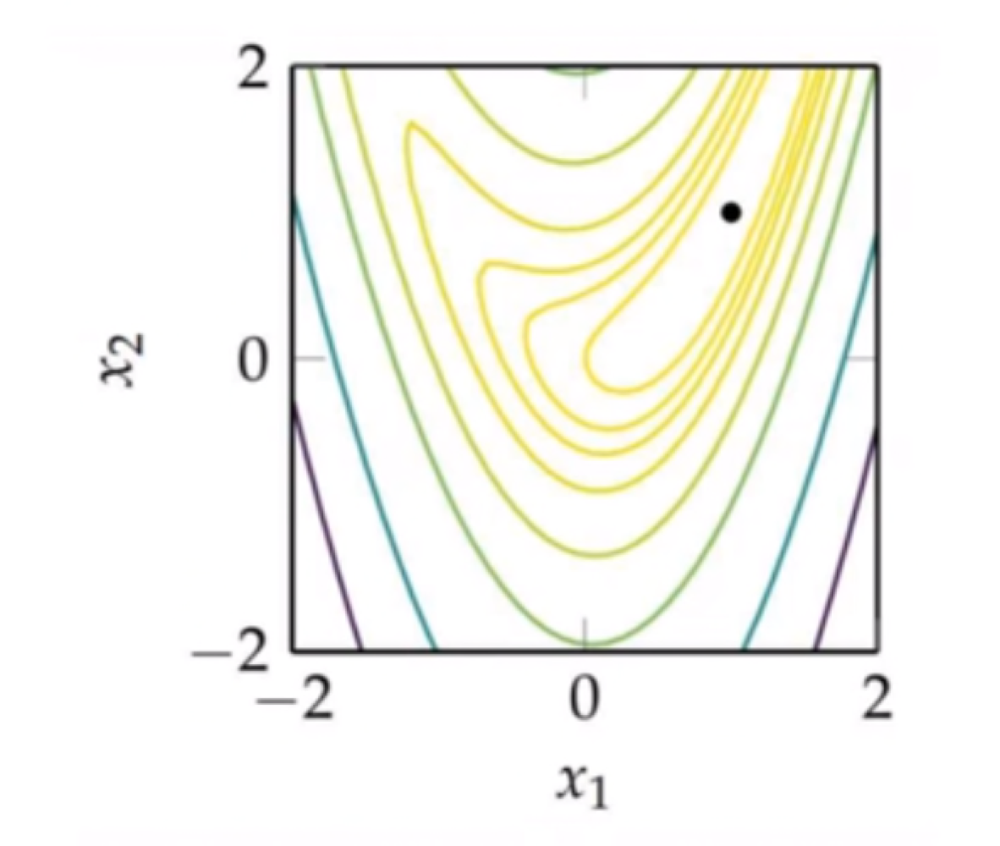

In [18]:
from IPython.display import Image
Image('fig7.png',width=300,height=100)
# Rosenbrock 바나나 펑션: 컨투어 그림. 점이 최소값. 목적함수 값이 가장 작음
# 1,1 값에 가까우면 계산이 잘 이루어짐

In [19]:
## Rosencrock

def f(x,a=1,b=5): #a와 b는 우리가 정할 수 있는 상수
    # 계산이 쉬운 값이 1과 5 -> 디폴트 값!
    y=(a-x[0])**2+b*(x[1]-x[0]**2)**2
    return y

In [20]:
x=sp.IndexedBase('x')
gradients=np.array([sp.diff(f(x),x[i]) for i in range(2)])
grads=sp.lambdify(x,gradients,'numpy')

In [61]:
x_=np.array([-2,2]) #초기점 : 사진에서 왼쪽 상단 점
local_descent_backtracking(f,grads,x_,alpha=1) #alpha를 디폴트 10으로 하면 그림 밖으로 나감
# 앞서 함수값, gradient 값 어떻게 변화는지 계산 값 크기 이용해 최적화 문제 정보 얻을 수 있음
# alpha 작게 한 것은 이 함수의 특성이 범위를 벗어나지 않으려고 함



# 결과
# 2642번 반복 [1,1]에 아주 가까운 값 찾아줌

1: alpha =0.5000
2: alpha =0.2500
3: alpha =0.1250
4: alpha =0.0625
5: alpha =0.0312
0.03125 [-2  2] 29
1 0.03125 [0.6875 2.625 ] 23.260574340820312 5.7394256591796875
1: alpha =0.0156
2 0.015625 [1.63186646 1.95239258] 2.9239853889447027 20.33658895187561
3 0.015625 [1.24974655 2.06342313] 1.320168881254962 1.6038165076897408
4 0.015625 [1.43782283 1.9850549 ] 0.22553848282746347 1.0946303984274985
5 0.015625 [1.38717103 1.99791109] 0.17703599549942528 0.04850248732803819
6 0.015625 [1.40700618 1.98640052] 0.16588077392404574 0.011155221575379543
7 0.015625 [1.39724816 1.98534831] 0.16326625561522218 0.00261451830882356
8 0.015625 [1.39926331 1.98018489] 0.16188585521568646 0.001380400399535714
9 0.015625 [1.39651431 1.97670879] 0.16072334882132844 0.001162506394358026
10 0.015625 [1.39566917 1.97257495] 0.15960022536996402 0.0011231234513644217
11 0.015625 [1.3940697  1.96871831] 0.1584883378966662 0.0011118874732978234
12 0.015625 [1.39277165 1.96476706] 0.1573831273800901 0.0011052

456 0.015625 [1.0478974  1.10183633] 0.0023643746934758425 2.6813076148461765e-05
457 0.015625 [1.04762775 1.1012508 ] 0.002337851409791454 2.6523283684388565e-05
458 0.015625 [1.04735951 1.10066847] 0.00231161496303289 2.6236446758563965e-05
459 0.015625 [1.04709267 1.10008933] 0.00228566242500542 2.595253802746989e-05
460 0.015625 [1.04682723 1.09951335] 0.0022599908946482426 2.567153035717756e-05
461 0.015625 [1.04656318 1.09894052] 0.0022345974978257477 2.539339682249486e-05
462 0.015625 [1.04630052 1.09837083] 0.0022094793871198616 2.5118110705886054e-05
463 0.015625 [1.04603923 1.09780426] 0.002184633741623192 2.4845645496669472e-05
464 0.015625 [1.04577932 1.09724079] 0.0021600577667333022 2.457597488988994e-05
465 0.015625 [1.04552078 1.09668042] 0.002135748693947829 2.4309072785473097e-05
466 0.015625 [1.04526359 1.09612312] 0.0021117037806606407 2.4044913287188472e-05
467 0.015625 [1.04500776 1.09556888] 0.002087920309958946 2.3783470701694513e-05
468 0.015625 [1.04475328 1.0

807 0.015625 [1.00606808 1.01266036] 3.800927712998776e-05 4.6005370120549583e-07
808 0.015625 [1.00603168 1.01258421] 3.755469941242474e-05 4.545777175630239e-07
809 0.015625 [1.0059955  1.01250851] 3.710553295758899e-05 4.4916645483575e-07
810 0.015625 [1.00595953 1.01243326] 3.666171380134292e-05 4.438191562460719e-07
811 0.015625 [1.00592378 1.01235847] 3.622317872763035e-05 4.385350737125696e-07
812 0.015625 [1.00588823 1.01228412] 3.5789865259864835e-05 4.3331346776551236e-07
813 0.015625 [1.0058529  1.01221022] 3.536171165241768e-05 4.2815360744715244e-07
814 0.015625 [1.00581778 1.01213676] 3.4938656882210074e-05 4.2305477020760805e-07
815 0.015625 [1.00578287 1.01206374] 3.4520640640387454e-05 4.1801624182261977e-07
816 0.015625 [1.00574817 1.01199115] 3.410760332408924e-05 4.1303731629821526e-07
817 0.015625 [1.00571367 1.011919  ] 3.369948602832184e-05 4.081172957673984e-07
818 0.015625 [1.00567938 1.01184728] 3.329623053790826e-05 4.032554904135775e-07
819 0.015625 [1.00564

1298 0.015625 [1.00031039 1.00064589] 9.946996437839092e-08 1.2149600878839846e-09
1299 0.015625 [1.00030851 1.00064198] 9.826966162893661e-08 1.2003027494543095e-09
1300 0.015625 [1.00030664 1.00063809] 9.708383945469341e-08 1.1858221742431982e-09
1301 0.015625 [1.00030479 1.00063423] 9.591232322293564e-08 1.1715162317577667e-09
1302 0.015625 [1.00030294 1.00063039] 9.47549404059458e-08 1.1573828169898378e-09
1303 0.015625 [1.00030111 1.00062658] 9.361152055546533e-08 1.1434198504804742e-09
1304 0.015625 [1.00029929 1.00062279] 9.248189527782956e-08 1.1296252776357747e-09
1305 0.015625 [1.00029747 1.00061902] 9.136589820908434e-08 1.1159970687452177e-09
1306 0.015625 [1.00029567 1.00061527] 9.026336499059671e-08 1.102533218487629e-09
1307 0.015625 [1.00029388 1.00061155] 8.917413324493273e-08 1.089231745663983e-09
1308 0.015625 [1.00029211 1.00060784] 8.809804255192732e-08 1.0760906930054037e-09
1309 0.015625 [1.00029034 1.00060416] 8.703493442515029e-08 1.0631081267770316e-09
1310 0.

1756 0.015625 [1.00001924 1.00004002] 3.820413901119682e-10 4.668535187727072e-12
1757 0.015625 [1.00001912 1.00003978] 3.774292147329925e-10 4.6121753789757115e-12
1758 0.015625 [1.000019   1.00003954] 3.7287271878348335e-10 4.55649594950913e-12
1759 0.015625 [1.00001889 1.0000393 ] 3.6837123009704156e-10 4.501488686441793e-12
1760 0.015625 [1.00001877 1.00003906] 3.63924084632099e-10 4.447145464942578e-12
1761 0.015625 [1.00001866 1.00003883] 3.595306263565498e-10 4.393458275549207e-12
1762 0.015625 [1.00001855 1.00003859] 3.5519020715171016e-10 4.340419204839618e-12
1763 0.015625 [1.00001844 1.00003836] 3.509021867317378e-10 4.288020419972379e-12
1764 0.015625 [1.00001832 1.00003812] 3.466659325395233e-10 4.236254192214491e-12
1765 0.015625 [1.00001821 1.00003789] 3.4248081964949154e-10 4.1851128900317436e-12
1766 0.015625 [1.0000181  1.00003766] 3.383462306782429e-10 4.134588971248645e-12
1767 0.015625 [1.00001799 1.00003744] 3.3426155570701075e-10 4.084674971232149e-12
1768 0.0156

2156 0.015625 [1.00000169 1.00000353] 2.9655795516214773e-12 3.624030610263122e-14
2157 0.015625 [1.00000168 1.0000035 ] 2.929776765930745e-12 3.580278569073214e-14
2158 0.015625 [1.00000167 1.00000348] 2.8944062188879764e-12 3.537054704276872e-14
2159 0.015625 [1.00000166 1.00000346] 2.8594626923159675e-12 3.494352657200896e-14
2160 0.015625 [1.00000165 1.00000344] 2.824941030291992e-12 3.452166202397562e-14
2161 0.015625 [1.00000164 1.00000342] 2.7908361405396412e-12 3.410488975235063e-14
2162 0.015625 [1.00000163 1.0000034 ] 2.7571429907331782e-12 3.369314980646299e-14
2163 0.015625 [1.00000162 1.00000338] 2.7238566104753706e-12 3.328638025780764e-14
2164 0.015625 [1.00000161 1.00000336] 2.690972088700732e-12 3.288452177463856e-14
2165 0.015625 [1.0000016  1.00000334] 2.6584845741539602e-12 3.2487514546771763e-14
2166 0.015625 [1.00000159 1.00000332] 2.6263892738569823e-12 3.209530029697798e-14
2167 0.015625 [1.00000159 1.0000033 ] 2.5946814524431693e-12 3.170782141381301e-14
2168 0

2468 0.015625 [1.00000025 1.00000053] 6.703355347133553e-14 8.191727804791136e-16
2469 0.015625 [1.00000025 1.00000053] 6.622427039559442e-14 8.092830757411181e-16
2470 0.015625 [1.00000025 1.00000052] 6.54247576438383e-14 7.99512751756113e-16
2471 0.015625 [1.00000025 1.00000052] 6.463489722928514e-14 7.898604145531605e-16
2472 0.015625 [1.00000025 1.00000052] 6.385457263499054e-14 7.803245942946006e-16
2473 0.015625 [1.00000025 1.00000051] 6.308366879976843e-14 7.709038352221102e-16
2474 0.015625 [1.00000025 1.00000051] 6.232207187403435e-14 7.615969257340826e-16
2475 0.015625 [1.00000024 1.00000051] 6.156966958695307e-14 7.524022870812822e-16
2476 0.015625 [1.00000024 1.00000051] 6.082635096230254e-14 7.433186246505219e-16
2477 0.015625 [1.00000024 1.0000005 ] 6.00920062168948e-14 7.343447454077464e-16
2478 0.015625 [1.00000024 1.0000005 ] 5.936652705199058e-14 7.25479164904216e-16
2479 0.015625 [1.00000024 1.0000005 ] 5.864980646281427e-14 7.167205891763103e-16
2480 0.015625 [1.000

2574 0.015625 [1.00000013 1.00000028] 1.8498471738754276e-14 2.260576429486666e-16
2575 0.015625 [1.00000013 1.00000028] 1.8275143244216754e-14 2.233284945375215e-16
2576 0.015625 [1.00000013 1.00000028] 1.8054510935131755e-14 2.2063230908499962e-16
2577 0.015625 [1.00000013 1.00000027] 1.783654230297905e-14 2.1796863215270608e-16
2578 0.015625 [1.00000013 1.00000027] 1.7621205148042158e-14 2.1533715493689013e-16
2579 0.015625 [1.00000013 1.00000027] 1.7408467727235268e-14 2.1273742080689037e-16
2580 0.015625 [1.00000013 1.00000027] 1.7198298633019564e-14 2.1016909421570363e-16
2581 0.015625 [1.00000013 1.00000027] 1.699066688147191e-14 2.0763175154765543e-16
2582 0.015625 [1.00000013 1.00000027] 1.6785541827197493e-14 2.0512505427441633e-16
2583 0.015625 [1.00000013 1.00000026] 1.6582893206419343e-14 2.0264862077814946e-16
2584 0.015625 [1.00000013 1.00000026] 1.6382691119849908e-14 2.0020208656943483e-16
2585 0.015625 [1.00000013 1.00000026] 1.6184906007032875e-14 1.9778511281703304e

(2643, array([1.00000009, 1.00000018]))

In [62]:
local_descent_strong_backtracking(f,grads,x_,alpha=1)

# 결과
# 412번 반복 : 가까운 값 [1,1] 얻어짐
# Rosenbrock의 바나나 펑션도 strong backtracking 알고리즘이 효율적!
# 얼핏 생각해도 그럴것 같은게 strong_backtracking은 curvature information이용해 단계값 조정
# 훨씬 빠르게 최소값에 접근함.

0.04296875 [-2  2] 29
1 0.008056640625 [1.6953125 2.859375 ] 0.48454131558537483 28.515458684414625
2 1.41796875 [1.68009054 2.86056009] 0.46968847588418516 0.014852839701189668
3 0.009693145751953125 [1.55508884 2.32377576] 0.3527990036892039 0.11688947219498125
4 0.05815887451171875 [1.51583073 2.33293825] 0.2722749410924204 0.08052406259678352
5 0.010904788970947266 [1.5178864  2.31246897] 0.2685667096461876 0.0037082314462327792
6 0.1308574676513672 [1.50940203 2.31154317] 0.265017801941659 0.003548907704528592
7 0.010223239660263062 [1.50742715 2.2680348 ] 0.25757483543332377 0.007442966508335258
8 0.49071550369262695 [1.49572617 2.26847459] 0.2506359423263479 0.006938893106975874
9 0.011501144617795944 [1.46834859 2.11498945] 0.22777924840091998 0.022856693925427912
10 0.025877575390040874 [1.44370796 2.11971161] 0.20314925819195728 0.0246299902089627
11 0.019408181542530656 [1.44720857 2.11054605] 0.20129694008923835 0.0018523181027189362
12 0.019408181542530656 [1.43891256 2.10

(412, array([1.00000002, 1.00000004]))

In [63]:
x_=np.array([-2,2])
local_descent_backtracking(f,grads,x_,2)
# alpha값을 2라고 했더니 alpha값 계산 못해줌
# 딥러닝: 터졌다!!
# 초기값 잘못설정한 것

# interupt 하세요!!

C:\Users\koh99\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in long_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
<string>:2: RuntimeWarning: overflow encountered in long_scalars


2 [-2  2] 29
1 2 [170  42] -131017915 131017944
2 2 [-196234906     577202] -987820627 856802712
1: alpha =1.0000
2: alpha =0.5000
3: alpha =0.2500
4: alpha =0.1250
5: alpha =0.0625
6: alpha =0.0312
7: alpha =0.0156
8: alpha =0.0078
9: alpha =0.0039
10: alpha =0.0020
11: alpha =0.0010
12: alpha =0.0005
13: alpha =0.0002
14: alpha =0.0001
15: alpha =0.0001
16: alpha =0.0000
17: alpha =0.0000
18: alpha =0.0000
19: alpha =0.0000
20: alpha =0.0000
21: alpha =0.0000
22: alpha =0.0000
23: alpha =0.0000
24: alpha =0.0000
25: alpha =0.0000
26: alpha =0.0000
27: alpha =0.0000
28: alpha =0.0000
29: alpha =0.0000
30: alpha =0.0000
31: alpha =0.0000
32: alpha =0.0000
33: alpha =0.0000
34: alpha =0.0000
35: alpha =0.0000
36: alpha =0.0000
37: alpha =0.0000
38: alpha =0.0000
39: alpha =0.0000
40: alpha =0.0000
41: alpha =0.0000
42: alpha =0.0000
43: alpha =0.0000
44: alpha =0.0000
45: alpha =0.0000
46: alpha =0.0000
47: alpha =0.0000
48: alpha =0.0000
49: alpha =0.0000
50: alpha =0.0000
51: alpha =0

2094: alpha =0.0000
2095: alpha =0.0000
2096: alpha =0.0000
2097: alpha =0.0000
2098: alpha =0.0000
2099: alpha =0.0000
2100: alpha =0.0000
2101: alpha =0.0000
2102: alpha =0.0000
2103: alpha =0.0000
2104: alpha =0.0000
2105: alpha =0.0000
2106: alpha =0.0000
2107: alpha =0.0000
2108: alpha =0.0000
2109: alpha =0.0000
2110: alpha =0.0000
2111: alpha =0.0000
2112: alpha =0.0000
2113: alpha =0.0000
2114: alpha =0.0000
2115: alpha =0.0000
2116: alpha =0.0000
2117: alpha =0.0000
2118: alpha =0.0000
2119: alpha =0.0000
2120: alpha =0.0000
2121: alpha =0.0000
2122: alpha =0.0000
2123: alpha =0.0000
2124: alpha =0.0000
2125: alpha =0.0000
2126: alpha =0.0000
2127: alpha =0.0000
2128: alpha =0.0000
2129: alpha =0.0000
2130: alpha =0.0000
2131: alpha =0.0000
2132: alpha =0.0000
2133: alpha =0.0000
2134: alpha =0.0000
2135: alpha =0.0000
2136: alpha =0.0000
2137: alpha =0.0000
2138: alpha =0.0000
2139: alpha =0.0000
2140: alpha =0.0000
2141: alpha =0.0000
2142: alpha =0.0000
2143: alpha =0.0000


4247: alpha =0.0000
4248: alpha =0.0000
4249: alpha =0.0000
4250: alpha =0.0000
4251: alpha =0.0000
4252: alpha =0.0000
4253: alpha =0.0000
4254: alpha =0.0000
4255: alpha =0.0000
4256: alpha =0.0000
4257: alpha =0.0000
4258: alpha =0.0000
4259: alpha =0.0000
4260: alpha =0.0000
4261: alpha =0.0000
4262: alpha =0.0000
4263: alpha =0.0000
4264: alpha =0.0000
4265: alpha =0.0000
4266: alpha =0.0000
4267: alpha =0.0000
4268: alpha =0.0000
4269: alpha =0.0000
4270: alpha =0.0000
4271: alpha =0.0000
4272: alpha =0.0000
4273: alpha =0.0000
4274: alpha =0.0000
4275: alpha =0.0000
4276: alpha =0.0000
4277: alpha =0.0000
4278: alpha =0.0000
4279: alpha =0.0000
4280: alpha =0.0000
4281: alpha =0.0000
4282: alpha =0.0000
4283: alpha =0.0000
4284: alpha =0.0000
4285: alpha =0.0000
4286: alpha =0.0000
4287: alpha =0.0000
4288: alpha =0.0000
4289: alpha =0.0000
4290: alpha =0.0000
4291: alpha =0.0000
4292: alpha =0.0000
4293: alpha =0.0000
4294: alpha =0.0000
4295: alpha =0.0000
4296: alpha =0.0000


6755: alpha =0.0000
6756: alpha =0.0000
6757: alpha =0.0000
6758: alpha =0.0000
6759: alpha =0.0000
6760: alpha =0.0000
6761: alpha =0.0000
6762: alpha =0.0000
6763: alpha =0.0000
6764: alpha =0.0000
6765: alpha =0.0000
6766: alpha =0.0000
6767: alpha =0.0000
6768: alpha =0.0000
6769: alpha =0.0000
6770: alpha =0.0000
6771: alpha =0.0000
6772: alpha =0.0000
6773: alpha =0.0000
6774: alpha =0.0000
6775: alpha =0.0000
6776: alpha =0.0000
6777: alpha =0.0000
6778: alpha =0.0000
6779: alpha =0.0000
6780: alpha =0.0000
6781: alpha =0.0000
6782: alpha =0.0000
6783: alpha =0.0000
6784: alpha =0.0000
6785: alpha =0.0000
6786: alpha =0.0000
6787: alpha =0.0000
6788: alpha =0.0000
6789: alpha =0.0000
6790: alpha =0.0000
6791: alpha =0.0000
6792: alpha =0.0000
6793: alpha =0.0000
6794: alpha =0.0000
6795: alpha =0.0000
6796: alpha =0.0000
6797: alpha =0.0000
6798: alpha =0.0000
6799: alpha =0.0000
6800: alpha =0.0000
6801: alpha =0.0000
6802: alpha =0.0000
6803: alpha =0.0000
6804: alpha =0.0000


9451: alpha =0.0000
9452: alpha =0.0000
9453: alpha =0.0000
9454: alpha =0.0000
9455: alpha =0.0000
9456: alpha =0.0000
9457: alpha =0.0000
9458: alpha =0.0000
9459: alpha =0.0000
9460: alpha =0.0000
9461: alpha =0.0000
9462: alpha =0.0000
9463: alpha =0.0000
9464: alpha =0.0000
9465: alpha =0.0000
9466: alpha =0.0000
9467: alpha =0.0000
9468: alpha =0.0000
9469: alpha =0.0000
9470: alpha =0.0000
9471: alpha =0.0000
9472: alpha =0.0000
9473: alpha =0.0000
9474: alpha =0.0000
9475: alpha =0.0000
9476: alpha =0.0000
9477: alpha =0.0000
9478: alpha =0.0000
9479: alpha =0.0000
9480: alpha =0.0000
9481: alpha =0.0000
9482: alpha =0.0000
9483: alpha =0.0000
9484: alpha =0.0000
9485: alpha =0.0000
9486: alpha =0.0000
9487: alpha =0.0000
9488: alpha =0.0000
9489: alpha =0.0000
9490: alpha =0.0000
9491: alpha =0.0000
9492: alpha =0.0000
9493: alpha =0.0000
9494: alpha =0.0000
9495: alpha =0.0000
9496: alpha =0.0000
9497: alpha =0.0000
9498: alpha =0.0000
9499: alpha =0.0000
9500: alpha =0.0000


11731: alpha =0.0000
11732: alpha =0.0000
11733: alpha =0.0000
11734: alpha =0.0000
11735: alpha =0.0000
11736: alpha =0.0000
11737: alpha =0.0000
11738: alpha =0.0000
11739: alpha =0.0000
11740: alpha =0.0000
11741: alpha =0.0000
11742: alpha =0.0000
11743: alpha =0.0000
11744: alpha =0.0000
11745: alpha =0.0000
11746: alpha =0.0000
11747: alpha =0.0000
11748: alpha =0.0000
11749: alpha =0.0000
11750: alpha =0.0000
11751: alpha =0.0000
11752: alpha =0.0000
11753: alpha =0.0000
11754: alpha =0.0000
11755: alpha =0.0000
11756: alpha =0.0000
11757: alpha =0.0000
11758: alpha =0.0000
11759: alpha =0.0000
11760: alpha =0.0000
11761: alpha =0.0000
11762: alpha =0.0000
11763: alpha =0.0000
11764: alpha =0.0000
11765: alpha =0.0000
11766: alpha =0.0000
11767: alpha =0.0000
11768: alpha =0.0000
11769: alpha =0.0000
11770: alpha =0.0000
11771: alpha =0.0000
11772: alpha =0.0000
11773: alpha =0.0000
11774: alpha =0.0000
11775: alpha =0.0000
11776: alpha =0.0000
11777: alpha =0.0000
11778: alpha 

14241: alpha =0.0000
14242: alpha =0.0000
14243: alpha =0.0000
14244: alpha =0.0000
14245: alpha =0.0000
14246: alpha =0.0000
14247: alpha =0.0000
14248: alpha =0.0000
14249: alpha =0.0000
14250: alpha =0.0000
14251: alpha =0.0000
14252: alpha =0.0000
14253: alpha =0.0000
14254: alpha =0.0000
14255: alpha =0.0000
14256: alpha =0.0000
14257: alpha =0.0000
14258: alpha =0.0000
14259: alpha =0.0000
14260: alpha =0.0000
14261: alpha =0.0000
14262: alpha =0.0000
14263: alpha =0.0000
14264: alpha =0.0000
14265: alpha =0.0000
14266: alpha =0.0000
14267: alpha =0.0000
14268: alpha =0.0000
14269: alpha =0.0000
14270: alpha =0.0000
14271: alpha =0.0000
14272: alpha =0.0000
14273: alpha =0.0000
14274: alpha =0.0000
14275: alpha =0.0000
14276: alpha =0.0000
14277: alpha =0.0000
14278: alpha =0.0000
14279: alpha =0.0000
14280: alpha =0.0000
14281: alpha =0.0000
14282: alpha =0.0000
14283: alpha =0.0000
14284: alpha =0.0000
14285: alpha =0.0000
14286: alpha =0.0000
14287: alpha =0.0000
14288: alpha 

15788: alpha =0.0000
15789: alpha =0.0000
15790: alpha =0.0000
15791: alpha =0.0000
15792: alpha =0.0000
15793: alpha =0.0000
15794: alpha =0.0000
15795: alpha =0.0000
15796: alpha =0.0000
15797: alpha =0.0000
15798: alpha =0.0000
15799: alpha =0.0000
15800: alpha =0.0000
15801: alpha =0.0000
15802: alpha =0.0000
15803: alpha =0.0000
15804: alpha =0.0000
15805: alpha =0.0000
15806: alpha =0.0000
15807: alpha =0.0000
15808: alpha =0.0000
15809: alpha =0.0000
15810: alpha =0.0000
15811: alpha =0.0000
15812: alpha =0.0000
15813: alpha =0.0000
15814: alpha =0.0000
15815: alpha =0.0000
15816: alpha =0.0000
15817: alpha =0.0000
15818: alpha =0.0000
15819: alpha =0.0000
15820: alpha =0.0000
15821: alpha =0.0000
15822: alpha =0.0000
15823: alpha =0.0000
15824: alpha =0.0000
15825: alpha =0.0000
15826: alpha =0.0000
15827: alpha =0.0000
15828: alpha =0.0000
15829: alpha =0.0000
15830: alpha =0.0000
15831: alpha =0.0000
15832: alpha =0.0000
15833: alpha =0.0000
15834: alpha =0.0000
15835: alpha 

17274: alpha =0.0000
17275: alpha =0.0000
17276: alpha =0.0000
17277: alpha =0.0000
17278: alpha =0.0000
17279: alpha =0.0000
17280: alpha =0.0000
17281: alpha =0.0000
17282: alpha =0.0000
17283: alpha =0.0000
17284: alpha =0.0000
17285: alpha =0.0000
17286: alpha =0.0000
17287: alpha =0.0000
17288: alpha =0.0000
17289: alpha =0.0000
17290: alpha =0.0000
17291: alpha =0.0000
17292: alpha =0.0000
17293: alpha =0.0000
17294: alpha =0.0000
17295: alpha =0.0000
17296: alpha =0.0000
17297: alpha =0.0000
17298: alpha =0.0000
17299: alpha =0.0000
17300: alpha =0.0000
17301: alpha =0.0000
17302: alpha =0.0000
17303: alpha =0.0000
17304: alpha =0.0000
17305: alpha =0.0000
17306: alpha =0.0000
17307: alpha =0.0000
17308: alpha =0.0000
17309: alpha =0.0000
17310: alpha =0.0000
17311: alpha =0.0000
17312: alpha =0.0000
17313: alpha =0.0000
17314: alpha =0.0000
17315: alpha =0.0000
17316: alpha =0.0000
17317: alpha =0.0000
17318: alpha =0.0000
17319: alpha =0.0000
17320: alpha =0.0000
17321: alpha 

18605: alpha =0.0000
18606: alpha =0.0000
18607: alpha =0.0000
18608: alpha =0.0000
18609: alpha =0.0000
18610: alpha =0.0000
18611: alpha =0.0000
18612: alpha =0.0000
18613: alpha =0.0000
18614: alpha =0.0000
18615: alpha =0.0000
18616: alpha =0.0000
18617: alpha =0.0000
18618: alpha =0.0000
18619: alpha =0.0000
18620: alpha =0.0000
18621: alpha =0.0000
18622: alpha =0.0000
18623: alpha =0.0000
18624: alpha =0.0000
18625: alpha =0.0000
18626: alpha =0.0000
18627: alpha =0.0000
18628: alpha =0.0000
18629: alpha =0.0000
18630: alpha =0.0000
18631: alpha =0.0000
18632: alpha =0.0000
18633: alpha =0.0000
18634: alpha =0.0000
18635: alpha =0.0000
18636: alpha =0.0000
18637: alpha =0.0000
18638: alpha =0.0000
18639: alpha =0.0000
18640: alpha =0.0000
18641: alpha =0.0000
18642: alpha =0.0000
18643: alpha =0.0000
18644: alpha =0.0000
18645: alpha =0.0000
18646: alpha =0.0000
18647: alpha =0.0000
18648: alpha =0.0000
18649: alpha =0.0000
18650: alpha =0.0000
18651: alpha =0.0000
18652: alpha 

19969: alpha =0.0000
19970: alpha =0.0000
19971: alpha =0.0000
19972: alpha =0.0000
19973: alpha =0.0000
19974: alpha =0.0000
19975: alpha =0.0000
19976: alpha =0.0000
19977: alpha =0.0000
19978: alpha =0.0000
19979: alpha =0.0000
19980: alpha =0.0000
19981: alpha =0.0000
19982: alpha =0.0000
19983: alpha =0.0000
19984: alpha =0.0000
19985: alpha =0.0000
19986: alpha =0.0000
19987: alpha =0.0000
19988: alpha =0.0000
19989: alpha =0.0000
19990: alpha =0.0000
19991: alpha =0.0000
19992: alpha =0.0000
19993: alpha =0.0000
19994: alpha =0.0000
19995: alpha =0.0000
19996: alpha =0.0000
19997: alpha =0.0000
19998: alpha =0.0000
19999: alpha =0.0000
20000: alpha =0.0000
20001: alpha =0.0000
20002: alpha =0.0000
20003: alpha =0.0000
20004: alpha =0.0000
20005: alpha =0.0000
20006: alpha =0.0000
20007: alpha =0.0000
20008: alpha =0.0000
20009: alpha =0.0000
20010: alpha =0.0000
20011: alpha =0.0000
20012: alpha =0.0000
20013: alpha =0.0000
20014: alpha =0.0000
20015: alpha =0.0000
20016: alpha 

21437: alpha =0.0000
21438: alpha =0.0000
21439: alpha =0.0000
21440: alpha =0.0000
21441: alpha =0.0000
21442: alpha =0.0000
21443: alpha =0.0000
21444: alpha =0.0000
21445: alpha =0.0000
21446: alpha =0.0000
21447: alpha =0.0000
21448: alpha =0.0000
21449: alpha =0.0000
21450: alpha =0.0000
21451: alpha =0.0000
21452: alpha =0.0000
21453: alpha =0.0000
21454: alpha =0.0000
21455: alpha =0.0000
21456: alpha =0.0000
21457: alpha =0.0000
21458: alpha =0.0000
21459: alpha =0.0000
21460: alpha =0.0000
21461: alpha =0.0000
21462: alpha =0.0000
21463: alpha =0.0000
21464: alpha =0.0000
21465: alpha =0.0000
21466: alpha =0.0000
21467: alpha =0.0000
21468: alpha =0.0000
21469: alpha =0.0000
21470: alpha =0.0000
21471: alpha =0.0000
21472: alpha =0.0000
21473: alpha =0.0000
21474: alpha =0.0000
21475: alpha =0.0000
21476: alpha =0.0000
21477: alpha =0.0000
21478: alpha =0.0000
21479: alpha =0.0000
21480: alpha =0.0000
21481: alpha =0.0000
21482: alpha =0.0000
21483: alpha =0.0000
21484: alpha 

22553: alpha =0.0000
22554: alpha =0.0000
22555: alpha =0.0000
22556: alpha =0.0000
22557: alpha =0.0000
22558: alpha =0.0000
22559: alpha =0.0000
22560: alpha =0.0000
22561: alpha =0.0000
22562: alpha =0.0000
22563: alpha =0.0000
22564: alpha =0.0000
22565: alpha =0.0000
22566: alpha =0.0000
22567: alpha =0.0000
22568: alpha =0.0000
22569: alpha =0.0000
22570: alpha =0.0000
22571: alpha =0.0000
22572: alpha =0.0000
22573: alpha =0.0000
22574: alpha =0.0000
22575: alpha =0.0000
22576: alpha =0.0000
22577: alpha =0.0000
22578: alpha =0.0000
22579: alpha =0.0000
22580: alpha =0.0000
22581: alpha =0.0000
22582: alpha =0.0000
22583: alpha =0.0000
22584: alpha =0.0000
22585: alpha =0.0000
22586: alpha =0.0000
22587: alpha =0.0000
22588: alpha =0.0000
22589: alpha =0.0000
22590: alpha =0.0000
22591: alpha =0.0000
22592: alpha =0.0000
22593: alpha =0.0000
22594: alpha =0.0000
22595: alpha =0.0000
22596: alpha =0.0000
22597: alpha =0.0000
22598: alpha =0.0000
22599: alpha =0.0000
22600: alpha 

24124: alpha =0.0000
24125: alpha =0.0000
24126: alpha =0.0000
24127: alpha =0.0000
24128: alpha =0.0000
24129: alpha =0.0000
24130: alpha =0.0000
24131: alpha =0.0000
24132: alpha =0.0000
24133: alpha =0.0000
24134: alpha =0.0000
24135: alpha =0.0000
24136: alpha =0.0000
24137: alpha =0.0000
24138: alpha =0.0000
24139: alpha =0.0000
24140: alpha =0.0000
24141: alpha =0.0000
24142: alpha =0.0000
24143: alpha =0.0000
24144: alpha =0.0000
24145: alpha =0.0000
24146: alpha =0.0000
24147: alpha =0.0000
24148: alpha =0.0000
24149: alpha =0.0000
24150: alpha =0.0000
24151: alpha =0.0000
24152: alpha =0.0000
24153: alpha =0.0000
24154: alpha =0.0000
24155: alpha =0.0000
24156: alpha =0.0000
24157: alpha =0.0000
24158: alpha =0.0000
24159: alpha =0.0000
24160: alpha =0.0000
24161: alpha =0.0000
24162: alpha =0.0000
24163: alpha =0.0000
24164: alpha =0.0000
24165: alpha =0.0000
24166: alpha =0.0000
24167: alpha =0.0000
24168: alpha =0.0000
24169: alpha =0.0000
24170: alpha =0.0000
24171: alpha 

26325: alpha =0.0000
26326: alpha =0.0000
26327: alpha =0.0000
26328: alpha =0.0000
26329: alpha =0.0000
26330: alpha =0.0000
26331: alpha =0.0000
26332: alpha =0.0000
26333: alpha =0.0000
26334: alpha =0.0000
26335: alpha =0.0000
26336: alpha =0.0000
26337: alpha =0.0000
26338: alpha =0.0000
26339: alpha =0.0000
26340: alpha =0.0000
26341: alpha =0.0000
26342: alpha =0.0000
26343: alpha =0.0000
26344: alpha =0.0000
26345: alpha =0.0000
26346: alpha =0.0000
26347: alpha =0.0000
26348: alpha =0.0000
26349: alpha =0.0000
26350: alpha =0.0000
26351: alpha =0.0000
26352: alpha =0.0000
26353: alpha =0.0000
26354: alpha =0.0000
26355: alpha =0.0000
26356: alpha =0.0000
26357: alpha =0.0000
26358: alpha =0.0000
26359: alpha =0.0000
26360: alpha =0.0000
26361: alpha =0.0000
26362: alpha =0.0000
26363: alpha =0.0000
26364: alpha =0.0000
26365: alpha =0.0000
26366: alpha =0.0000
26367: alpha =0.0000
26368: alpha =0.0000
26369: alpha =0.0000
26370: alpha =0.0000
26371: alpha =0.0000
26372: alpha 

28642: alpha =0.0000
28643: alpha =0.0000
28644: alpha =0.0000
28645: alpha =0.0000
28646: alpha =0.0000
28647: alpha =0.0000
28648: alpha =0.0000
28649: alpha =0.0000
28650: alpha =0.0000
28651: alpha =0.0000
28652: alpha =0.0000
28653: alpha =0.0000
28654: alpha =0.0000
28655: alpha =0.0000
28656: alpha =0.0000
28657: alpha =0.0000
28658: alpha =0.0000
28659: alpha =0.0000
28660: alpha =0.0000
28661: alpha =0.0000
28662: alpha =0.0000
28663: alpha =0.0000
28664: alpha =0.0000
28665: alpha =0.0000
28666: alpha =0.0000
28667: alpha =0.0000
28668: alpha =0.0000
28669: alpha =0.0000
28670: alpha =0.0000
28671: alpha =0.0000
28672: alpha =0.0000
28673: alpha =0.0000
28674: alpha =0.0000
28675: alpha =0.0000
28676: alpha =0.0000
28677: alpha =0.0000
28678: alpha =0.0000
28679: alpha =0.0000
28680: alpha =0.0000
28681: alpha =0.0000
28682: alpha =0.0000
28683: alpha =0.0000
28684: alpha =0.0000
28685: alpha =0.0000
28686: alpha =0.0000
28687: alpha =0.0000
28688: alpha =0.0000
28689: alpha 

31135: alpha =0.0000
31136: alpha =0.0000
31137: alpha =0.0000
31138: alpha =0.0000
31139: alpha =0.0000
31140: alpha =0.0000
31141: alpha =0.0000
31142: alpha =0.0000
31143: alpha =0.0000
31144: alpha =0.0000
31145: alpha =0.0000
31146: alpha =0.0000
31147: alpha =0.0000
31148: alpha =0.0000
31149: alpha =0.0000
31150: alpha =0.0000
31151: alpha =0.0000
31152: alpha =0.0000
31153: alpha =0.0000
31154: alpha =0.0000
31155: alpha =0.0000
31156: alpha =0.0000
31157: alpha =0.0000
31158: alpha =0.0000
31159: alpha =0.0000
31160: alpha =0.0000
31161: alpha =0.0000
31162: alpha =0.0000
31163: alpha =0.0000
31164: alpha =0.0000
31165: alpha =0.0000
31166: alpha =0.0000
31167: alpha =0.0000
31168: alpha =0.0000
31169: alpha =0.0000
31170: alpha =0.0000
31171: alpha =0.0000
31172: alpha =0.0000
31173: alpha =0.0000
31174: alpha =0.0000
31175: alpha =0.0000
31176: alpha =0.0000
31177: alpha =0.0000
31178: alpha =0.0000
31179: alpha =0.0000
31180: alpha =0.0000
31181: alpha =0.0000
31182: alpha 

33966: alpha =0.0000
33967: alpha =0.0000
33968: alpha =0.0000
33969: alpha =0.0000
33970: alpha =0.0000
33971: alpha =0.0000
33972: alpha =0.0000
33973: alpha =0.0000
33974: alpha =0.0000
33975: alpha =0.0000
33976: alpha =0.0000
33977: alpha =0.0000
33978: alpha =0.0000
33979: alpha =0.0000
33980: alpha =0.0000
33981: alpha =0.0000
33982: alpha =0.0000
33983: alpha =0.0000
33984: alpha =0.0000
33985: alpha =0.0000
33986: alpha =0.0000
33987: alpha =0.0000
33988: alpha =0.0000
33989: alpha =0.0000
33990: alpha =0.0000
33991: alpha =0.0000
33992: alpha =0.0000
33993: alpha =0.0000
33994: alpha =0.0000
33995: alpha =0.0000
33996: alpha =0.0000
33997: alpha =0.0000
33998: alpha =0.0000
33999: alpha =0.0000
34000: alpha =0.0000
34001: alpha =0.0000
34002: alpha =0.0000
34003: alpha =0.0000
34004: alpha =0.0000
34005: alpha =0.0000
34006: alpha =0.0000
34007: alpha =0.0000
34008: alpha =0.0000
34009: alpha =0.0000
34010: alpha =0.0000
34011: alpha =0.0000
34012: alpha =0.0000
34013: alpha 

36965: alpha =0.0000
36966: alpha =0.0000
36967: alpha =0.0000
36968: alpha =0.0000
36969: alpha =0.0000
36970: alpha =0.0000
36971: alpha =0.0000
36972: alpha =0.0000
36973: alpha =0.0000
36974: alpha =0.0000
36975: alpha =0.0000
36976: alpha =0.0000
36977: alpha =0.0000
36978: alpha =0.0000
36979: alpha =0.0000
36980: alpha =0.0000
36981: alpha =0.0000
36982: alpha =0.0000
36983: alpha =0.0000
36984: alpha =0.0000
36985: alpha =0.0000
36986: alpha =0.0000
36987: alpha =0.0000
36988: alpha =0.0000
36989: alpha =0.0000
36990: alpha =0.0000
36991: alpha =0.0000
36992: alpha =0.0000
36993: alpha =0.0000
36994: alpha =0.0000
36995: alpha =0.0000
36996: alpha =0.0000
36997: alpha =0.0000
36998: alpha =0.0000
36999: alpha =0.0000
37000: alpha =0.0000
37001: alpha =0.0000
37002: alpha =0.0000
37003: alpha =0.0000
37004: alpha =0.0000
37005: alpha =0.0000
37006: alpha =0.0000
37007: alpha =0.0000
37008: alpha =0.0000
37009: alpha =0.0000
37010: alpha =0.0000
37011: alpha =0.0000
37012: alpha 

39965: alpha =0.0000
39966: alpha =0.0000
39967: alpha =0.0000
39968: alpha =0.0000
39969: alpha =0.0000
39970: alpha =0.0000
39971: alpha =0.0000
39972: alpha =0.0000
39973: alpha =0.0000
39974: alpha =0.0000
39975: alpha =0.0000
39976: alpha =0.0000
39977: alpha =0.0000
39978: alpha =0.0000
39979: alpha =0.0000
39980: alpha =0.0000
39981: alpha =0.0000
39982: alpha =0.0000
39983: alpha =0.0000
39984: alpha =0.0000
39985: alpha =0.0000
39986: alpha =0.0000
39987: alpha =0.0000
39988: alpha =0.0000
39989: alpha =0.0000
39990: alpha =0.0000
39991: alpha =0.0000
39992: alpha =0.0000
39993: alpha =0.0000
39994: alpha =0.0000
39995: alpha =0.0000
39996: alpha =0.0000
39997: alpha =0.0000
39998: alpha =0.0000
39999: alpha =0.0000
40000: alpha =0.0000
40001: alpha =0.0000
40002: alpha =0.0000
40003: alpha =0.0000
40004: alpha =0.0000
40005: alpha =0.0000
40006: alpha =0.0000
40007: alpha =0.0000
40008: alpha =0.0000
40009: alpha =0.0000
40010: alpha =0.0000
40011: alpha =0.0000
40012: alpha 

42964: alpha =0.0000
42965: alpha =0.0000
42966: alpha =0.0000
42967: alpha =0.0000
42968: alpha =0.0000
42969: alpha =0.0000
42970: alpha =0.0000
42971: alpha =0.0000
42972: alpha =0.0000
42973: alpha =0.0000
42974: alpha =0.0000
42975: alpha =0.0000
42976: alpha =0.0000
42977: alpha =0.0000
42978: alpha =0.0000
42979: alpha =0.0000
42980: alpha =0.0000
42981: alpha =0.0000
42982: alpha =0.0000
42983: alpha =0.0000
42984: alpha =0.0000
42985: alpha =0.0000
42986: alpha =0.0000
42987: alpha =0.0000
42988: alpha =0.0000
42989: alpha =0.0000
42990: alpha =0.0000
42991: alpha =0.0000
42992: alpha =0.0000
42993: alpha =0.0000
42994: alpha =0.0000
42995: alpha =0.0000
42996: alpha =0.0000
42997: alpha =0.0000
42998: alpha =0.0000
42999: alpha =0.0000
43000: alpha =0.0000
43001: alpha =0.0000
43002: alpha =0.0000
43003: alpha =0.0000
43004: alpha =0.0000
43005: alpha =0.0000
43006: alpha =0.0000
43007: alpha =0.0000
43008: alpha =0.0000
43009: alpha =0.0000
43010: alpha =0.0000
43011: alpha 

45964: alpha =0.0000
45965: alpha =0.0000
45966: alpha =0.0000
45967: alpha =0.0000
45968: alpha =0.0000
45969: alpha =0.0000
45970: alpha =0.0000
45971: alpha =0.0000
45972: alpha =0.0000
45973: alpha =0.0000
45974: alpha =0.0000
45975: alpha =0.0000
45976: alpha =0.0000
45977: alpha =0.0000
45978: alpha =0.0000
45979: alpha =0.0000
45980: alpha =0.0000
45981: alpha =0.0000
45982: alpha =0.0000
45983: alpha =0.0000
45984: alpha =0.0000
45985: alpha =0.0000
45986: alpha =0.0000
45987: alpha =0.0000
45988: alpha =0.0000
45989: alpha =0.0000
45990: alpha =0.0000
45991: alpha =0.0000
45992: alpha =0.0000
45993: alpha =0.0000
45994: alpha =0.0000
45995: alpha =0.0000
45996: alpha =0.0000
45997: alpha =0.0000
45998: alpha =0.0000
45999: alpha =0.0000
46000: alpha =0.0000
46001: alpha =0.0000
46002: alpha =0.0000
46003: alpha =0.0000
46004: alpha =0.0000
46005: alpha =0.0000
46006: alpha =0.0000
46007: alpha =0.0000
46008: alpha =0.0000
46009: alpha =0.0000
46010: alpha =0.0000
46011: alpha 

48806: alpha =0.0000
48807: alpha =0.0000
48808: alpha =0.0000
48809: alpha =0.0000
48810: alpha =0.0000
48811: alpha =0.0000
48812: alpha =0.0000
48813: alpha =0.0000
48814: alpha =0.0000
48815: alpha =0.0000
48816: alpha =0.0000
48817: alpha =0.0000
48818: alpha =0.0000
48819: alpha =0.0000
48820: alpha =0.0000
48821: alpha =0.0000
48822: alpha =0.0000
48823: alpha =0.0000
48824: alpha =0.0000
48825: alpha =0.0000
48826: alpha =0.0000
48827: alpha =0.0000
48828: alpha =0.0000
48829: alpha =0.0000
48830: alpha =0.0000
48831: alpha =0.0000
48832: alpha =0.0000
48833: alpha =0.0000
48834: alpha =0.0000
48835: alpha =0.0000
48836: alpha =0.0000
48837: alpha =0.0000
48838: alpha =0.0000
48839: alpha =0.0000
48840: alpha =0.0000
48841: alpha =0.0000
48842: alpha =0.0000
48843: alpha =0.0000
48844: alpha =0.0000
48845: alpha =0.0000
48846: alpha =0.0000
48847: alpha =0.0000
48848: alpha =0.0000
48849: alpha =0.0000
48850: alpha =0.0000
48851: alpha =0.0000
48852: alpha =0.0000
48853: alpha 

51351: alpha =0.0000
51352: alpha =0.0000
51353: alpha =0.0000
51354: alpha =0.0000
51355: alpha =0.0000
51356: alpha =0.0000
51357: alpha =0.0000
51358: alpha =0.0000
51359: alpha =0.0000
51360: alpha =0.0000
51361: alpha =0.0000
51362: alpha =0.0000
51363: alpha =0.0000
51364: alpha =0.0000
51365: alpha =0.0000
51366: alpha =0.0000
51367: alpha =0.0000
51368: alpha =0.0000
51369: alpha =0.0000
51370: alpha =0.0000
51371: alpha =0.0000
51372: alpha =0.0000
51373: alpha =0.0000
51374: alpha =0.0000
51375: alpha =0.0000
51376: alpha =0.0000
51377: alpha =0.0000
51378: alpha =0.0000
51379: alpha =0.0000
51380: alpha =0.0000
51381: alpha =0.0000
51382: alpha =0.0000
51383: alpha =0.0000
51384: alpha =0.0000
51385: alpha =0.0000
51386: alpha =0.0000
51387: alpha =0.0000
51388: alpha =0.0000
51389: alpha =0.0000
51390: alpha =0.0000
51391: alpha =0.0000
51392: alpha =0.0000
51393: alpha =0.0000
51394: alpha =0.0000
51395: alpha =0.0000
51396: alpha =0.0000
51397: alpha =0.0000
51398: alpha 

52965: alpha =0.0000
52966: alpha =0.0000
52967: alpha =0.0000
52968: alpha =0.0000
52969: alpha =0.0000
52970: alpha =0.0000
52971: alpha =0.0000
52972: alpha =0.0000
52973: alpha =0.0000
52974: alpha =0.0000
52975: alpha =0.0000
52976: alpha =0.0000
52977: alpha =0.0000
52978: alpha =0.0000
52979: alpha =0.0000
52980: alpha =0.0000
52981: alpha =0.0000
52982: alpha =0.0000
52983: alpha =0.0000
52984: alpha =0.0000
52985: alpha =0.0000
52986: alpha =0.0000
52987: alpha =0.0000
52988: alpha =0.0000
52989: alpha =0.0000
52990: alpha =0.0000
52991: alpha =0.0000
52992: alpha =0.0000
52993: alpha =0.0000
52994: alpha =0.0000
52995: alpha =0.0000
52996: alpha =0.0000
52997: alpha =0.0000
52998: alpha =0.0000
52999: alpha =0.0000
53000: alpha =0.0000
53001: alpha =0.0000
53002: alpha =0.0000
53003: alpha =0.0000
53004: alpha =0.0000
53005: alpha =0.0000
53006: alpha =0.0000
53007: alpha =0.0000
53008: alpha =0.0000
53009: alpha =0.0000
53010: alpha =0.0000
53011: alpha =0.0000
53012: alpha 

54962: alpha =0.0000
54963: alpha =0.0000
54964: alpha =0.0000
54965: alpha =0.0000
54966: alpha =0.0000
54967: alpha =0.0000
54968: alpha =0.0000
54969: alpha =0.0000
54970: alpha =0.0000
54971: alpha =0.0000
54972: alpha =0.0000
54973: alpha =0.0000
54974: alpha =0.0000
54975: alpha =0.0000
54976: alpha =0.0000
54977: alpha =0.0000
54978: alpha =0.0000
54979: alpha =0.0000
54980: alpha =0.0000
54981: alpha =0.0000
54982: alpha =0.0000
54983: alpha =0.0000
54984: alpha =0.0000
54985: alpha =0.0000
54986: alpha =0.0000
54987: alpha =0.0000
54988: alpha =0.0000
54989: alpha =0.0000
54990: alpha =0.0000
54991: alpha =0.0000
54992: alpha =0.0000
54993: alpha =0.0000
54994: alpha =0.0000
54995: alpha =0.0000
54996: alpha =0.0000
54997: alpha =0.0000
54998: alpha =0.0000
54999: alpha =0.0000
55000: alpha =0.0000
55001: alpha =0.0000
55002: alpha =0.0000
55003: alpha =0.0000
55004: alpha =0.0000
55005: alpha =0.0000
55006: alpha =0.0000
55007: alpha =0.0000
55008: alpha =0.0000
55009: alpha 

57953: alpha =0.0000
57954: alpha =0.0000
57955: alpha =0.0000
57956: alpha =0.0000
57957: alpha =0.0000
57958: alpha =0.0000
57959: alpha =0.0000
57960: alpha =0.0000
57961: alpha =0.0000
57962: alpha =0.0000
57963: alpha =0.0000
57964: alpha =0.0000
57965: alpha =0.0000
57966: alpha =0.0000
57967: alpha =0.0000
57968: alpha =0.0000
57969: alpha =0.0000
57970: alpha =0.0000
57971: alpha =0.0000
57972: alpha =0.0000
57973: alpha =0.0000
57974: alpha =0.0000
57975: alpha =0.0000
57976: alpha =0.0000
57977: alpha =0.0000
57978: alpha =0.0000
57979: alpha =0.0000
57980: alpha =0.0000
57981: alpha =0.0000
57982: alpha =0.0000
57983: alpha =0.0000
57984: alpha =0.0000
57985: alpha =0.0000
57986: alpha =0.0000
57987: alpha =0.0000
57988: alpha =0.0000
57989: alpha =0.0000
57990: alpha =0.0000
57991: alpha =0.0000
57992: alpha =0.0000
57993: alpha =0.0000
57994: alpha =0.0000
57995: alpha =0.0000
57996: alpha =0.0000
57997: alpha =0.0000
57998: alpha =0.0000
57999: alpha =0.0000
58000: alpha 

60961: alpha =0.0000
60962: alpha =0.0000
60963: alpha =0.0000
60964: alpha =0.0000
60965: alpha =0.0000
60966: alpha =0.0000
60967: alpha =0.0000
60968: alpha =0.0000
60969: alpha =0.0000
60970: alpha =0.0000
60971: alpha =0.0000
60972: alpha =0.0000
60973: alpha =0.0000
60974: alpha =0.0000
60975: alpha =0.0000
60976: alpha =0.0000
60977: alpha =0.0000
60978: alpha =0.0000
60979: alpha =0.0000
60980: alpha =0.0000
60981: alpha =0.0000
60982: alpha =0.0000
60983: alpha =0.0000
60984: alpha =0.0000
60985: alpha =0.0000
60986: alpha =0.0000
60987: alpha =0.0000
60988: alpha =0.0000
60989: alpha =0.0000
60990: alpha =0.0000
60991: alpha =0.0000
60992: alpha =0.0000
60993: alpha =0.0000
60994: alpha =0.0000
60995: alpha =0.0000
60996: alpha =0.0000
60997: alpha =0.0000
60998: alpha =0.0000
60999: alpha =0.0000
61000: alpha =0.0000
61001: alpha =0.0000
61002: alpha =0.0000
61003: alpha =0.0000
61004: alpha =0.0000
61005: alpha =0.0000
61006: alpha =0.0000
61007: alpha =0.0000
61008: alpha 

63955: alpha =0.0000
63956: alpha =0.0000
63957: alpha =0.0000
63958: alpha =0.0000
63959: alpha =0.0000
63960: alpha =0.0000
63961: alpha =0.0000
63962: alpha =0.0000
63963: alpha =0.0000
63964: alpha =0.0000
63965: alpha =0.0000
63966: alpha =0.0000
63967: alpha =0.0000
63968: alpha =0.0000
63969: alpha =0.0000
63970: alpha =0.0000
63971: alpha =0.0000
63972: alpha =0.0000
63973: alpha =0.0000
63974: alpha =0.0000
63975: alpha =0.0000
63976: alpha =0.0000
63977: alpha =0.0000
63978: alpha =0.0000
63979: alpha =0.0000
63980: alpha =0.0000
63981: alpha =0.0000
63982: alpha =0.0000
63983: alpha =0.0000
63984: alpha =0.0000
63985: alpha =0.0000
63986: alpha =0.0000
63987: alpha =0.0000
63988: alpha =0.0000
63989: alpha =0.0000
63990: alpha =0.0000
63991: alpha =0.0000
63992: alpha =0.0000
63993: alpha =0.0000
63994: alpha =0.0000
63995: alpha =0.0000
63996: alpha =0.0000
63997: alpha =0.0000
63998: alpha =0.0000
63999: alpha =0.0000
64000: alpha =0.0000
64001: alpha =0.0000
64002: alpha 

67041: alpha =0.0000
67042: alpha =0.0000
67043: alpha =0.0000
67044: alpha =0.0000
67045: alpha =0.0000
67046: alpha =0.0000
67047: alpha =0.0000
67048: alpha =0.0000
67049: alpha =0.0000
67050: alpha =0.0000
67051: alpha =0.0000
67052: alpha =0.0000
67053: alpha =0.0000
67054: alpha =0.0000
67055: alpha =0.0000
67056: alpha =0.0000
67057: alpha =0.0000
67058: alpha =0.0000
67059: alpha =0.0000
67060: alpha =0.0000
67061: alpha =0.0000
67062: alpha =0.0000
67063: alpha =0.0000
67064: alpha =0.0000
67065: alpha =0.0000
67066: alpha =0.0000
67067: alpha =0.0000
67068: alpha =0.0000
67069: alpha =0.0000
67070: alpha =0.0000
67071: alpha =0.0000
67072: alpha =0.0000
67073: alpha =0.0000
67074: alpha =0.0000
67075: alpha =0.0000
67076: alpha =0.0000
67077: alpha =0.0000
67078: alpha =0.0000
67079: alpha =0.0000
67080: alpha =0.0000
67081: alpha =0.0000
67082: alpha =0.0000
67083: alpha =0.0000
67084: alpha =0.0000
67085: alpha =0.0000
67086: alpha =0.0000
67087: alpha =0.0000
67088: alpha 

69959: alpha =0.0000
69960: alpha =0.0000
69961: alpha =0.0000
69962: alpha =0.0000
69963: alpha =0.0000
69964: alpha =0.0000
69965: alpha =0.0000
69966: alpha =0.0000
69967: alpha =0.0000
69968: alpha =0.0000
69969: alpha =0.0000
69970: alpha =0.0000
69971: alpha =0.0000
69972: alpha =0.0000
69973: alpha =0.0000
69974: alpha =0.0000
69975: alpha =0.0000
69976: alpha =0.0000
69977: alpha =0.0000
69978: alpha =0.0000
69979: alpha =0.0000
69980: alpha =0.0000
69981: alpha =0.0000
69982: alpha =0.0000
69983: alpha =0.0000
69984: alpha =0.0000
69985: alpha =0.0000
69986: alpha =0.0000
69987: alpha =0.0000
69988: alpha =0.0000
69989: alpha =0.0000
69990: alpha =0.0000
69991: alpha =0.0000
69992: alpha =0.0000
69993: alpha =0.0000
69994: alpha =0.0000
69995: alpha =0.0000
69996: alpha =0.0000
69997: alpha =0.0000
69998: alpha =0.0000
69999: alpha =0.0000
70000: alpha =0.0000
70001: alpha =0.0000
70002: alpha =0.0000
70003: alpha =0.0000
70004: alpha =0.0000
70005: alpha =0.0000
70006: alpha 

72876: alpha =0.0000
72877: alpha =0.0000
72878: alpha =0.0000
72879: alpha =0.0000
72880: alpha =0.0000
72881: alpha =0.0000
72882: alpha =0.0000
72883: alpha =0.0000
72884: alpha =0.0000
72885: alpha =0.0000
72886: alpha =0.0000
72887: alpha =0.0000
72888: alpha =0.0000
72889: alpha =0.0000
72890: alpha =0.0000
72891: alpha =0.0000
72892: alpha =0.0000
72893: alpha =0.0000
72894: alpha =0.0000
72895: alpha =0.0000
72896: alpha =0.0000
72897: alpha =0.0000
72898: alpha =0.0000
72899: alpha =0.0000
72900: alpha =0.0000
72901: alpha =0.0000
72902: alpha =0.0000
72903: alpha =0.0000
72904: alpha =0.0000
72905: alpha =0.0000
72906: alpha =0.0000
72907: alpha =0.0000
72908: alpha =0.0000
72909: alpha =0.0000
72910: alpha =0.0000
72911: alpha =0.0000
72912: alpha =0.0000
72913: alpha =0.0000
72914: alpha =0.0000
72915: alpha =0.0000
72916: alpha =0.0000
72917: alpha =0.0000
72918: alpha =0.0000
72919: alpha =0.0000
72920: alpha =0.0000
72921: alpha =0.0000
72922: alpha =0.0000
72923: alpha 

75727: alpha =0.0000
75728: alpha =0.0000
75729: alpha =0.0000
75730: alpha =0.0000
75731: alpha =0.0000
75732: alpha =0.0000
75733: alpha =0.0000
75734: alpha =0.0000
75735: alpha =0.0000
75736: alpha =0.0000
75737: alpha =0.0000
75738: alpha =0.0000
75739: alpha =0.0000
75740: alpha =0.0000
75741: alpha =0.0000
75742: alpha =0.0000
75743: alpha =0.0000
75744: alpha =0.0000
75745: alpha =0.0000
75746: alpha =0.0000
75747: alpha =0.0000
75748: alpha =0.0000
75749: alpha =0.0000
75750: alpha =0.0000
75751: alpha =0.0000
75752: alpha =0.0000
75753: alpha =0.0000
75754: alpha =0.0000
75755: alpha =0.0000
75756: alpha =0.0000
75757: alpha =0.0000
75758: alpha =0.0000
75759: alpha =0.0000
75760: alpha =0.0000
75761: alpha =0.0000
75762: alpha =0.0000
75763: alpha =0.0000
75764: alpha =0.0000
75765: alpha =0.0000
75766: alpha =0.0000
75767: alpha =0.0000
75768: alpha =0.0000
75769: alpha =0.0000
75770: alpha =0.0000
75771: alpha =0.0000
75772: alpha =0.0000
75773: alpha =0.0000
75774: alpha 

78219: alpha =0.0000
78220: alpha =0.0000
78221: alpha =0.0000
78222: alpha =0.0000
78223: alpha =0.0000
78224: alpha =0.0000
78225: alpha =0.0000
78226: alpha =0.0000
78227: alpha =0.0000
78228: alpha =0.0000
78229: alpha =0.0000
78230: alpha =0.0000
78231: alpha =0.0000
78232: alpha =0.0000
78233: alpha =0.0000
78234: alpha =0.0000
78235: alpha =0.0000
78236: alpha =0.0000
78237: alpha =0.0000
78238: alpha =0.0000
78239: alpha =0.0000
78240: alpha =0.0000
78241: alpha =0.0000
78242: alpha =0.0000
78243: alpha =0.0000
78244: alpha =0.0000
78245: alpha =0.0000
78246: alpha =0.0000
78247: alpha =0.0000
78248: alpha =0.0000
78249: alpha =0.0000
78250: alpha =0.0000
78251: alpha =0.0000
78252: alpha =0.0000
78253: alpha =0.0000
78254: alpha =0.0000
78255: alpha =0.0000
78256: alpha =0.0000
78257: alpha =0.0000
78258: alpha =0.0000
78259: alpha =0.0000
78260: alpha =0.0000
78261: alpha =0.0000
78262: alpha =0.0000
78263: alpha =0.0000
78264: alpha =0.0000
78265: alpha =0.0000
78266: alpha 

80593: alpha =0.0000
80594: alpha =0.0000
80595: alpha =0.0000
80596: alpha =0.0000
80597: alpha =0.0000
80598: alpha =0.0000
80599: alpha =0.0000
80600: alpha =0.0000
80601: alpha =0.0000
80602: alpha =0.0000
80603: alpha =0.0000
80604: alpha =0.0000
80605: alpha =0.0000
80606: alpha =0.0000
80607: alpha =0.0000
80608: alpha =0.0000
80609: alpha =0.0000
80610: alpha =0.0000
80611: alpha =0.0000
80612: alpha =0.0000
80613: alpha =0.0000
80614: alpha =0.0000
80615: alpha =0.0000
80616: alpha =0.0000
80617: alpha =0.0000
80618: alpha =0.0000
80619: alpha =0.0000
80620: alpha =0.0000
80621: alpha =0.0000
80622: alpha =0.0000
80623: alpha =0.0000
80624: alpha =0.0000
80625: alpha =0.0000
80626: alpha =0.0000
80627: alpha =0.0000
80628: alpha =0.0000
80629: alpha =0.0000
80630: alpha =0.0000
80631: alpha =0.0000
80632: alpha =0.0000
80633: alpha =0.0000
80634: alpha =0.0000
80635: alpha =0.0000
80636: alpha =0.0000
80637: alpha =0.0000
80638: alpha =0.0000
80639: alpha =0.0000
80640: alpha 

83268: alpha =0.0000
83269: alpha =0.0000
83270: alpha =0.0000
83271: alpha =0.0000
83272: alpha =0.0000
83273: alpha =0.0000
83274: alpha =0.0000
83275: alpha =0.0000
83276: alpha =0.0000
83277: alpha =0.0000
83278: alpha =0.0000
83279: alpha =0.0000
83280: alpha =0.0000
83281: alpha =0.0000
83282: alpha =0.0000
83283: alpha =0.0000
83284: alpha =0.0000
83285: alpha =0.0000
83286: alpha =0.0000
83287: alpha =0.0000
83288: alpha =0.0000
83289: alpha =0.0000
83290: alpha =0.0000
83291: alpha =0.0000
83292: alpha =0.0000
83293: alpha =0.0000
83294: alpha =0.0000
83295: alpha =0.0000
83296: alpha =0.0000
83297: alpha =0.0000
83298: alpha =0.0000
83299: alpha =0.0000
83300: alpha =0.0000
83301: alpha =0.0000
83302: alpha =0.0000
83303: alpha =0.0000
83304: alpha =0.0000
83305: alpha =0.0000
83306: alpha =0.0000
83307: alpha =0.0000
83308: alpha =0.0000
83309: alpha =0.0000
83310: alpha =0.0000
83311: alpha =0.0000
83312: alpha =0.0000
83313: alpha =0.0000
83314: alpha =0.0000
83315: alpha 

84923: alpha =0.0000
84924: alpha =0.0000
84925: alpha =0.0000
84926: alpha =0.0000
84927: alpha =0.0000
84928: alpha =0.0000
84929: alpha =0.0000
84930: alpha =0.0000
84931: alpha =0.0000
84932: alpha =0.0000
84933: alpha =0.0000
84934: alpha =0.0000
84935: alpha =0.0000
84936: alpha =0.0000
84937: alpha =0.0000
84938: alpha =0.0000
84939: alpha =0.0000
84940: alpha =0.0000
84941: alpha =0.0000
84942: alpha =0.0000
84943: alpha =0.0000
84944: alpha =0.0000
84945: alpha =0.0000
84946: alpha =0.0000
84947: alpha =0.0000
84948: alpha =0.0000
84949: alpha =0.0000
84950: alpha =0.0000
84951: alpha =0.0000
84952: alpha =0.0000
84953: alpha =0.0000
84954: alpha =0.0000
84955: alpha =0.0000
84956: alpha =0.0000
84957: alpha =0.0000
84958: alpha =0.0000
84959: alpha =0.0000
84960: alpha =0.0000
84961: alpha =0.0000
84962: alpha =0.0000
84963: alpha =0.0000
84964: alpha =0.0000
84965: alpha =0.0000
84966: alpha =0.0000
84967: alpha =0.0000
84968: alpha =0.0000
84969: alpha =0.0000
84970: alpha 

86742: alpha =0.0000
86743: alpha =0.0000
86744: alpha =0.0000
86745: alpha =0.0000
86746: alpha =0.0000
86747: alpha =0.0000
86748: alpha =0.0000
86749: alpha =0.0000
86750: alpha =0.0000
86751: alpha =0.0000
86752: alpha =0.0000
86753: alpha =0.0000
86754: alpha =0.0000
86755: alpha =0.0000
86756: alpha =0.0000
86757: alpha =0.0000
86758: alpha =0.0000
86759: alpha =0.0000
86760: alpha =0.0000
86761: alpha =0.0000
86762: alpha =0.0000
86763: alpha =0.0000
86764: alpha =0.0000
86765: alpha =0.0000
86766: alpha =0.0000
86767: alpha =0.0000
86768: alpha =0.0000
86769: alpha =0.0000
86770: alpha =0.0000
86771: alpha =0.0000
86772: alpha =0.0000
86773: alpha =0.0000
86774: alpha =0.0000
86775: alpha =0.0000
86776: alpha =0.0000
86777: alpha =0.0000
86778: alpha =0.0000
86779: alpha =0.0000
86780: alpha =0.0000
86781: alpha =0.0000
86782: alpha =0.0000
86783: alpha =0.0000
86784: alpha =0.0000
86785: alpha =0.0000
86786: alpha =0.0000
86787: alpha =0.0000
86788: alpha =0.0000
86789: alpha 

88918: alpha =0.0000
88919: alpha =0.0000
88920: alpha =0.0000
88921: alpha =0.0000
88922: alpha =0.0000
88923: alpha =0.0000
88924: alpha =0.0000
88925: alpha =0.0000
88926: alpha =0.0000
88927: alpha =0.0000
88928: alpha =0.0000
88929: alpha =0.0000
88930: alpha =0.0000
88931: alpha =0.0000
88932: alpha =0.0000
88933: alpha =0.0000
88934: alpha =0.0000
88935: alpha =0.0000
88936: alpha =0.0000
88937: alpha =0.0000
88938: alpha =0.0000
88939: alpha =0.0000
88940: alpha =0.0000
88941: alpha =0.0000
88942: alpha =0.0000
88943: alpha =0.0000
88944: alpha =0.0000
88945: alpha =0.0000
88946: alpha =0.0000
88947: alpha =0.0000
88948: alpha =0.0000
88949: alpha =0.0000
88950: alpha =0.0000
88951: alpha =0.0000
88952: alpha =0.0000
88953: alpha =0.0000
88954: alpha =0.0000
88955: alpha =0.0000
88956: alpha =0.0000
88957: alpha =0.0000
88958: alpha =0.0000
88959: alpha =0.0000
88960: alpha =0.0000
88961: alpha =0.0000
88962: alpha =0.0000
88963: alpha =0.0000
88964: alpha =0.0000
88965: alpha 

91455: alpha =0.0000
91456: alpha =0.0000
91457: alpha =0.0000
91458: alpha =0.0000
91459: alpha =0.0000
91460: alpha =0.0000
91461: alpha =0.0000
91462: alpha =0.0000
91463: alpha =0.0000
91464: alpha =0.0000
91465: alpha =0.0000
91466: alpha =0.0000
91467: alpha =0.0000
91468: alpha =0.0000
91469: alpha =0.0000
91470: alpha =0.0000
91471: alpha =0.0000
91472: alpha =0.0000
91473: alpha =0.0000
91474: alpha =0.0000
91475: alpha =0.0000
91476: alpha =0.0000
91477: alpha =0.0000
91478: alpha =0.0000
91479: alpha =0.0000
91480: alpha =0.0000
91481: alpha =0.0000
91482: alpha =0.0000
91483: alpha =0.0000
91484: alpha =0.0000
91485: alpha =0.0000
91486: alpha =0.0000
91487: alpha =0.0000
91488: alpha =0.0000
91489: alpha =0.0000
91490: alpha =0.0000
91491: alpha =0.0000
91492: alpha =0.0000
91493: alpha =0.0000
91494: alpha =0.0000
91495: alpha =0.0000
91496: alpha =0.0000
91497: alpha =0.0000
91498: alpha =0.0000
91499: alpha =0.0000
91500: alpha =0.0000
91501: alpha =0.0000
91502: alpha 

93349: alpha =0.0000
93350: alpha =0.0000
93351: alpha =0.0000
93352: alpha =0.0000
93353: alpha =0.0000
93354: alpha =0.0000
93355: alpha =0.0000
93356: alpha =0.0000
93357: alpha =0.0000
93358: alpha =0.0000
93359: alpha =0.0000
93360: alpha =0.0000
93361: alpha =0.0000
93362: alpha =0.0000
93363: alpha =0.0000
93364: alpha =0.0000
93365: alpha =0.0000
93366: alpha =0.0000
93367: alpha =0.0000
93368: alpha =0.0000
93369: alpha =0.0000
93370: alpha =0.0000
93371: alpha =0.0000
93372: alpha =0.0000
93373: alpha =0.0000
93374: alpha =0.0000
93375: alpha =0.0000
93376: alpha =0.0000
93377: alpha =0.0000
93378: alpha =0.0000
93379: alpha =0.0000
93380: alpha =0.0000
93381: alpha =0.0000
93382: alpha =0.0000
93383: alpha =0.0000
93384: alpha =0.0000
93385: alpha =0.0000
93386: alpha =0.0000
93387: alpha =0.0000
93388: alpha =0.0000
93389: alpha =0.0000
93390: alpha =0.0000
93391: alpha =0.0000
93392: alpha =0.0000
93393: alpha =0.0000
93394: alpha =0.0000
93395: alpha =0.0000
93396: alpha 

94609: alpha =0.0000
94610: alpha =0.0000
94611: alpha =0.0000
94612: alpha =0.0000
94613: alpha =0.0000
94614: alpha =0.0000
94615: alpha =0.0000
94616: alpha =0.0000
94617: alpha =0.0000
94618: alpha =0.0000
94619: alpha =0.0000
94620: alpha =0.0000
94621: alpha =0.0000
94622: alpha =0.0000
94623: alpha =0.0000
94624: alpha =0.0000
94625: alpha =0.0000
94626: alpha =0.0000
94627: alpha =0.0000
94628: alpha =0.0000
94629: alpha =0.0000
94630: alpha =0.0000
94631: alpha =0.0000
94632: alpha =0.0000
94633: alpha =0.0000
94634: alpha =0.0000
94635: alpha =0.0000
94636: alpha =0.0000
94637: alpha =0.0000
94638: alpha =0.0000
94639: alpha =0.0000
94640: alpha =0.0000
94641: alpha =0.0000
94642: alpha =0.0000
94643: alpha =0.0000
94644: alpha =0.0000
94645: alpha =0.0000
94646: alpha =0.0000
94647: alpha =0.0000
94648: alpha =0.0000
94649: alpha =0.0000
94650: alpha =0.0000
94651: alpha =0.0000
94652: alpha =0.0000
94653: alpha =0.0000
94654: alpha =0.0000
94655: alpha =0.0000
94656: alpha 

95953: alpha =0.0000
95954: alpha =0.0000
95955: alpha =0.0000
95956: alpha =0.0000
95957: alpha =0.0000
95958: alpha =0.0000
95959: alpha =0.0000
95960: alpha =0.0000
95961: alpha =0.0000
95962: alpha =0.0000
95963: alpha =0.0000
95964: alpha =0.0000
95965: alpha =0.0000
95966: alpha =0.0000
95967: alpha =0.0000
95968: alpha =0.0000
95969: alpha =0.0000
95970: alpha =0.0000
95971: alpha =0.0000
95972: alpha =0.0000
95973: alpha =0.0000
95974: alpha =0.0000
95975: alpha =0.0000
95976: alpha =0.0000
95977: alpha =0.0000
95978: alpha =0.0000
95979: alpha =0.0000
95980: alpha =0.0000
95981: alpha =0.0000
95982: alpha =0.0000
95983: alpha =0.0000
95984: alpha =0.0000
95985: alpha =0.0000
95986: alpha =0.0000
95987: alpha =0.0000
95988: alpha =0.0000
95989: alpha =0.0000
95990: alpha =0.0000
95991: alpha =0.0000
95992: alpha =0.0000
95993: alpha =0.0000
95994: alpha =0.0000
95995: alpha =0.0000
95996: alpha =0.0000
95997: alpha =0.0000
95998: alpha =0.0000
95999: alpha =0.0000
96000: alpha 

97453: alpha =0.0000
97454: alpha =0.0000
97455: alpha =0.0000
97456: alpha =0.0000
97457: alpha =0.0000
97458: alpha =0.0000
97459: alpha =0.0000
97460: alpha =0.0000
97461: alpha =0.0000
97462: alpha =0.0000
97463: alpha =0.0000
97464: alpha =0.0000
97465: alpha =0.0000
97466: alpha =0.0000
97467: alpha =0.0000
97468: alpha =0.0000
97469: alpha =0.0000
97470: alpha =0.0000
97471: alpha =0.0000
97472: alpha =0.0000
97473: alpha =0.0000
97474: alpha =0.0000
97475: alpha =0.0000
97476: alpha =0.0000
97477: alpha =0.0000
97478: alpha =0.0000
97479: alpha =0.0000
97480: alpha =0.0000
97481: alpha =0.0000
97482: alpha =0.0000
97483: alpha =0.0000
97484: alpha =0.0000
97485: alpha =0.0000
97486: alpha =0.0000
97487: alpha =0.0000
97488: alpha =0.0000
97489: alpha =0.0000
97490: alpha =0.0000
97491: alpha =0.0000
97492: alpha =0.0000
97493: alpha =0.0000
97494: alpha =0.0000
97495: alpha =0.0000
97496: alpha =0.0000
97497: alpha =0.0000
97498: alpha =0.0000
97499: alpha =0.0000
97500: alpha 

98565: alpha =0.0000
98566: alpha =0.0000
98567: alpha =0.0000
98568: alpha =0.0000
98569: alpha =0.0000
98570: alpha =0.0000
98571: alpha =0.0000
98572: alpha =0.0000
98573: alpha =0.0000
98574: alpha =0.0000
98575: alpha =0.0000
98576: alpha =0.0000
98577: alpha =0.0000
98578: alpha =0.0000
98579: alpha =0.0000
98580: alpha =0.0000
98581: alpha =0.0000
98582: alpha =0.0000
98583: alpha =0.0000
98584: alpha =0.0000
98585: alpha =0.0000
98586: alpha =0.0000
98587: alpha =0.0000
98588: alpha =0.0000
98589: alpha =0.0000
98590: alpha =0.0000
98591: alpha =0.0000
98592: alpha =0.0000
98593: alpha =0.0000
98594: alpha =0.0000
98595: alpha =0.0000
98596: alpha =0.0000
98597: alpha =0.0000
98598: alpha =0.0000
98599: alpha =0.0000
98600: alpha =0.0000
98601: alpha =0.0000
98602: alpha =0.0000
98603: alpha =0.0000
98604: alpha =0.0000
98605: alpha =0.0000
98606: alpha =0.0000
98607: alpha =0.0000
98608: alpha =0.0000
98609: alpha =0.0000
98610: alpha =0.0000
98611: alpha =0.0000
98612: alpha 

99766: alpha =0.0000
99767: alpha =0.0000
99768: alpha =0.0000
99769: alpha =0.0000
99770: alpha =0.0000
99771: alpha =0.0000
99772: alpha =0.0000
99773: alpha =0.0000
99774: alpha =0.0000
99775: alpha =0.0000
99776: alpha =0.0000
99777: alpha =0.0000
99778: alpha =0.0000
99779: alpha =0.0000
99780: alpha =0.0000
99781: alpha =0.0000
99782: alpha =0.0000
99783: alpha =0.0000
99784: alpha =0.0000
99785: alpha =0.0000
99786: alpha =0.0000
99787: alpha =0.0000
99788: alpha =0.0000
99789: alpha =0.0000
99790: alpha =0.0000
99791: alpha =0.0000
99792: alpha =0.0000
99793: alpha =0.0000
99794: alpha =0.0000
99795: alpha =0.0000
99796: alpha =0.0000
99797: alpha =0.0000
99798: alpha =0.0000
99799: alpha =0.0000
99800: alpha =0.0000
99801: alpha =0.0000
99802: alpha =0.0000
99803: alpha =0.0000
99804: alpha =0.0000
99805: alpha =0.0000
99806: alpha =0.0000
99807: alpha =0.0000
99808: alpha =0.0000
99809: alpha =0.0000
99810: alpha =0.0000
99811: alpha =0.0000
99812: alpha =0.0000
99813: alpha 

100951: alpha =0.0000
100952: alpha =0.0000
100953: alpha =0.0000
100954: alpha =0.0000
100955: alpha =0.0000
100956: alpha =0.0000
100957: alpha =0.0000
100958: alpha =0.0000
100959: alpha =0.0000
100960: alpha =0.0000
100961: alpha =0.0000
100962: alpha =0.0000
100963: alpha =0.0000
100964: alpha =0.0000
100965: alpha =0.0000
100966: alpha =0.0000
100967: alpha =0.0000
100968: alpha =0.0000
100969: alpha =0.0000
100970: alpha =0.0000
100971: alpha =0.0000
100972: alpha =0.0000
100973: alpha =0.0000
100974: alpha =0.0000
100975: alpha =0.0000
100976: alpha =0.0000
100977: alpha =0.0000
100978: alpha =0.0000
100979: alpha =0.0000
100980: alpha =0.0000
100981: alpha =0.0000
100982: alpha =0.0000
100983: alpha =0.0000
100984: alpha =0.0000
100985: alpha =0.0000
100986: alpha =0.0000
100987: alpha =0.0000
100988: alpha =0.0000
100989: alpha =0.0000
100990: alpha =0.0000
100991: alpha =0.0000
100992: alpha =0.0000
100993: alpha =0.0000
100994: alpha =0.0000
100995: alpha =0.0000
100996: al

102451: alpha =0.0000
102452: alpha =0.0000
102453: alpha =0.0000
102454: alpha =0.0000
102455: alpha =0.0000
102456: alpha =0.0000
102457: alpha =0.0000
102458: alpha =0.0000
102459: alpha =0.0000
102460: alpha =0.0000
102461: alpha =0.0000
102462: alpha =0.0000
102463: alpha =0.0000
102464: alpha =0.0000
102465: alpha =0.0000
102466: alpha =0.0000
102467: alpha =0.0000
102468: alpha =0.0000
102469: alpha =0.0000
102470: alpha =0.0000
102471: alpha =0.0000
102472: alpha =0.0000
102473: alpha =0.0000
102474: alpha =0.0000
102475: alpha =0.0000
102476: alpha =0.0000
102477: alpha =0.0000
102478: alpha =0.0000
102479: alpha =0.0000
102480: alpha =0.0000
102481: alpha =0.0000
102482: alpha =0.0000
102483: alpha =0.0000
102484: alpha =0.0000
102485: alpha =0.0000
102486: alpha =0.0000
102487: alpha =0.0000
102488: alpha =0.0000
102489: alpha =0.0000
102490: alpha =0.0000
102491: alpha =0.0000
102492: alpha =0.0000
102493: alpha =0.0000
102494: alpha =0.0000
102495: alpha =0.0000
102496: al

103450: alpha =0.0000
103451: alpha =0.0000
103452: alpha =0.0000
103453: alpha =0.0000
103454: alpha =0.0000
103455: alpha =0.0000
103456: alpha =0.0000
103457: alpha =0.0000
103458: alpha =0.0000
103459: alpha =0.0000
103460: alpha =0.0000
103461: alpha =0.0000
103462: alpha =0.0000
103463: alpha =0.0000
103464: alpha =0.0000
103465: alpha =0.0000
103466: alpha =0.0000
103467: alpha =0.0000
103468: alpha =0.0000
103469: alpha =0.0000
103470: alpha =0.0000
103471: alpha =0.0000
103472: alpha =0.0000
103473: alpha =0.0000
103474: alpha =0.0000
103475: alpha =0.0000
103476: alpha =0.0000
103477: alpha =0.0000
103478: alpha =0.0000
103479: alpha =0.0000
103480: alpha =0.0000
103481: alpha =0.0000
103482: alpha =0.0000
103483: alpha =0.0000
103484: alpha =0.0000
103485: alpha =0.0000
103486: alpha =0.0000
103487: alpha =0.0000
103488: alpha =0.0000
103489: alpha =0.0000
103490: alpha =0.0000
103491: alpha =0.0000
103492: alpha =0.0000
103493: alpha =0.0000
103494: alpha =0.0000
103495: al

104990: alpha =0.0000
104991: alpha =0.0000
104992: alpha =0.0000
104993: alpha =0.0000
104994: alpha =0.0000
104995: alpha =0.0000
104996: alpha =0.0000
104997: alpha =0.0000
104998: alpha =0.0000
104999: alpha =0.0000
105000: alpha =0.0000
105001: alpha =0.0000
105002: alpha =0.0000
105003: alpha =0.0000
105004: alpha =0.0000
105005: alpha =0.0000
105006: alpha =0.0000
105007: alpha =0.0000
105008: alpha =0.0000
105009: alpha =0.0000
105010: alpha =0.0000
105011: alpha =0.0000
105012: alpha =0.0000
105013: alpha =0.0000
105014: alpha =0.0000
105015: alpha =0.0000
105016: alpha =0.0000
105017: alpha =0.0000
105018: alpha =0.0000
105019: alpha =0.0000
105020: alpha =0.0000
105021: alpha =0.0000
105022: alpha =0.0000
105023: alpha =0.0000
105024: alpha =0.0000
105025: alpha =0.0000
105026: alpha =0.0000
105027: alpha =0.0000
105028: alpha =0.0000
105029: alpha =0.0000
105030: alpha =0.0000
105031: alpha =0.0000
105032: alpha =0.0000
105033: alpha =0.0000
105034: alpha =0.0000
105035: al

106449: alpha =0.0000
106450: alpha =0.0000
106451: alpha =0.0000
106452: alpha =0.0000
106453: alpha =0.0000
106454: alpha =0.0000
106455: alpha =0.0000
106456: alpha =0.0000
106457: alpha =0.0000
106458: alpha =0.0000
106459: alpha =0.0000
106460: alpha =0.0000
106461: alpha =0.0000
106462: alpha =0.0000
106463: alpha =0.0000
106464: alpha =0.0000
106465: alpha =0.0000
106466: alpha =0.0000
106467: alpha =0.0000
106468: alpha =0.0000
106469: alpha =0.0000
106470: alpha =0.0000
106471: alpha =0.0000
106472: alpha =0.0000
106473: alpha =0.0000
106474: alpha =0.0000
106475: alpha =0.0000
106476: alpha =0.0000
106477: alpha =0.0000
106478: alpha =0.0000
106479: alpha =0.0000
106480: alpha =0.0000
106481: alpha =0.0000
106482: alpha =0.0000
106483: alpha =0.0000
106484: alpha =0.0000
106485: alpha =0.0000
106486: alpha =0.0000
106487: alpha =0.0000
106488: alpha =0.0000
106489: alpha =0.0000
106490: alpha =0.0000
106491: alpha =0.0000
106492: alpha =0.0000
106493: alpha =0.0000
106494: al

108135: alpha =0.0000
108136: alpha =0.0000
108137: alpha =0.0000
108138: alpha =0.0000
108139: alpha =0.0000
108140: alpha =0.0000
108141: alpha =0.0000
108142: alpha =0.0000
108143: alpha =0.0000
108144: alpha =0.0000
108145: alpha =0.0000
108146: alpha =0.0000
108147: alpha =0.0000
108148: alpha =0.0000
108149: alpha =0.0000
108150: alpha =0.0000
108151: alpha =0.0000
108152: alpha =0.0000
108153: alpha =0.0000
108154: alpha =0.0000
108155: alpha =0.0000
108156: alpha =0.0000
108157: alpha =0.0000
108158: alpha =0.0000
108159: alpha =0.0000
108160: alpha =0.0000
108161: alpha =0.0000
108162: alpha =0.0000
108163: alpha =0.0000
108164: alpha =0.0000
108165: alpha =0.0000
108166: alpha =0.0000
108167: alpha =0.0000
108168: alpha =0.0000
108169: alpha =0.0000
108170: alpha =0.0000
108171: alpha =0.0000
108172: alpha =0.0000
108173: alpha =0.0000
108174: alpha =0.0000
108175: alpha =0.0000
108176: alpha =0.0000
108177: alpha =0.0000
108178: alpha =0.0000
108179: alpha =0.0000
108180: al

109716: alpha =0.0000
109717: alpha =0.0000
109718: alpha =0.0000
109719: alpha =0.0000
109720: alpha =0.0000
109721: alpha =0.0000
109722: alpha =0.0000
109723: alpha =0.0000
109724: alpha =0.0000
109725: alpha =0.0000
109726: alpha =0.0000
109727: alpha =0.0000
109728: alpha =0.0000
109729: alpha =0.0000
109730: alpha =0.0000
109731: alpha =0.0000
109732: alpha =0.0000
109733: alpha =0.0000
109734: alpha =0.0000
109735: alpha =0.0000
109736: alpha =0.0000
109737: alpha =0.0000
109738: alpha =0.0000
109739: alpha =0.0000
109740: alpha =0.0000
109741: alpha =0.0000
109742: alpha =0.0000
109743: alpha =0.0000
109744: alpha =0.0000
109745: alpha =0.0000
109746: alpha =0.0000
109747: alpha =0.0000
109748: alpha =0.0000
109749: alpha =0.0000
109750: alpha =0.0000
109751: alpha =0.0000
109752: alpha =0.0000
109753: alpha =0.0000
109754: alpha =0.0000
109755: alpha =0.0000
109756: alpha =0.0000
109757: alpha =0.0000
109758: alpha =0.0000
109759: alpha =0.0000
109760: alpha =0.0000
109761: al

111356: alpha =0.0000
111357: alpha =0.0000
111358: alpha =0.0000
111359: alpha =0.0000
111360: alpha =0.0000
111361: alpha =0.0000
111362: alpha =0.0000
111363: alpha =0.0000
111364: alpha =0.0000
111365: alpha =0.0000
111366: alpha =0.0000
111367: alpha =0.0000
111368: alpha =0.0000
111369: alpha =0.0000
111370: alpha =0.0000
111371: alpha =0.0000
111372: alpha =0.0000
111373: alpha =0.0000
111374: alpha =0.0000
111375: alpha =0.0000
111376: alpha =0.0000
111377: alpha =0.0000
111378: alpha =0.0000
111379: alpha =0.0000
111380: alpha =0.0000
111381: alpha =0.0000
111382: alpha =0.0000
111383: alpha =0.0000
111384: alpha =0.0000
111385: alpha =0.0000
111386: alpha =0.0000
111387: alpha =0.0000
111388: alpha =0.0000
111389: alpha =0.0000
111390: alpha =0.0000
111391: alpha =0.0000
111392: alpha =0.0000
111393: alpha =0.0000
111394: alpha =0.0000
111395: alpha =0.0000
111396: alpha =0.0000
111397: alpha =0.0000
111398: alpha =0.0000
111399: alpha =0.0000
111400: alpha =0.0000
111401: al

112340: alpha =0.0000
112341: alpha =0.0000
112342: alpha =0.0000
112343: alpha =0.0000
112344: alpha =0.0000
112345: alpha =0.0000
112346: alpha =0.0000
112347: alpha =0.0000
112348: alpha =0.0000
112349: alpha =0.0000
112350: alpha =0.0000
112351: alpha =0.0000
112352: alpha =0.0000
112353: alpha =0.0000
112354: alpha =0.0000
112355: alpha =0.0000
112356: alpha =0.0000
112357: alpha =0.0000
112358: alpha =0.0000
112359: alpha =0.0000
112360: alpha =0.0000
112361: alpha =0.0000
112362: alpha =0.0000
112363: alpha =0.0000
112364: alpha =0.0000
112365: alpha =0.0000
112366: alpha =0.0000
112367: alpha =0.0000
112368: alpha =0.0000
112369: alpha =0.0000
112370: alpha =0.0000
112371: alpha =0.0000
112372: alpha =0.0000
112373: alpha =0.0000
112374: alpha =0.0000
112375: alpha =0.0000
112376: alpha =0.0000
112377: alpha =0.0000
112378: alpha =0.0000
112379: alpha =0.0000
112380: alpha =0.0000
112381: alpha =0.0000
112382: alpha =0.0000
112383: alpha =0.0000
112384: alpha =0.0000
112385: al

114082: alpha =0.0000
114083: alpha =0.0000
114084: alpha =0.0000
114085: alpha =0.0000
114086: alpha =0.0000
114087: alpha =0.0000
114088: alpha =0.0000
114089: alpha =0.0000
114090: alpha =0.0000
114091: alpha =0.0000
114092: alpha =0.0000
114093: alpha =0.0000
114094: alpha =0.0000
114095: alpha =0.0000
114096: alpha =0.0000
114097: alpha =0.0000
114098: alpha =0.0000
114099: alpha =0.0000
114100: alpha =0.0000
114101: alpha =0.0000
114102: alpha =0.0000
114103: alpha =0.0000
114104: alpha =0.0000
114105: alpha =0.0000
114106: alpha =0.0000
114107: alpha =0.0000
114108: alpha =0.0000
114109: alpha =0.0000
114110: alpha =0.0000
114111: alpha =0.0000
114112: alpha =0.0000
114113: alpha =0.0000
114114: alpha =0.0000
114115: alpha =0.0000
114116: alpha =0.0000
114117: alpha =0.0000
114118: alpha =0.0000
114119: alpha =0.0000
114120: alpha =0.0000
114121: alpha =0.0000
114122: alpha =0.0000
114123: alpha =0.0000
114124: alpha =0.0000
114125: alpha =0.0000
114126: alpha =0.0000
114127: al

116091: alpha =0.0000
116092: alpha =0.0000
116093: alpha =0.0000
116094: alpha =0.0000
116095: alpha =0.0000
116096: alpha =0.0000
116097: alpha =0.0000
116098: alpha =0.0000
116099: alpha =0.0000
116100: alpha =0.0000
116101: alpha =0.0000
116102: alpha =0.0000
116103: alpha =0.0000
116104: alpha =0.0000
116105: alpha =0.0000
116106: alpha =0.0000
116107: alpha =0.0000
116108: alpha =0.0000
116109: alpha =0.0000
116110: alpha =0.0000
116111: alpha =0.0000
116112: alpha =0.0000
116113: alpha =0.0000
116114: alpha =0.0000
116115: alpha =0.0000
116116: alpha =0.0000
116117: alpha =0.0000
116118: alpha =0.0000
116119: alpha =0.0000
116120: alpha =0.0000
116121: alpha =0.0000
116122: alpha =0.0000
116123: alpha =0.0000
116124: alpha =0.0000
116125: alpha =0.0000
116126: alpha =0.0000
116127: alpha =0.0000
116128: alpha =0.0000
116129: alpha =0.0000
116130: alpha =0.0000
116131: alpha =0.0000
116132: alpha =0.0000
116133: alpha =0.0000
116134: alpha =0.0000
116135: alpha =0.0000
116136: al

117797: alpha =0.0000
117798: alpha =0.0000
117799: alpha =0.0000
117800: alpha =0.0000
117801: alpha =0.0000
117802: alpha =0.0000
117803: alpha =0.0000
117804: alpha =0.0000
117805: alpha =0.0000
117806: alpha =0.0000
117807: alpha =0.0000
117808: alpha =0.0000
117809: alpha =0.0000
117810: alpha =0.0000
117811: alpha =0.0000
117812: alpha =0.0000
117813: alpha =0.0000
117814: alpha =0.0000
117815: alpha =0.0000
117816: alpha =0.0000
117817: alpha =0.0000
117818: alpha =0.0000
117819: alpha =0.0000
117820: alpha =0.0000
117821: alpha =0.0000
117822: alpha =0.0000
117823: alpha =0.0000
117824: alpha =0.0000
117825: alpha =0.0000
117826: alpha =0.0000
117827: alpha =0.0000
117828: alpha =0.0000
117829: alpha =0.0000
117830: alpha =0.0000
117831: alpha =0.0000
117832: alpha =0.0000
117833: alpha =0.0000
117834: alpha =0.0000
117835: alpha =0.0000
117836: alpha =0.0000
117837: alpha =0.0000
117838: alpha =0.0000
117839: alpha =0.0000
117840: alpha =0.0000
117841: alpha =0.0000
117842: al

119536: alpha =0.0000
119537: alpha =0.0000
119538: alpha =0.0000
119539: alpha =0.0000
119540: alpha =0.0000
119541: alpha =0.0000
119542: alpha =0.0000
119543: alpha =0.0000
119544: alpha =0.0000
119545: alpha =0.0000
119546: alpha =0.0000
119547: alpha =0.0000
119548: alpha =0.0000
119549: alpha =0.0000
119550: alpha =0.0000
119551: alpha =0.0000
119552: alpha =0.0000
119553: alpha =0.0000
119554: alpha =0.0000
119555: alpha =0.0000
119556: alpha =0.0000
119557: alpha =0.0000
119558: alpha =0.0000
119559: alpha =0.0000
119560: alpha =0.0000
119561: alpha =0.0000
119562: alpha =0.0000
119563: alpha =0.0000
119564: alpha =0.0000
119565: alpha =0.0000
119566: alpha =0.0000
119567: alpha =0.0000
119568: alpha =0.0000
119569: alpha =0.0000
119570: alpha =0.0000
119571: alpha =0.0000
119572: alpha =0.0000
119573: alpha =0.0000
119574: alpha =0.0000
119575: alpha =0.0000
119576: alpha =0.0000
119577: alpha =0.0000
119578: alpha =0.0000
119579: alpha =0.0000
119580: alpha =0.0000
119581: al

121527: alpha =0.0000
121528: alpha =0.0000
121529: alpha =0.0000
121530: alpha =0.0000
121531: alpha =0.0000
121532: alpha =0.0000
121533: alpha =0.0000
121534: alpha =0.0000
121535: alpha =0.0000
121536: alpha =0.0000
121537: alpha =0.0000
121538: alpha =0.0000
121539: alpha =0.0000
121540: alpha =0.0000
121541: alpha =0.0000
121542: alpha =0.0000
121543: alpha =0.0000
121544: alpha =0.0000
121545: alpha =0.0000
121546: alpha =0.0000
121547: alpha =0.0000
121548: alpha =0.0000
121549: alpha =0.0000
121550: alpha =0.0000
121551: alpha =0.0000
121552: alpha =0.0000
121553: alpha =0.0000
121554: alpha =0.0000
121555: alpha =0.0000
121556: alpha =0.0000
121557: alpha =0.0000
121558: alpha =0.0000
121559: alpha =0.0000
121560: alpha =0.0000
121561: alpha =0.0000
121562: alpha =0.0000
121563: alpha =0.0000
121564: alpha =0.0000
121565: alpha =0.0000
121566: alpha =0.0000
121567: alpha =0.0000
121568: alpha =0.0000
121569: alpha =0.0000
121570: alpha =0.0000
121571: alpha =0.0000
121572: al

123444: alpha =0.0000
123445: alpha =0.0000
123446: alpha =0.0000
123447: alpha =0.0000
123448: alpha =0.0000
123449: alpha =0.0000
123450: alpha =0.0000
123451: alpha =0.0000
123452: alpha =0.0000
123453: alpha =0.0000
123454: alpha =0.0000
123455: alpha =0.0000
123456: alpha =0.0000
123457: alpha =0.0000
123458: alpha =0.0000
123459: alpha =0.0000
123460: alpha =0.0000
123461: alpha =0.0000
123462: alpha =0.0000
123463: alpha =0.0000
123464: alpha =0.0000
123465: alpha =0.0000
123466: alpha =0.0000
123467: alpha =0.0000
123468: alpha =0.0000
123469: alpha =0.0000
123470: alpha =0.0000
123471: alpha =0.0000
123472: alpha =0.0000
123473: alpha =0.0000
123474: alpha =0.0000
123475: alpha =0.0000
123476: alpha =0.0000
123477: alpha =0.0000
123478: alpha =0.0000
123479: alpha =0.0000
123480: alpha =0.0000
123481: alpha =0.0000
123482: alpha =0.0000
123483: alpha =0.0000
123484: alpha =0.0000
123485: alpha =0.0000
123486: alpha =0.0000
123487: alpha =0.0000
123488: alpha =0.0000
123489: al

124386: alpha =0.0000
124387: alpha =0.0000
124388: alpha =0.0000
124389: alpha =0.0000
124390: alpha =0.0000
124391: alpha =0.0000
124392: alpha =0.0000
124393: alpha =0.0000
124394: alpha =0.0000
124395: alpha =0.0000
124396: alpha =0.0000
124397: alpha =0.0000
124398: alpha =0.0000
124399: alpha =0.0000
124400: alpha =0.0000
124401: alpha =0.0000
124402: alpha =0.0000
124403: alpha =0.0000
124404: alpha =0.0000
124405: alpha =0.0000
124406: alpha =0.0000
124407: alpha =0.0000
124408: alpha =0.0000
124409: alpha =0.0000
124410: alpha =0.0000
124411: alpha =0.0000
124412: alpha =0.0000
124413: alpha =0.0000
124414: alpha =0.0000
124415: alpha =0.0000
124416: alpha =0.0000
124417: alpha =0.0000
124418: alpha =0.0000
124419: alpha =0.0000
124420: alpha =0.0000
124421: alpha =0.0000
124422: alpha =0.0000
124423: alpha =0.0000
124424: alpha =0.0000
124425: alpha =0.0000
124426: alpha =0.0000
124427: alpha =0.0000
124428: alpha =0.0000
124429: alpha =0.0000
124430: alpha =0.0000
124431: al

125269: alpha =0.0000
125270: alpha =0.0000
125271: alpha =0.0000
125272: alpha =0.0000
125273: alpha =0.0000
125274: alpha =0.0000
125275: alpha =0.0000
125276: alpha =0.0000
125277: alpha =0.0000
125278: alpha =0.0000
125279: alpha =0.0000
125280: alpha =0.0000
125281: alpha =0.0000
125282: alpha =0.0000
125283: alpha =0.0000
125284: alpha =0.0000
125285: alpha =0.0000
125286: alpha =0.0000
125287: alpha =0.0000
125288: alpha =0.0000
125289: alpha =0.0000
125290: alpha =0.0000
125291: alpha =0.0000
125292: alpha =0.0000
125293: alpha =0.0000
125294: alpha =0.0000
125295: alpha =0.0000
125296: alpha =0.0000
125297: alpha =0.0000
125298: alpha =0.0000
125299: alpha =0.0000
125300: alpha =0.0000
125301: alpha =0.0000
125302: alpha =0.0000
125303: alpha =0.0000
125304: alpha =0.0000
125305: alpha =0.0000
125306: alpha =0.0000
125307: alpha =0.0000
125308: alpha =0.0000
125309: alpha =0.0000
125310: alpha =0.0000
125311: alpha =0.0000
125312: alpha =0.0000
125313: alpha =0.0000
125314: al

127443: alpha =0.0000
127444: alpha =0.0000
127445: alpha =0.0000
127446: alpha =0.0000
127447: alpha =0.0000
127448: alpha =0.0000
127449: alpha =0.0000
127450: alpha =0.0000
127451: alpha =0.0000
127452: alpha =0.0000
127453: alpha =0.0000
127454: alpha =0.0000
127455: alpha =0.0000
127456: alpha =0.0000
127457: alpha =0.0000
127458: alpha =0.0000
127459: alpha =0.0000
127460: alpha =0.0000
127461: alpha =0.0000
127462: alpha =0.0000
127463: alpha =0.0000
127464: alpha =0.0000
127465: alpha =0.0000
127466: alpha =0.0000
127467: alpha =0.0000
127468: alpha =0.0000
127469: alpha =0.0000
127470: alpha =0.0000
127471: alpha =0.0000
127472: alpha =0.0000
127473: alpha =0.0000
127474: alpha =0.0000
127475: alpha =0.0000
127476: alpha =0.0000
127477: alpha =0.0000
127478: alpha =0.0000
127479: alpha =0.0000
127480: alpha =0.0000
127481: alpha =0.0000
127482: alpha =0.0000
127483: alpha =0.0000
127484: alpha =0.0000
127485: alpha =0.0000
127486: alpha =0.0000
127487: alpha =0.0000
127488: al

129305: alpha =0.0000
129306: alpha =0.0000
129307: alpha =0.0000
129308: alpha =0.0000
129309: alpha =0.0000
129310: alpha =0.0000
129311: alpha =0.0000
129312: alpha =0.0000
129313: alpha =0.0000
129314: alpha =0.0000
129315: alpha =0.0000
129316: alpha =0.0000
129317: alpha =0.0000
129318: alpha =0.0000
129319: alpha =0.0000
129320: alpha =0.0000
129321: alpha =0.0000
129322: alpha =0.0000
129323: alpha =0.0000
129324: alpha =0.0000
129325: alpha =0.0000
129326: alpha =0.0000
129327: alpha =0.0000
129328: alpha =0.0000
129329: alpha =0.0000
129330: alpha =0.0000
129331: alpha =0.0000
129332: alpha =0.0000
129333: alpha =0.0000
129334: alpha =0.0000
129335: alpha =0.0000
129336: alpha =0.0000
129337: alpha =0.0000
129338: alpha =0.0000
129339: alpha =0.0000
129340: alpha =0.0000
129341: alpha =0.0000
129342: alpha =0.0000
129343: alpha =0.0000
129344: alpha =0.0000
129345: alpha =0.0000
129346: alpha =0.0000
129347: alpha =0.0000
129348: alpha =0.0000
129349: alpha =0.0000
129350: al

131442: alpha =0.0000
131443: alpha =0.0000
131444: alpha =0.0000
131445: alpha =0.0000
131446: alpha =0.0000
131447: alpha =0.0000
131448: alpha =0.0000
131449: alpha =0.0000
131450: alpha =0.0000
131451: alpha =0.0000
131452: alpha =0.0000
131453: alpha =0.0000
131454: alpha =0.0000
131455: alpha =0.0000
131456: alpha =0.0000
131457: alpha =0.0000
131458: alpha =0.0000
131459: alpha =0.0000
131460: alpha =0.0000
131461: alpha =0.0000
131462: alpha =0.0000
131463: alpha =0.0000
131464: alpha =0.0000
131465: alpha =0.0000
131466: alpha =0.0000
131467: alpha =0.0000
131468: alpha =0.0000
131469: alpha =0.0000
131470: alpha =0.0000
131471: alpha =0.0000
131472: alpha =0.0000
131473: alpha =0.0000
131474: alpha =0.0000
131475: alpha =0.0000
131476: alpha =0.0000
131477: alpha =0.0000
131478: alpha =0.0000
131479: alpha =0.0000
131480: alpha =0.0000
131481: alpha =0.0000
131482: alpha =0.0000
131483: alpha =0.0000
131484: alpha =0.0000
131485: alpha =0.0000
131486: alpha =0.0000
131487: al

132941: alpha =0.0000
132942: alpha =0.0000
132943: alpha =0.0000
132944: alpha =0.0000
132945: alpha =0.0000
132946: alpha =0.0000
132947: alpha =0.0000
132948: alpha =0.0000
132949: alpha =0.0000
132950: alpha =0.0000
132951: alpha =0.0000
132952: alpha =0.0000
132953: alpha =0.0000
132954: alpha =0.0000
132955: alpha =0.0000
132956: alpha =0.0000
132957: alpha =0.0000
132958: alpha =0.0000
132959: alpha =0.0000
132960: alpha =0.0000
132961: alpha =0.0000
132962: alpha =0.0000
132963: alpha =0.0000
132964: alpha =0.0000
132965: alpha =0.0000
132966: alpha =0.0000
132967: alpha =0.0000
132968: alpha =0.0000
132969: alpha =0.0000
132970: alpha =0.0000
132971: alpha =0.0000
132972: alpha =0.0000
132973: alpha =0.0000
132974: alpha =0.0000
132975: alpha =0.0000
132976: alpha =0.0000
132977: alpha =0.0000
132978: alpha =0.0000
132979: alpha =0.0000
132980: alpha =0.0000
132981: alpha =0.0000
132982: alpha =0.0000
132983: alpha =0.0000
132984: alpha =0.0000
132985: alpha =0.0000
132986: al

135007: alpha =0.0000
135008: alpha =0.0000
135009: alpha =0.0000
135010: alpha =0.0000
135011: alpha =0.0000
135012: alpha =0.0000
135013: alpha =0.0000
135014: alpha =0.0000
135015: alpha =0.0000
135016: alpha =0.0000
135017: alpha =0.0000
135018: alpha =0.0000
135019: alpha =0.0000
135020: alpha =0.0000
135021: alpha =0.0000
135022: alpha =0.0000
135023: alpha =0.0000
135024: alpha =0.0000
135025: alpha =0.0000
135026: alpha =0.0000
135027: alpha =0.0000
135028: alpha =0.0000
135029: alpha =0.0000
135030: alpha =0.0000
135031: alpha =0.0000
135032: alpha =0.0000
135033: alpha =0.0000
135034: alpha =0.0000
135035: alpha =0.0000
135036: alpha =0.0000
135037: alpha =0.0000
135038: alpha =0.0000
135039: alpha =0.0000
135040: alpha =0.0000
135041: alpha =0.0000
135042: alpha =0.0000
135043: alpha =0.0000
135044: alpha =0.0000
135045: alpha =0.0000
135046: alpha =0.0000
135047: alpha =0.0000
135048: alpha =0.0000
135049: alpha =0.0000
135050: alpha =0.0000
135051: alpha =0.0000
135052: al

137284: alpha =0.0000
137285: alpha =0.0000
137286: alpha =0.0000
137287: alpha =0.0000
137288: alpha =0.0000
137289: alpha =0.0000
137290: alpha =0.0000
137291: alpha =0.0000
137292: alpha =0.0000
137293: alpha =0.0000
137294: alpha =0.0000
137295: alpha =0.0000
137296: alpha =0.0000
137297: alpha =0.0000
137298: alpha =0.0000
137299: alpha =0.0000
137300: alpha =0.0000
137301: alpha =0.0000
137302: alpha =0.0000
137303: alpha =0.0000
137304: alpha =0.0000
137305: alpha =0.0000
137306: alpha =0.0000
137307: alpha =0.0000
137308: alpha =0.0000
137309: alpha =0.0000
137310: alpha =0.0000
137311: alpha =0.0000
137312: alpha =0.0000
137313: alpha =0.0000
137314: alpha =0.0000
137315: alpha =0.0000
137316: alpha =0.0000
137317: alpha =0.0000
137318: alpha =0.0000
137319: alpha =0.0000
137320: alpha =0.0000
137321: alpha =0.0000
137322: alpha =0.0000
137323: alpha =0.0000
137324: alpha =0.0000
137325: alpha =0.0000
137326: alpha =0.0000
137327: alpha =0.0000
137328: alpha =0.0000
137329: al

139440: alpha =0.0000
139441: alpha =0.0000
139442: alpha =0.0000
139443: alpha =0.0000
139444: alpha =0.0000
139445: alpha =0.0000
139446: alpha =0.0000
139447: alpha =0.0000
139448: alpha =0.0000
139449: alpha =0.0000
139450: alpha =0.0000
139451: alpha =0.0000
139452: alpha =0.0000
139453: alpha =0.0000
139454: alpha =0.0000
139455: alpha =0.0000
139456: alpha =0.0000
139457: alpha =0.0000
139458: alpha =0.0000
139459: alpha =0.0000
139460: alpha =0.0000
139461: alpha =0.0000
139462: alpha =0.0000
139463: alpha =0.0000
139464: alpha =0.0000
139465: alpha =0.0000
139466: alpha =0.0000
139467: alpha =0.0000
139468: alpha =0.0000
139469: alpha =0.0000
139470: alpha =0.0000
139471: alpha =0.0000
139472: alpha =0.0000
139473: alpha =0.0000
139474: alpha =0.0000
139475: alpha =0.0000
139476: alpha =0.0000
139477: alpha =0.0000
139478: alpha =0.0000
139479: alpha =0.0000
139480: alpha =0.0000
139481: alpha =0.0000
139482: alpha =0.0000
139483: alpha =0.0000
139484: alpha =0.0000
139485: al

140730: alpha =0.0000
140731: alpha =0.0000
140732: alpha =0.0000
140733: alpha =0.0000
140734: alpha =0.0000
140735: alpha =0.0000
140736: alpha =0.0000
140737: alpha =0.0000
140738: alpha =0.0000
140739: alpha =0.0000
140740: alpha =0.0000
140741: alpha =0.0000
140742: alpha =0.0000
140743: alpha =0.0000
140744: alpha =0.0000
140745: alpha =0.0000
140746: alpha =0.0000
140747: alpha =0.0000
140748: alpha =0.0000
140749: alpha =0.0000
140750: alpha =0.0000
140751: alpha =0.0000
140752: alpha =0.0000
140753: alpha =0.0000
140754: alpha =0.0000
140755: alpha =0.0000
140756: alpha =0.0000
140757: alpha =0.0000
140758: alpha =0.0000
140759: alpha =0.0000
140760: alpha =0.0000
140761: alpha =0.0000
140762: alpha =0.0000
140763: alpha =0.0000
140764: alpha =0.0000
140765: alpha =0.0000
140766: alpha =0.0000
140767: alpha =0.0000
140768: alpha =0.0000
140769: alpha =0.0000
140770: alpha =0.0000
140771: alpha =0.0000
140772: alpha =0.0000
140773: alpha =0.0000
140774: alpha =0.0000
140775: al

142837: alpha =0.0000
142838: alpha =0.0000
142839: alpha =0.0000
142840: alpha =0.0000
142841: alpha =0.0000
142842: alpha =0.0000
142843: alpha =0.0000
142844: alpha =0.0000
142845: alpha =0.0000
142846: alpha =0.0000
142847: alpha =0.0000
142848: alpha =0.0000
142849: alpha =0.0000
142850: alpha =0.0000
142851: alpha =0.0000
142852: alpha =0.0000
142853: alpha =0.0000
142854: alpha =0.0000
142855: alpha =0.0000
142856: alpha =0.0000
142857: alpha =0.0000
142858: alpha =0.0000
142859: alpha =0.0000
142860: alpha =0.0000
142861: alpha =0.0000
142862: alpha =0.0000
142863: alpha =0.0000
142864: alpha =0.0000
142865: alpha =0.0000
142866: alpha =0.0000
142867: alpha =0.0000
142868: alpha =0.0000
142869: alpha =0.0000
142870: alpha =0.0000
142871: alpha =0.0000
142872: alpha =0.0000
142873: alpha =0.0000
142874: alpha =0.0000
142875: alpha =0.0000
142876: alpha =0.0000
142877: alpha =0.0000
142878: alpha =0.0000
142879: alpha =0.0000
142880: alpha =0.0000
142881: alpha =0.0000
142882: al

145011: alpha =0.0000
145012: alpha =0.0000
145013: alpha =0.0000
145014: alpha =0.0000
145015: alpha =0.0000
145016: alpha =0.0000
145017: alpha =0.0000
145018: alpha =0.0000
145019: alpha =0.0000
145020: alpha =0.0000
145021: alpha =0.0000
145022: alpha =0.0000
145023: alpha =0.0000
145024: alpha =0.0000
145025: alpha =0.0000
145026: alpha =0.0000
145027: alpha =0.0000
145028: alpha =0.0000
145029: alpha =0.0000
145030: alpha =0.0000
145031: alpha =0.0000
145032: alpha =0.0000
145033: alpha =0.0000
145034: alpha =0.0000
145035: alpha =0.0000
145036: alpha =0.0000
145037: alpha =0.0000
145038: alpha =0.0000
145039: alpha =0.0000
145040: alpha =0.0000
145041: alpha =0.0000
145042: alpha =0.0000
145043: alpha =0.0000
145044: alpha =0.0000
145045: alpha =0.0000
145046: alpha =0.0000
145047: alpha =0.0000
145048: alpha =0.0000
145049: alpha =0.0000
145050: alpha =0.0000
145051: alpha =0.0000
145052: alpha =0.0000
145053: alpha =0.0000
145054: alpha =0.0000
145055: alpha =0.0000
145056: al

146486: alpha =0.0000
146487: alpha =0.0000
146488: alpha =0.0000
146489: alpha =0.0000
146490: alpha =0.0000
146491: alpha =0.0000
146492: alpha =0.0000
146493: alpha =0.0000
146494: alpha =0.0000
146495: alpha =0.0000
146496: alpha =0.0000
146497: alpha =0.0000
146498: alpha =0.0000
146499: alpha =0.0000
146500: alpha =0.0000
146501: alpha =0.0000
146502: alpha =0.0000
146503: alpha =0.0000
146504: alpha =0.0000
146505: alpha =0.0000
146506: alpha =0.0000
146507: alpha =0.0000
146508: alpha =0.0000
146509: alpha =0.0000
146510: alpha =0.0000
146511: alpha =0.0000
146512: alpha =0.0000
146513: alpha =0.0000
146514: alpha =0.0000
146515: alpha =0.0000
146516: alpha =0.0000
146517: alpha =0.0000
146518: alpha =0.0000
146519: alpha =0.0000
146520: alpha =0.0000
146521: alpha =0.0000
146522: alpha =0.0000
146523: alpha =0.0000
146524: alpha =0.0000
146525: alpha =0.0000
146526: alpha =0.0000
146527: alpha =0.0000
146528: alpha =0.0000
146529: alpha =0.0000
146530: alpha =0.0000
146531: al

147121: alpha =0.0000
147122: alpha =0.0000
147123: alpha =0.0000
147124: alpha =0.0000
147125: alpha =0.0000
147126: alpha =0.0000
147127: alpha =0.0000
147128: alpha =0.0000
147129: alpha =0.0000
147130: alpha =0.0000
147131: alpha =0.0000
147132: alpha =0.0000
147133: alpha =0.0000
147134: alpha =0.0000
147135: alpha =0.0000
147136: alpha =0.0000
147137: alpha =0.0000
147138: alpha =0.0000
147139: alpha =0.0000
147140: alpha =0.0000
147141: alpha =0.0000
147142: alpha =0.0000
147143: alpha =0.0000
147144: alpha =0.0000
147145: alpha =0.0000
147146: alpha =0.0000
147147: alpha =0.0000
147148: alpha =0.0000
147149: alpha =0.0000
147150: alpha =0.0000
147151: alpha =0.0000
147152: alpha =0.0000
147153: alpha =0.0000
147154: alpha =0.0000
147155: alpha =0.0000
147156: alpha =0.0000
147157: alpha =0.0000
147158: alpha =0.0000
147159: alpha =0.0000
147160: alpha =0.0000
147161: alpha =0.0000
147162: alpha =0.0000
147163: alpha =0.0000
147164: alpha =0.0000
147165: alpha =0.0000
147166: al

148446: alpha =0.0000
148447: alpha =0.0000
148448: alpha =0.0000
148449: alpha =0.0000
148450: alpha =0.0000
148451: alpha =0.0000
148452: alpha =0.0000
148453: alpha =0.0000
148454: alpha =0.0000
148455: alpha =0.0000
148456: alpha =0.0000
148457: alpha =0.0000
148458: alpha =0.0000
148459: alpha =0.0000
148460: alpha =0.0000
148461: alpha =0.0000
148462: alpha =0.0000
148463: alpha =0.0000
148464: alpha =0.0000
148465: alpha =0.0000
148466: alpha =0.0000
148467: alpha =0.0000
148468: alpha =0.0000
148469: alpha =0.0000
148470: alpha =0.0000
148471: alpha =0.0000
148472: alpha =0.0000
148473: alpha =0.0000
148474: alpha =0.0000
148475: alpha =0.0000
148476: alpha =0.0000
148477: alpha =0.0000
148478: alpha =0.0000
148479: alpha =0.0000
148480: alpha =0.0000
148481: alpha =0.0000
148482: alpha =0.0000
148483: alpha =0.0000
148484: alpha =0.0000
148485: alpha =0.0000
148486: alpha =0.0000
148487: alpha =0.0000
148488: alpha =0.0000
148489: alpha =0.0000
148490: alpha =0.0000
148491: al

149122: alpha =0.0000
149123: alpha =0.0000
149124: alpha =0.0000
149125: alpha =0.0000
149126: alpha =0.0000
149127: alpha =0.0000
149128: alpha =0.0000
149129: alpha =0.0000
149130: alpha =0.0000
149131: alpha =0.0000
149132: alpha =0.0000
149133: alpha =0.0000
149134: alpha =0.0000
149135: alpha =0.0000
149136: alpha =0.0000
149137: alpha =0.0000
149138: alpha =0.0000
149139: alpha =0.0000
149140: alpha =0.0000
149141: alpha =0.0000
149142: alpha =0.0000
149143: alpha =0.0000
149144: alpha =0.0000
149145: alpha =0.0000
149146: alpha =0.0000
149147: alpha =0.0000
149148: alpha =0.0000
149149: alpha =0.0000
149150: alpha =0.0000
149151: alpha =0.0000
149152: alpha =0.0000
149153: alpha =0.0000
149154: alpha =0.0000
149155: alpha =0.0000
149156: alpha =0.0000
149157: alpha =0.0000
149158: alpha =0.0000
149159: alpha =0.0000
149160: alpha =0.0000
149161: alpha =0.0000
149162: alpha =0.0000
149163: alpha =0.0000
149164: alpha =0.0000
149165: alpha =0.0000
149166: alpha =0.0000
149167: al

150276: alpha =0.0000
150277: alpha =0.0000
150278: alpha =0.0000
150279: alpha =0.0000
150280: alpha =0.0000
150281: alpha =0.0000
150282: alpha =0.0000
150283: alpha =0.0000
150284: alpha =0.0000
150285: alpha =0.0000
150286: alpha =0.0000
150287: alpha =0.0000
150288: alpha =0.0000
150289: alpha =0.0000
150290: alpha =0.0000
150291: alpha =0.0000
150292: alpha =0.0000
150293: alpha =0.0000
150294: alpha =0.0000
150295: alpha =0.0000
150296: alpha =0.0000
150297: alpha =0.0000
150298: alpha =0.0000
150299: alpha =0.0000
150300: alpha =0.0000
150301: alpha =0.0000
150302: alpha =0.0000
150303: alpha =0.0000
150304: alpha =0.0000
150305: alpha =0.0000
150306: alpha =0.0000
150307: alpha =0.0000
150308: alpha =0.0000
150309: alpha =0.0000
150310: alpha =0.0000
150311: alpha =0.0000
150312: alpha =0.0000
150313: alpha =0.0000
150314: alpha =0.0000
150315: alpha =0.0000
150316: alpha =0.0000
150317: alpha =0.0000
150318: alpha =0.0000
150319: alpha =0.0000
150320: alpha =0.0000
150321: al

151477: alpha =0.0000
151478: alpha =0.0000
151479: alpha =0.0000
151480: alpha =0.0000
151481: alpha =0.0000
151482: alpha =0.0000
151483: alpha =0.0000
151484: alpha =0.0000
151485: alpha =0.0000
151486: alpha =0.0000
151487: alpha =0.0000
151488: alpha =0.0000
151489: alpha =0.0000
151490: alpha =0.0000
151491: alpha =0.0000
151492: alpha =0.0000
151493: alpha =0.0000
151494: alpha =0.0000
151495: alpha =0.0000
151496: alpha =0.0000
151497: alpha =0.0000
151498: alpha =0.0000
151499: alpha =0.0000
151500: alpha =0.0000
151501: alpha =0.0000
151502: alpha =0.0000
151503: alpha =0.0000
151504: alpha =0.0000
151505: alpha =0.0000
151506: alpha =0.0000
151507: alpha =0.0000
151508: alpha =0.0000
151509: alpha =0.0000
151510: alpha =0.0000
151511: alpha =0.0000
151512: alpha =0.0000
151513: alpha =0.0000
151514: alpha =0.0000
151515: alpha =0.0000
151516: alpha =0.0000
151517: alpha =0.0000
151518: alpha =0.0000
151519: alpha =0.0000
151520: alpha =0.0000
151521: alpha =0.0000
151522: al

152966: alpha =0.0000
152967: alpha =0.0000
152968: alpha =0.0000
152969: alpha =0.0000
152970: alpha =0.0000
152971: alpha =0.0000
152972: alpha =0.0000
152973: alpha =0.0000
152974: alpha =0.0000
152975: alpha =0.0000
152976: alpha =0.0000
152977: alpha =0.0000
152978: alpha =0.0000
152979: alpha =0.0000
152980: alpha =0.0000
152981: alpha =0.0000
152982: alpha =0.0000
152983: alpha =0.0000
152984: alpha =0.0000
152985: alpha =0.0000
152986: alpha =0.0000
152987: alpha =0.0000
152988: alpha =0.0000
152989: alpha =0.0000
152990: alpha =0.0000
152991: alpha =0.0000
152992: alpha =0.0000
152993: alpha =0.0000
152994: alpha =0.0000
152995: alpha =0.0000
152996: alpha =0.0000
152997: alpha =0.0000
152998: alpha =0.0000
152999: alpha =0.0000
153000: alpha =0.0000
153001: alpha =0.0000
153002: alpha =0.0000
153003: alpha =0.0000
153004: alpha =0.0000
153005: alpha =0.0000
153006: alpha =0.0000
153007: alpha =0.0000
153008: alpha =0.0000
153009: alpha =0.0000
153010: alpha =0.0000
153011: al

154430: alpha =0.0000
154431: alpha =0.0000
154432: alpha =0.0000
154433: alpha =0.0000
154434: alpha =0.0000
154435: alpha =0.0000
154436: alpha =0.0000
154437: alpha =0.0000
154438: alpha =0.0000
154439: alpha =0.0000
154440: alpha =0.0000
154441: alpha =0.0000
154442: alpha =0.0000
154443: alpha =0.0000
154444: alpha =0.0000
154445: alpha =0.0000
154446: alpha =0.0000
154447: alpha =0.0000
154448: alpha =0.0000
154449: alpha =0.0000
154450: alpha =0.0000
154451: alpha =0.0000
154452: alpha =0.0000
154453: alpha =0.0000
154454: alpha =0.0000
154455: alpha =0.0000
154456: alpha =0.0000
154457: alpha =0.0000
154458: alpha =0.0000
154459: alpha =0.0000
154460: alpha =0.0000
154461: alpha =0.0000
154462: alpha =0.0000
154463: alpha =0.0000
154464: alpha =0.0000
154465: alpha =0.0000
154466: alpha =0.0000
154467: alpha =0.0000
154468: alpha =0.0000
154469: alpha =0.0000
154470: alpha =0.0000
154471: alpha =0.0000
154472: alpha =0.0000
154473: alpha =0.0000
154474: alpha =0.0000
154475: al

155934: alpha =0.0000
155935: alpha =0.0000
155936: alpha =0.0000
155937: alpha =0.0000
155938: alpha =0.0000
155939: alpha =0.0000
155940: alpha =0.0000
155941: alpha =0.0000
155942: alpha =0.0000
155943: alpha =0.0000
155944: alpha =0.0000
155945: alpha =0.0000
155946: alpha =0.0000
155947: alpha =0.0000
155948: alpha =0.0000
155949: alpha =0.0000
155950: alpha =0.0000
155951: alpha =0.0000
155952: alpha =0.0000
155953: alpha =0.0000
155954: alpha =0.0000
155955: alpha =0.0000
155956: alpha =0.0000
155957: alpha =0.0000
155958: alpha =0.0000
155959: alpha =0.0000
155960: alpha =0.0000
155961: alpha =0.0000
155962: alpha =0.0000
155963: alpha =0.0000
155964: alpha =0.0000
155965: alpha =0.0000
155966: alpha =0.0000
155967: alpha =0.0000
155968: alpha =0.0000
155969: alpha =0.0000
155970: alpha =0.0000
155971: alpha =0.0000
155972: alpha =0.0000
155973: alpha =0.0000
155974: alpha =0.0000
155975: alpha =0.0000
155976: alpha =0.0000
155977: alpha =0.0000
155978: alpha =0.0000
155979: al

157536: alpha =0.0000
157537: alpha =0.0000
157538: alpha =0.0000
157539: alpha =0.0000
157540: alpha =0.0000
157541: alpha =0.0000
157542: alpha =0.0000
157543: alpha =0.0000
157544: alpha =0.0000
157545: alpha =0.0000
157546: alpha =0.0000
157547: alpha =0.0000
157548: alpha =0.0000
157549: alpha =0.0000
157550: alpha =0.0000
157551: alpha =0.0000
157552: alpha =0.0000
157553: alpha =0.0000
157554: alpha =0.0000
157555: alpha =0.0000
157556: alpha =0.0000
157557: alpha =0.0000
157558: alpha =0.0000
157559: alpha =0.0000
157560: alpha =0.0000
157561: alpha =0.0000
157562: alpha =0.0000
157563: alpha =0.0000
157564: alpha =0.0000
157565: alpha =0.0000
157566: alpha =0.0000
157567: alpha =0.0000
157568: alpha =0.0000
157569: alpha =0.0000
157570: alpha =0.0000
157571: alpha =0.0000
157572: alpha =0.0000
157573: alpha =0.0000
157574: alpha =0.0000
157575: alpha =0.0000
157576: alpha =0.0000
157577: alpha =0.0000
157578: alpha =0.0000
157579: alpha =0.0000
157580: alpha =0.0000
157581: al

159561: alpha =0.0000
159562: alpha =0.0000
159563: alpha =0.0000
159564: alpha =0.0000
159565: alpha =0.0000
159566: alpha =0.0000
159567: alpha =0.0000
159568: alpha =0.0000
159569: alpha =0.0000
159570: alpha =0.0000
159571: alpha =0.0000
159572: alpha =0.0000
159573: alpha =0.0000
159574: alpha =0.0000
159575: alpha =0.0000
159576: alpha =0.0000
159577: alpha =0.0000
159578: alpha =0.0000
159579: alpha =0.0000
159580: alpha =0.0000
159581: alpha =0.0000
159582: alpha =0.0000
159583: alpha =0.0000
159584: alpha =0.0000
159585: alpha =0.0000
159586: alpha =0.0000
159587: alpha =0.0000
159588: alpha =0.0000
159589: alpha =0.0000
159590: alpha =0.0000
159591: alpha =0.0000
159592: alpha =0.0000
159593: alpha =0.0000
159594: alpha =0.0000
159595: alpha =0.0000
159596: alpha =0.0000
159597: alpha =0.0000
159598: alpha =0.0000
159599: alpha =0.0000
159600: alpha =0.0000
159601: alpha =0.0000
159602: alpha =0.0000
159603: alpha =0.0000
159604: alpha =0.0000
159605: alpha =0.0000
159606: al

161432: alpha =0.0000
161433: alpha =0.0000
161434: alpha =0.0000
161435: alpha =0.0000
161436: alpha =0.0000
161437: alpha =0.0000
161438: alpha =0.0000
161439: alpha =0.0000
161440: alpha =0.0000
161441: alpha =0.0000
161442: alpha =0.0000
161443: alpha =0.0000
161444: alpha =0.0000
161445: alpha =0.0000
161446: alpha =0.0000
161447: alpha =0.0000
161448: alpha =0.0000
161449: alpha =0.0000
161450: alpha =0.0000
161451: alpha =0.0000
161452: alpha =0.0000
161453: alpha =0.0000
161454: alpha =0.0000
161455: alpha =0.0000
161456: alpha =0.0000
161457: alpha =0.0000
161458: alpha =0.0000
161459: alpha =0.0000
161460: alpha =0.0000
161461: alpha =0.0000
161462: alpha =0.0000
161463: alpha =0.0000
161464: alpha =0.0000
161465: alpha =0.0000
161466: alpha =0.0000
161467: alpha =0.0000
161468: alpha =0.0000
161469: alpha =0.0000
161470: alpha =0.0000
161471: alpha =0.0000
161472: alpha =0.0000
161473: alpha =0.0000
161474: alpha =0.0000
161475: alpha =0.0000
161476: alpha =0.0000
161477: al

163747: alpha =0.0000
163748: alpha =0.0000
163749: alpha =0.0000
163750: alpha =0.0000
163751: alpha =0.0000
163752: alpha =0.0000
163753: alpha =0.0000
163754: alpha =0.0000
163755: alpha =0.0000
163756: alpha =0.0000
163757: alpha =0.0000
163758: alpha =0.0000
163759: alpha =0.0000
163760: alpha =0.0000
163761: alpha =0.0000
163762: alpha =0.0000
163763: alpha =0.0000
163764: alpha =0.0000
163765: alpha =0.0000
163766: alpha =0.0000
163767: alpha =0.0000
163768: alpha =0.0000
163769: alpha =0.0000
163770: alpha =0.0000
163771: alpha =0.0000
163772: alpha =0.0000
163773: alpha =0.0000
163774: alpha =0.0000
163775: alpha =0.0000
163776: alpha =0.0000
163777: alpha =0.0000
163778: alpha =0.0000
163779: alpha =0.0000
163780: alpha =0.0000
163781: alpha =0.0000
163782: alpha =0.0000
163783: alpha =0.0000
163784: alpha =0.0000
163785: alpha =0.0000
163786: alpha =0.0000
163787: alpha =0.0000
163788: alpha =0.0000
163789: alpha =0.0000
163790: alpha =0.0000
163791: alpha =0.0000
163792: al

165913: alpha =0.0000
165914: alpha =0.0000
165915: alpha =0.0000
165916: alpha =0.0000
165917: alpha =0.0000
165918: alpha =0.0000
165919: alpha =0.0000
165920: alpha =0.0000
165921: alpha =0.0000
165922: alpha =0.0000
165923: alpha =0.0000
165924: alpha =0.0000
165925: alpha =0.0000
165926: alpha =0.0000
165927: alpha =0.0000
165928: alpha =0.0000
165929: alpha =0.0000
165930: alpha =0.0000
165931: alpha =0.0000
165932: alpha =0.0000
165933: alpha =0.0000
165934: alpha =0.0000
165935: alpha =0.0000
165936: alpha =0.0000
165937: alpha =0.0000
165938: alpha =0.0000
165939: alpha =0.0000
165940: alpha =0.0000
165941: alpha =0.0000
165942: alpha =0.0000
165943: alpha =0.0000
165944: alpha =0.0000
165945: alpha =0.0000
165946: alpha =0.0000
165947: alpha =0.0000
165948: alpha =0.0000
165949: alpha =0.0000
165950: alpha =0.0000
165951: alpha =0.0000
165952: alpha =0.0000
165953: alpha =0.0000
165954: alpha =0.0000
165955: alpha =0.0000
165956: alpha =0.0000
165957: alpha =0.0000
165958: al

168170: alpha =0.0000
168171: alpha =0.0000
168172: alpha =0.0000
168173: alpha =0.0000
168174: alpha =0.0000
168175: alpha =0.0000
168176: alpha =0.0000
168177: alpha =0.0000
168178: alpha =0.0000
168179: alpha =0.0000
168180: alpha =0.0000
168181: alpha =0.0000
168182: alpha =0.0000
168183: alpha =0.0000
168184: alpha =0.0000
168185: alpha =0.0000
168186: alpha =0.0000
168187: alpha =0.0000
168188: alpha =0.0000
168189: alpha =0.0000
168190: alpha =0.0000
168191: alpha =0.0000
168192: alpha =0.0000
168193: alpha =0.0000
168194: alpha =0.0000
168195: alpha =0.0000
168196: alpha =0.0000
168197: alpha =0.0000
168198: alpha =0.0000
168199: alpha =0.0000
168200: alpha =0.0000
168201: alpha =0.0000
168202: alpha =0.0000
168203: alpha =0.0000
168204: alpha =0.0000
168205: alpha =0.0000
168206: alpha =0.0000
168207: alpha =0.0000
168208: alpha =0.0000
168209: alpha =0.0000
168210: alpha =0.0000
168211: alpha =0.0000
168212: alpha =0.0000
168213: alpha =0.0000
168214: alpha =0.0000
168215: al

169993: alpha =0.0000
169994: alpha =0.0000
169995: alpha =0.0000
169996: alpha =0.0000
169997: alpha =0.0000
169998: alpha =0.0000
169999: alpha =0.0000
170000: alpha =0.0000
170001: alpha =0.0000
170002: alpha =0.0000
170003: alpha =0.0000
170004: alpha =0.0000
170005: alpha =0.0000
170006: alpha =0.0000
170007: alpha =0.0000
170008: alpha =0.0000
170009: alpha =0.0000
170010: alpha =0.0000
170011: alpha =0.0000
170012: alpha =0.0000
170013: alpha =0.0000
170014: alpha =0.0000
170015: alpha =0.0000
170016: alpha =0.0000
170017: alpha =0.0000
170018: alpha =0.0000
170019: alpha =0.0000
170020: alpha =0.0000
170021: alpha =0.0000
170022: alpha =0.0000
170023: alpha =0.0000
170024: alpha =0.0000
170025: alpha =0.0000
170026: alpha =0.0000
170027: alpha =0.0000
170028: alpha =0.0000
170029: alpha =0.0000
170030: alpha =0.0000
170031: alpha =0.0000
170032: alpha =0.0000
170033: alpha =0.0000
170034: alpha =0.0000
170035: alpha =0.0000
170036: alpha =0.0000
170037: alpha =0.0000
170038: al

171785: alpha =0.0000
171786: alpha =0.0000
171787: alpha =0.0000
171788: alpha =0.0000
171789: alpha =0.0000
171790: alpha =0.0000
171791: alpha =0.0000
171792: alpha =0.0000
171793: alpha =0.0000
171794: alpha =0.0000
171795: alpha =0.0000
171796: alpha =0.0000
171797: alpha =0.0000
171798: alpha =0.0000
171799: alpha =0.0000
171800: alpha =0.0000
171801: alpha =0.0000
171802: alpha =0.0000
171803: alpha =0.0000
171804: alpha =0.0000
171805: alpha =0.0000
171806: alpha =0.0000
171807: alpha =0.0000
171808: alpha =0.0000
171809: alpha =0.0000
171810: alpha =0.0000
171811: alpha =0.0000
171812: alpha =0.0000
171813: alpha =0.0000
171814: alpha =0.0000
171815: alpha =0.0000
171816: alpha =0.0000
171817: alpha =0.0000
171818: alpha =0.0000
171819: alpha =0.0000
171820: alpha =0.0000
171821: alpha =0.0000
171822: alpha =0.0000
171823: alpha =0.0000
171824: alpha =0.0000
171825: alpha =0.0000
171826: alpha =0.0000
171827: alpha =0.0000
171828: alpha =0.0000
171829: alpha =0.0000
171830: al

173981: alpha =0.0000
173982: alpha =0.0000
173983: alpha =0.0000
173984: alpha =0.0000
173985: alpha =0.0000
173986: alpha =0.0000
173987: alpha =0.0000
173988: alpha =0.0000
173989: alpha =0.0000
173990: alpha =0.0000
173991: alpha =0.0000
173992: alpha =0.0000
173993: alpha =0.0000
173994: alpha =0.0000
173995: alpha =0.0000
173996: alpha =0.0000
173997: alpha =0.0000
173998: alpha =0.0000
173999: alpha =0.0000
174000: alpha =0.0000
174001: alpha =0.0000
174002: alpha =0.0000
174003: alpha =0.0000
174004: alpha =0.0000
174005: alpha =0.0000
174006: alpha =0.0000
174007: alpha =0.0000
174008: alpha =0.0000
174009: alpha =0.0000
174010: alpha =0.0000
174011: alpha =0.0000
174012: alpha =0.0000
174013: alpha =0.0000
174014: alpha =0.0000
174015: alpha =0.0000
174016: alpha =0.0000
174017: alpha =0.0000
174018: alpha =0.0000
174019: alpha =0.0000
174020: alpha =0.0000
174021: alpha =0.0000
174022: alpha =0.0000
174023: alpha =0.0000
174024: alpha =0.0000
174025: alpha =0.0000
174026: al

175434: alpha =0.0000
175435: alpha =0.0000
175436: alpha =0.0000
175437: alpha =0.0000
175438: alpha =0.0000
175439: alpha =0.0000
175440: alpha =0.0000
175441: alpha =0.0000
175442: alpha =0.0000
175443: alpha =0.0000
175444: alpha =0.0000
175445: alpha =0.0000
175446: alpha =0.0000
175447: alpha =0.0000
175448: alpha =0.0000
175449: alpha =0.0000
175450: alpha =0.0000
175451: alpha =0.0000
175452: alpha =0.0000
175453: alpha =0.0000
175454: alpha =0.0000
175455: alpha =0.0000
175456: alpha =0.0000
175457: alpha =0.0000
175458: alpha =0.0000
175459: alpha =0.0000
175460: alpha =0.0000
175461: alpha =0.0000
175462: alpha =0.0000
175463: alpha =0.0000
175464: alpha =0.0000
175465: alpha =0.0000
175466: alpha =0.0000
175467: alpha =0.0000
175468: alpha =0.0000
175469: alpha =0.0000
175470: alpha =0.0000
175471: alpha =0.0000
175472: alpha =0.0000
175473: alpha =0.0000
175474: alpha =0.0000
175475: alpha =0.0000
175476: alpha =0.0000
175477: alpha =0.0000
175478: alpha =0.0000
175479: al

177428: alpha =0.0000
177429: alpha =0.0000
177430: alpha =0.0000
177431: alpha =0.0000
177432: alpha =0.0000
177433: alpha =0.0000
177434: alpha =0.0000
177435: alpha =0.0000
177436: alpha =0.0000
177437: alpha =0.0000
177438: alpha =0.0000
177439: alpha =0.0000
177440: alpha =0.0000
177441: alpha =0.0000
177442: alpha =0.0000
177443: alpha =0.0000
177444: alpha =0.0000
177445: alpha =0.0000
177446: alpha =0.0000
177447: alpha =0.0000
177448: alpha =0.0000
177449: alpha =0.0000
177450: alpha =0.0000
177451: alpha =0.0000
177452: alpha =0.0000
177453: alpha =0.0000
177454: alpha =0.0000
177455: alpha =0.0000
177456: alpha =0.0000
177457: alpha =0.0000
177458: alpha =0.0000
177459: alpha =0.0000
177460: alpha =0.0000
177461: alpha =0.0000
177462: alpha =0.0000
177463: alpha =0.0000
177464: alpha =0.0000
177465: alpha =0.0000
177466: alpha =0.0000
177467: alpha =0.0000
177468: alpha =0.0000
177469: alpha =0.0000
177470: alpha =0.0000
177471: alpha =0.0000
177472: alpha =0.0000
177473: al

179491: alpha =0.0000
179492: alpha =0.0000
179493: alpha =0.0000
179494: alpha =0.0000
179495: alpha =0.0000
179496: alpha =0.0000
179497: alpha =0.0000
179498: alpha =0.0000
179499: alpha =0.0000
179500: alpha =0.0000
179501: alpha =0.0000
179502: alpha =0.0000
179503: alpha =0.0000
179504: alpha =0.0000
179505: alpha =0.0000
179506: alpha =0.0000
179507: alpha =0.0000
179508: alpha =0.0000
179509: alpha =0.0000
179510: alpha =0.0000
179511: alpha =0.0000
179512: alpha =0.0000
179513: alpha =0.0000
179514: alpha =0.0000
179515: alpha =0.0000
179516: alpha =0.0000
179517: alpha =0.0000
179518: alpha =0.0000
179519: alpha =0.0000
179520: alpha =0.0000
179521: alpha =0.0000
179522: alpha =0.0000
179523: alpha =0.0000
179524: alpha =0.0000
179525: alpha =0.0000
179526: alpha =0.0000
179527: alpha =0.0000
179528: alpha =0.0000
179529: alpha =0.0000
179530: alpha =0.0000
179531: alpha =0.0000
179532: alpha =0.0000
179533: alpha =0.0000
179534: alpha =0.0000
179535: alpha =0.0000
179536: al

181297: alpha =0.0000
181298: alpha =0.0000
181299: alpha =0.0000
181300: alpha =0.0000
181301: alpha =0.0000
181302: alpha =0.0000
181303: alpha =0.0000
181304: alpha =0.0000
181305: alpha =0.0000
181306: alpha =0.0000
181307: alpha =0.0000
181308: alpha =0.0000
181309: alpha =0.0000
181310: alpha =0.0000
181311: alpha =0.0000
181312: alpha =0.0000
181313: alpha =0.0000
181314: alpha =0.0000
181315: alpha =0.0000
181316: alpha =0.0000
181317: alpha =0.0000
181318: alpha =0.0000
181319: alpha =0.0000
181320: alpha =0.0000
181321: alpha =0.0000
181322: alpha =0.0000
181323: alpha =0.0000
181324: alpha =0.0000
181325: alpha =0.0000
181326: alpha =0.0000
181327: alpha =0.0000
181328: alpha =0.0000
181329: alpha =0.0000
181330: alpha =0.0000
181331: alpha =0.0000
181332: alpha =0.0000
181333: alpha =0.0000
181334: alpha =0.0000
181335: alpha =0.0000
181336: alpha =0.0000
181337: alpha =0.0000
181338: alpha =0.0000
181339: alpha =0.0000
181340: alpha =0.0000
181341: alpha =0.0000
181342: al

183427: alpha =0.0000
183428: alpha =0.0000
183429: alpha =0.0000
183430: alpha =0.0000
183431: alpha =0.0000
183432: alpha =0.0000
183433: alpha =0.0000
183434: alpha =0.0000
183435: alpha =0.0000
183436: alpha =0.0000
183437: alpha =0.0000
183438: alpha =0.0000
183439: alpha =0.0000
183440: alpha =0.0000
183441: alpha =0.0000
183442: alpha =0.0000
183443: alpha =0.0000
183444: alpha =0.0000
183445: alpha =0.0000
183446: alpha =0.0000
183447: alpha =0.0000
183448: alpha =0.0000
183449: alpha =0.0000
183450: alpha =0.0000
183451: alpha =0.0000
183452: alpha =0.0000
183453: alpha =0.0000
183454: alpha =0.0000
183455: alpha =0.0000
183456: alpha =0.0000
183457: alpha =0.0000
183458: alpha =0.0000
183459: alpha =0.0000
183460: alpha =0.0000
183461: alpha =0.0000
183462: alpha =0.0000
183463: alpha =0.0000
183464: alpha =0.0000
183465: alpha =0.0000
183466: alpha =0.0000
183467: alpha =0.0000
183468: alpha =0.0000
183469: alpha =0.0000
183470: alpha =0.0000
183471: alpha =0.0000
183472: al

185165: alpha =0.0000
185166: alpha =0.0000
185167: alpha =0.0000
185168: alpha =0.0000
185169: alpha =0.0000
185170: alpha =0.0000
185171: alpha =0.0000
185172: alpha =0.0000
185173: alpha =0.0000
185174: alpha =0.0000
185175: alpha =0.0000
185176: alpha =0.0000
185177: alpha =0.0000
185178: alpha =0.0000
185179: alpha =0.0000
185180: alpha =0.0000
185181: alpha =0.0000
185182: alpha =0.0000
185183: alpha =0.0000
185184: alpha =0.0000
185185: alpha =0.0000
185186: alpha =0.0000
185187: alpha =0.0000
185188: alpha =0.0000
185189: alpha =0.0000
185190: alpha =0.0000
185191: alpha =0.0000
185192: alpha =0.0000
185193: alpha =0.0000
185194: alpha =0.0000
185195: alpha =0.0000
185196: alpha =0.0000
185197: alpha =0.0000
185198: alpha =0.0000
185199: alpha =0.0000
185200: alpha =0.0000
185201: alpha =0.0000
185202: alpha =0.0000
185203: alpha =0.0000
185204: alpha =0.0000
185205: alpha =0.0000
185206: alpha =0.0000
185207: alpha =0.0000
185208: alpha =0.0000
185209: alpha =0.0000
185210: al

187296: alpha =0.0000
187297: alpha =0.0000
187298: alpha =0.0000
187299: alpha =0.0000
187300: alpha =0.0000
187301: alpha =0.0000
187302: alpha =0.0000
187303: alpha =0.0000
187304: alpha =0.0000
187305: alpha =0.0000
187306: alpha =0.0000
187307: alpha =0.0000
187308: alpha =0.0000
187309: alpha =0.0000
187310: alpha =0.0000
187311: alpha =0.0000
187312: alpha =0.0000
187313: alpha =0.0000
187314: alpha =0.0000
187315: alpha =0.0000
187316: alpha =0.0000
187317: alpha =0.0000
187318: alpha =0.0000
187319: alpha =0.0000
187320: alpha =0.0000
187321: alpha =0.0000
187322: alpha =0.0000
187323: alpha =0.0000
187324: alpha =0.0000
187325: alpha =0.0000
187326: alpha =0.0000
187327: alpha =0.0000
187328: alpha =0.0000
187329: alpha =0.0000
187330: alpha =0.0000
187331: alpha =0.0000
187332: alpha =0.0000
187333: alpha =0.0000
187334: alpha =0.0000
187335: alpha =0.0000
187336: alpha =0.0000
187337: alpha =0.0000
187338: alpha =0.0000
187339: alpha =0.0000
187340: alpha =0.0000
187341: al

189093: alpha =0.0000
189094: alpha =0.0000
189095: alpha =0.0000
189096: alpha =0.0000
189097: alpha =0.0000
189098: alpha =0.0000
189099: alpha =0.0000
189100: alpha =0.0000
189101: alpha =0.0000
189102: alpha =0.0000
189103: alpha =0.0000
189104: alpha =0.0000
189105: alpha =0.0000
189106: alpha =0.0000
189107: alpha =0.0000
189108: alpha =0.0000
189109: alpha =0.0000
189110: alpha =0.0000
189111: alpha =0.0000
189112: alpha =0.0000
189113: alpha =0.0000
189114: alpha =0.0000
189115: alpha =0.0000
189116: alpha =0.0000
189117: alpha =0.0000
189118: alpha =0.0000
189119: alpha =0.0000
189120: alpha =0.0000
189121: alpha =0.0000
189122: alpha =0.0000
189123: alpha =0.0000
189124: alpha =0.0000
189125: alpha =0.0000
189126: alpha =0.0000
189127: alpha =0.0000
189128: alpha =0.0000
189129: alpha =0.0000
189130: alpha =0.0000
189131: alpha =0.0000
189132: alpha =0.0000
189133: alpha =0.0000
189134: alpha =0.0000
189135: alpha =0.0000
189136: alpha =0.0000
189137: alpha =0.0000
189138: al

190938: alpha =0.0000
190939: alpha =0.0000
190940: alpha =0.0000
190941: alpha =0.0000
190942: alpha =0.0000
190943: alpha =0.0000
190944: alpha =0.0000
190945: alpha =0.0000
190946: alpha =0.0000
190947: alpha =0.0000
190948: alpha =0.0000
190949: alpha =0.0000
190950: alpha =0.0000
190951: alpha =0.0000
190952: alpha =0.0000
190953: alpha =0.0000
190954: alpha =0.0000
190955: alpha =0.0000
190956: alpha =0.0000
190957: alpha =0.0000
190958: alpha =0.0000
190959: alpha =0.0000
190960: alpha =0.0000
190961: alpha =0.0000
190962: alpha =0.0000
190963: alpha =0.0000
190964: alpha =0.0000
190965: alpha =0.0000
190966: alpha =0.0000
190967: alpha =0.0000
190968: alpha =0.0000
190969: alpha =0.0000
190970: alpha =0.0000
190971: alpha =0.0000
190972: alpha =0.0000
190973: alpha =0.0000
190974: alpha =0.0000
190975: alpha =0.0000
190976: alpha =0.0000
190977: alpha =0.0000
190978: alpha =0.0000
190979: alpha =0.0000
190980: alpha =0.0000
190981: alpha =0.0000
190982: alpha =0.0000
190983: al

192924: alpha =0.0000
192925: alpha =0.0000
192926: alpha =0.0000
192927: alpha =0.0000
192928: alpha =0.0000
192929: alpha =0.0000
192930: alpha =0.0000
192931: alpha =0.0000
192932: alpha =0.0000
192933: alpha =0.0000
192934: alpha =0.0000
192935: alpha =0.0000
192936: alpha =0.0000
192937: alpha =0.0000
192938: alpha =0.0000
192939: alpha =0.0000
192940: alpha =0.0000
192941: alpha =0.0000
192942: alpha =0.0000
192943: alpha =0.0000
192944: alpha =0.0000
192945: alpha =0.0000
192946: alpha =0.0000
192947: alpha =0.0000
192948: alpha =0.0000
192949: alpha =0.0000
192950: alpha =0.0000
192951: alpha =0.0000
192952: alpha =0.0000
192953: alpha =0.0000
192954: alpha =0.0000
192955: alpha =0.0000
192956: alpha =0.0000
192957: alpha =0.0000
192958: alpha =0.0000
192959: alpha =0.0000
192960: alpha =0.0000
192961: alpha =0.0000
192962: alpha =0.0000
192963: alpha =0.0000
192964: alpha =0.0000
192965: alpha =0.0000
192966: alpha =0.0000
192967: alpha =0.0000
192968: alpha =0.0000
192969: al

193535: alpha =0.0000
193536: alpha =0.0000
193537: alpha =0.0000
193538: alpha =0.0000
193539: alpha =0.0000
193540: alpha =0.0000
193541: alpha =0.0000
193542: alpha =0.0000
193543: alpha =0.0000
193544: alpha =0.0000
193545: alpha =0.0000
193546: alpha =0.0000
193547: alpha =0.0000
193548: alpha =0.0000
193549: alpha =0.0000
193550: alpha =0.0000
193551: alpha =0.0000
193552: alpha =0.0000
193553: alpha =0.0000
193554: alpha =0.0000
193555: alpha =0.0000
193556: alpha =0.0000
193557: alpha =0.0000
193558: alpha =0.0000
193559: alpha =0.0000
193560: alpha =0.0000
193561: alpha =0.0000
193562: alpha =0.0000
193563: alpha =0.0000
193564: alpha =0.0000
193565: alpha =0.0000
193566: alpha =0.0000
193567: alpha =0.0000
193568: alpha =0.0000
193569: alpha =0.0000
193570: alpha =0.0000
193571: alpha =0.0000
193572: alpha =0.0000
193573: alpha =0.0000
193574: alpha =0.0000
193575: alpha =0.0000
193576: alpha =0.0000
193577: alpha =0.0000
193578: alpha =0.0000
193579: alpha =0.0000
193580: al

193923: alpha =0.0000
193924: alpha =0.0000
193925: alpha =0.0000
193926: alpha =0.0000
193927: alpha =0.0000
193928: alpha =0.0000
193929: alpha =0.0000
193930: alpha =0.0000
193931: alpha =0.0000
193932: alpha =0.0000
193933: alpha =0.0000
193934: alpha =0.0000
193935: alpha =0.0000
193936: alpha =0.0000
193937: alpha =0.0000
193938: alpha =0.0000
193939: alpha =0.0000
193940: alpha =0.0000
193941: alpha =0.0000
193942: alpha =0.0000
193943: alpha =0.0000
193944: alpha =0.0000
193945: alpha =0.0000
193946: alpha =0.0000
193947: alpha =0.0000
193948: alpha =0.0000
193949: alpha =0.0000
193950: alpha =0.0000
193951: alpha =0.0000
193952: alpha =0.0000
193953: alpha =0.0000
193954: alpha =0.0000
193955: alpha =0.0000
193956: alpha =0.0000
193957: alpha =0.0000
193958: alpha =0.0000
193959: alpha =0.0000
193960: alpha =0.0000
193961: alpha =0.0000
193962: alpha =0.0000
193963: alpha =0.0000
193964: alpha =0.0000
193965: alpha =0.0000
193966: alpha =0.0000
193967: alpha =0.0000
193968: al

194440: alpha =0.0000
194441: alpha =0.0000
194442: alpha =0.0000
194443: alpha =0.0000
194444: alpha =0.0000
194445: alpha =0.0000
194446: alpha =0.0000
194447: alpha =0.0000
194448: alpha =0.0000
194449: alpha =0.0000
194450: alpha =0.0000
194451: alpha =0.0000
194452: alpha =0.0000
194453: alpha =0.0000
194454: alpha =0.0000
194455: alpha =0.0000
194456: alpha =0.0000
194457: alpha =0.0000
194458: alpha =0.0000
194459: alpha =0.0000
194460: alpha =0.0000
194461: alpha =0.0000
194462: alpha =0.0000
194463: alpha =0.0000
194464: alpha =0.0000
194465: alpha =0.0000
194466: alpha =0.0000
194467: alpha =0.0000
194468: alpha =0.0000
194469: alpha =0.0000
194470: alpha =0.0000
194471: alpha =0.0000
194472: alpha =0.0000
194473: alpha =0.0000
194474: alpha =0.0000
194475: alpha =0.0000
194476: alpha =0.0000
194477: alpha =0.0000
194478: alpha =0.0000
194479: alpha =0.0000
194480: alpha =0.0000
194481: alpha =0.0000
194482: alpha =0.0000
194483: alpha =0.0000
194484: alpha =0.0000
194485: al

195422: alpha =0.0000
195423: alpha =0.0000
195424: alpha =0.0000
195425: alpha =0.0000
195426: alpha =0.0000
195427: alpha =0.0000
195428: alpha =0.0000
195429: alpha =0.0000
195430: alpha =0.0000
195431: alpha =0.0000
195432: alpha =0.0000
195433: alpha =0.0000
195434: alpha =0.0000
195435: alpha =0.0000
195436: alpha =0.0000
195437: alpha =0.0000
195438: alpha =0.0000
195439: alpha =0.0000
195440: alpha =0.0000
195441: alpha =0.0000
195442: alpha =0.0000
195443: alpha =0.0000
195444: alpha =0.0000
195445: alpha =0.0000
195446: alpha =0.0000
195447: alpha =0.0000
195448: alpha =0.0000
195449: alpha =0.0000
195450: alpha =0.0000
195451: alpha =0.0000
195452: alpha =0.0000
195453: alpha =0.0000
195454: alpha =0.0000
195455: alpha =0.0000
195456: alpha =0.0000
195457: alpha =0.0000
195458: alpha =0.0000
195459: alpha =0.0000
195460: alpha =0.0000
195461: alpha =0.0000
195462: alpha =0.0000
195463: alpha =0.0000
195464: alpha =0.0000
195465: alpha =0.0000
195466: alpha =0.0000
195467: al

196767: alpha =0.0000
196768: alpha =0.0000
196769: alpha =0.0000
196770: alpha =0.0000
196771: alpha =0.0000
196772: alpha =0.0000
196773: alpha =0.0000
196774: alpha =0.0000
196775: alpha =0.0000
196776: alpha =0.0000
196777: alpha =0.0000
196778: alpha =0.0000
196779: alpha =0.0000
196780: alpha =0.0000
196781: alpha =0.0000
196782: alpha =0.0000
196783: alpha =0.0000
196784: alpha =0.0000
196785: alpha =0.0000
196786: alpha =0.0000
196787: alpha =0.0000
196788: alpha =0.0000
196789: alpha =0.0000
196790: alpha =0.0000
196791: alpha =0.0000
196792: alpha =0.0000
196793: alpha =0.0000
196794: alpha =0.0000
196795: alpha =0.0000
196796: alpha =0.0000
196797: alpha =0.0000
196798: alpha =0.0000
196799: alpha =0.0000
196800: alpha =0.0000
196801: alpha =0.0000
196802: alpha =0.0000
196803: alpha =0.0000
196804: alpha =0.0000
196805: alpha =0.0000
196806: alpha =0.0000
196807: alpha =0.0000
196808: alpha =0.0000
196809: alpha =0.0000
196810: alpha =0.0000
196811: alpha =0.0000
196812: al

198140: alpha =0.0000
198141: alpha =0.0000
198142: alpha =0.0000
198143: alpha =0.0000
198144: alpha =0.0000
198145: alpha =0.0000
198146: alpha =0.0000
198147: alpha =0.0000
198148: alpha =0.0000
198149: alpha =0.0000
198150: alpha =0.0000
198151: alpha =0.0000
198152: alpha =0.0000
198153: alpha =0.0000
198154: alpha =0.0000
198155: alpha =0.0000
198156: alpha =0.0000
198157: alpha =0.0000
198158: alpha =0.0000
198159: alpha =0.0000
198160: alpha =0.0000
198161: alpha =0.0000
198162: alpha =0.0000
198163: alpha =0.0000
198164: alpha =0.0000
198165: alpha =0.0000
198166: alpha =0.0000
198167: alpha =0.0000
198168: alpha =0.0000
198169: alpha =0.0000
198170: alpha =0.0000
198171: alpha =0.0000
198172: alpha =0.0000
198173: alpha =0.0000
198174: alpha =0.0000
198175: alpha =0.0000
198176: alpha =0.0000
198177: alpha =0.0000
198178: alpha =0.0000
198179: alpha =0.0000
198180: alpha =0.0000
198181: alpha =0.0000
198182: alpha =0.0000
198183: alpha =0.0000
198184: alpha =0.0000
198185: al

199139: alpha =0.0000
199140: alpha =0.0000
199141: alpha =0.0000
199142: alpha =0.0000
199143: alpha =0.0000
199144: alpha =0.0000
199145: alpha =0.0000
199146: alpha =0.0000
199147: alpha =0.0000
199148: alpha =0.0000
199149: alpha =0.0000
199150: alpha =0.0000
199151: alpha =0.0000
199152: alpha =0.0000
199153: alpha =0.0000
199154: alpha =0.0000
199155: alpha =0.0000
199156: alpha =0.0000
199157: alpha =0.0000
199158: alpha =0.0000
199159: alpha =0.0000
199160: alpha =0.0000
199161: alpha =0.0000
199162: alpha =0.0000
199163: alpha =0.0000
199164: alpha =0.0000
199165: alpha =0.0000
199166: alpha =0.0000
199167: alpha =0.0000
199168: alpha =0.0000
199169: alpha =0.0000
199170: alpha =0.0000
199171: alpha =0.0000
199172: alpha =0.0000
199173: alpha =0.0000
199174: alpha =0.0000
199175: alpha =0.0000
199176: alpha =0.0000
199177: alpha =0.0000
199178: alpha =0.0000
199179: alpha =0.0000
199180: alpha =0.0000
199181: alpha =0.0000
199182: alpha =0.0000
199183: alpha =0.0000
199184: al

199618: alpha =0.0000
199619: alpha =0.0000
199620: alpha =0.0000
199621: alpha =0.0000
199622: alpha =0.0000
199623: alpha =0.0000
199624: alpha =0.0000
199625: alpha =0.0000
199626: alpha =0.0000
199627: alpha =0.0000
199628: alpha =0.0000
199629: alpha =0.0000
199630: alpha =0.0000
199631: alpha =0.0000
199632: alpha =0.0000
199633: alpha =0.0000
199634: alpha =0.0000
199635: alpha =0.0000
199636: alpha =0.0000
199637: alpha =0.0000
199638: alpha =0.0000
199639: alpha =0.0000
199640: alpha =0.0000
199641: alpha =0.0000
199642: alpha =0.0000
199643: alpha =0.0000
199644: alpha =0.0000
199645: alpha =0.0000
199646: alpha =0.0000
199647: alpha =0.0000
199648: alpha =0.0000
199649: alpha =0.0000
199650: alpha =0.0000
199651: alpha =0.0000
199652: alpha =0.0000
199653: alpha =0.0000
199654: alpha =0.0000
199655: alpha =0.0000
199656: alpha =0.0000
199657: alpha =0.0000
199658: alpha =0.0000
199659: alpha =0.0000
199660: alpha =0.0000
199661: alpha =0.0000
199662: alpha =0.0000
199663: al

200145: alpha =0.0000
200146: alpha =0.0000
200147: alpha =0.0000
200148: alpha =0.0000
200149: alpha =0.0000
200150: alpha =0.0000
200151: alpha =0.0000
200152: alpha =0.0000
200153: alpha =0.0000
200154: alpha =0.0000
200155: alpha =0.0000
200156: alpha =0.0000
200157: alpha =0.0000
200158: alpha =0.0000
200159: alpha =0.0000
200160: alpha =0.0000
200161: alpha =0.0000
200162: alpha =0.0000
200163: alpha =0.0000
200164: alpha =0.0000
200165: alpha =0.0000
200166: alpha =0.0000
200167: alpha =0.0000
200168: alpha =0.0000
200169: alpha =0.0000
200170: alpha =0.0000
200171: alpha =0.0000
200172: alpha =0.0000
200173: alpha =0.0000
200174: alpha =0.0000
200175: alpha =0.0000
200176: alpha =0.0000
200177: alpha =0.0000
200178: alpha =0.0000
200179: alpha =0.0000
200180: alpha =0.0000
200181: alpha =0.0000
200182: alpha =0.0000
200183: alpha =0.0000
200184: alpha =0.0000
200185: alpha =0.0000
200186: alpha =0.0000
200187: alpha =0.0000
200188: alpha =0.0000
200189: alpha =0.0000
200190: al

200905: alpha =0.0000
200906: alpha =0.0000
200907: alpha =0.0000
200908: alpha =0.0000
200909: alpha =0.0000
200910: alpha =0.0000
200911: alpha =0.0000
200912: alpha =0.0000
200913: alpha =0.0000
200914: alpha =0.0000
200915: alpha =0.0000
200916: alpha =0.0000
200917: alpha =0.0000
200918: alpha =0.0000
200919: alpha =0.0000
200920: alpha =0.0000
200921: alpha =0.0000
200922: alpha =0.0000
200923: alpha =0.0000
200924: alpha =0.0000
200925: alpha =0.0000
200926: alpha =0.0000
200927: alpha =0.0000
200928: alpha =0.0000
200929: alpha =0.0000
200930: alpha =0.0000
200931: alpha =0.0000
200932: alpha =0.0000
200933: alpha =0.0000
200934: alpha =0.0000
200935: alpha =0.0000
200936: alpha =0.0000
200937: alpha =0.0000
200938: alpha =0.0000
200939: alpha =0.0000
200940: alpha =0.0000
200941: alpha =0.0000
200942: alpha =0.0000
200943: alpha =0.0000
200944: alpha =0.0000
200945: alpha =0.0000
200946: alpha =0.0000
200947: alpha =0.0000
200948: alpha =0.0000
200949: alpha =0.0000
200950: al

201901: alpha =0.0000
201902: alpha =0.0000
201903: alpha =0.0000
201904: alpha =0.0000
201905: alpha =0.0000
201906: alpha =0.0000
201907: alpha =0.0000
201908: alpha =0.0000
201909: alpha =0.0000
201910: alpha =0.0000
201911: alpha =0.0000
201912: alpha =0.0000
201913: alpha =0.0000
201914: alpha =0.0000
201915: alpha =0.0000
201916: alpha =0.0000
201917: alpha =0.0000
201918: alpha =0.0000
201919: alpha =0.0000
201920: alpha =0.0000
201921: alpha =0.0000
201922: alpha =0.0000
201923: alpha =0.0000
201924: alpha =0.0000
201925: alpha =0.0000
201926: alpha =0.0000
201927: alpha =0.0000
201928: alpha =0.0000
201929: alpha =0.0000
201930: alpha =0.0000
201931: alpha =0.0000
201932: alpha =0.0000
201933: alpha =0.0000
201934: alpha =0.0000
201935: alpha =0.0000
201936: alpha =0.0000
201937: alpha =0.0000
201938: alpha =0.0000
201939: alpha =0.0000
201940: alpha =0.0000
201941: alpha =0.0000
201942: alpha =0.0000
201943: alpha =0.0000
201944: alpha =0.0000
201945: alpha =0.0000
201946: al

202951: alpha =0.0000
202952: alpha =0.0000
202953: alpha =0.0000
202954: alpha =0.0000
202955: alpha =0.0000
202956: alpha =0.0000
202957: alpha =0.0000
202958: alpha =0.0000
202959: alpha =0.0000
202960: alpha =0.0000
202961: alpha =0.0000
202962: alpha =0.0000
202963: alpha =0.0000
202964: alpha =0.0000
202965: alpha =0.0000
202966: alpha =0.0000
202967: alpha =0.0000
202968: alpha =0.0000
202969: alpha =0.0000
202970: alpha =0.0000
202971: alpha =0.0000
202972: alpha =0.0000
202973: alpha =0.0000
202974: alpha =0.0000
202975: alpha =0.0000
202976: alpha =0.0000
202977: alpha =0.0000
202978: alpha =0.0000
202979: alpha =0.0000
202980: alpha =0.0000
202981: alpha =0.0000
202982: alpha =0.0000
202983: alpha =0.0000
202984: alpha =0.0000
202985: alpha =0.0000
202986: alpha =0.0000
202987: alpha =0.0000
202988: alpha =0.0000
202989: alpha =0.0000
202990: alpha =0.0000
202991: alpha =0.0000
202992: alpha =0.0000
202993: alpha =0.0000
202994: alpha =0.0000
202995: alpha =0.0000
202996: al

204152: alpha =0.0000
204153: alpha =0.0000
204154: alpha =0.0000
204155: alpha =0.0000
204156: alpha =0.0000
204157: alpha =0.0000
204158: alpha =0.0000
204159: alpha =0.0000
204160: alpha =0.0000
204161: alpha =0.0000
204162: alpha =0.0000
204163: alpha =0.0000
204164: alpha =0.0000
204165: alpha =0.0000
204166: alpha =0.0000
204167: alpha =0.0000
204168: alpha =0.0000
204169: alpha =0.0000
204170: alpha =0.0000
204171: alpha =0.0000
204172: alpha =0.0000
204173: alpha =0.0000
204174: alpha =0.0000
204175: alpha =0.0000
204176: alpha =0.0000
204177: alpha =0.0000
204178: alpha =0.0000
204179: alpha =0.0000
204180: alpha =0.0000
204181: alpha =0.0000
204182: alpha =0.0000
204183: alpha =0.0000
204184: alpha =0.0000
204185: alpha =0.0000
204186: alpha =0.0000
204187: alpha =0.0000
204188: alpha =0.0000
204189: alpha =0.0000
204190: alpha =0.0000
204191: alpha =0.0000
204192: alpha =0.0000
204193: alpha =0.0000
204194: alpha =0.0000
204195: alpha =0.0000
204196: alpha =0.0000
204197: al

205255: alpha =0.0000
205256: alpha =0.0000
205257: alpha =0.0000
205258: alpha =0.0000
205259: alpha =0.0000
205260: alpha =0.0000
205261: alpha =0.0000
205262: alpha =0.0000
205263: alpha =0.0000
205264: alpha =0.0000
205265: alpha =0.0000
205266: alpha =0.0000
205267: alpha =0.0000
205268: alpha =0.0000
205269: alpha =0.0000
205270: alpha =0.0000
205271: alpha =0.0000
205272: alpha =0.0000
205273: alpha =0.0000
205274: alpha =0.0000
205275: alpha =0.0000
205276: alpha =0.0000
205277: alpha =0.0000
205278: alpha =0.0000
205279: alpha =0.0000
205280: alpha =0.0000
205281: alpha =0.0000
205282: alpha =0.0000
205283: alpha =0.0000
205284: alpha =0.0000
205285: alpha =0.0000
205286: alpha =0.0000
205287: alpha =0.0000
205288: alpha =0.0000
205289: alpha =0.0000
205290: alpha =0.0000
205291: alpha =0.0000
205292: alpha =0.0000
205293: alpha =0.0000
205294: alpha =0.0000
205295: alpha =0.0000
205296: alpha =0.0000
205297: alpha =0.0000
205298: alpha =0.0000
205299: alpha =0.0000
205300: al

206416: alpha =0.0000
206417: alpha =0.0000
206418: alpha =0.0000
206419: alpha =0.0000
206420: alpha =0.0000
206421: alpha =0.0000
206422: alpha =0.0000
206423: alpha =0.0000
206424: alpha =0.0000
206425: alpha =0.0000
206426: alpha =0.0000
206427: alpha =0.0000
206428: alpha =0.0000
206429: alpha =0.0000
206430: alpha =0.0000
206431: alpha =0.0000
206432: alpha =0.0000
206433: alpha =0.0000
206434: alpha =0.0000
206435: alpha =0.0000
206436: alpha =0.0000
206437: alpha =0.0000
206438: alpha =0.0000
206439: alpha =0.0000
206440: alpha =0.0000
206441: alpha =0.0000
206442: alpha =0.0000
206443: alpha =0.0000
206444: alpha =0.0000
206445: alpha =0.0000
206446: alpha =0.0000
206447: alpha =0.0000
206448: alpha =0.0000
206449: alpha =0.0000
206450: alpha =0.0000
206451: alpha =0.0000
206452: alpha =0.0000
206453: alpha =0.0000
206454: alpha =0.0000
206455: alpha =0.0000
206456: alpha =0.0000
206457: alpha =0.0000
206458: alpha =0.0000
206459: alpha =0.0000
206460: alpha =0.0000
206461: al

207549: alpha =0.0000
207550: alpha =0.0000
207551: alpha =0.0000
207552: alpha =0.0000
207553: alpha =0.0000
207554: alpha =0.0000
207555: alpha =0.0000
207556: alpha =0.0000
207557: alpha =0.0000
207558: alpha =0.0000
207559: alpha =0.0000
207560: alpha =0.0000
207561: alpha =0.0000
207562: alpha =0.0000
207563: alpha =0.0000
207564: alpha =0.0000
207565: alpha =0.0000
207566: alpha =0.0000
207567: alpha =0.0000
207568: alpha =0.0000
207569: alpha =0.0000
207570: alpha =0.0000
207571: alpha =0.0000
207572: alpha =0.0000
207573: alpha =0.0000
207574: alpha =0.0000
207575: alpha =0.0000
207576: alpha =0.0000
207577: alpha =0.0000
207578: alpha =0.0000
207579: alpha =0.0000
207580: alpha =0.0000
207581: alpha =0.0000
207582: alpha =0.0000
207583: alpha =0.0000
207584: alpha =0.0000
207585: alpha =0.0000
207586: alpha =0.0000
207587: alpha =0.0000
207588: alpha =0.0000
207589: alpha =0.0000
207590: alpha =0.0000
207591: alpha =0.0000
207592: alpha =0.0000
207593: alpha =0.0000
207594: al

209475: alpha =0.0000
209476: alpha =0.0000
209477: alpha =0.0000
209478: alpha =0.0000
209479: alpha =0.0000
209480: alpha =0.0000
209481: alpha =0.0000
209482: alpha =0.0000
209483: alpha =0.0000
209484: alpha =0.0000
209485: alpha =0.0000
209486: alpha =0.0000
209487: alpha =0.0000
209488: alpha =0.0000
209489: alpha =0.0000
209490: alpha =0.0000
209491: alpha =0.0000
209492: alpha =0.0000
209493: alpha =0.0000
209494: alpha =0.0000
209495: alpha =0.0000
209496: alpha =0.0000
209497: alpha =0.0000
209498: alpha =0.0000
209499: alpha =0.0000
209500: alpha =0.0000
209501: alpha =0.0000
209502: alpha =0.0000
209503: alpha =0.0000
209504: alpha =0.0000
209505: alpha =0.0000
209506: alpha =0.0000
209507: alpha =0.0000
209508: alpha =0.0000
209509: alpha =0.0000
209510: alpha =0.0000
209511: alpha =0.0000
209512: alpha =0.0000
209513: alpha =0.0000
209514: alpha =0.0000
209515: alpha =0.0000
209516: alpha =0.0000
209517: alpha =0.0000
209518: alpha =0.0000
209519: alpha =0.0000
209520: al

211842: alpha =0.0000
211843: alpha =0.0000
211844: alpha =0.0000
211845: alpha =0.0000
211846: alpha =0.0000
211847: alpha =0.0000
211848: alpha =0.0000
211849: alpha =0.0000
211850: alpha =0.0000
211851: alpha =0.0000
211852: alpha =0.0000
211853: alpha =0.0000
211854: alpha =0.0000
211855: alpha =0.0000
211856: alpha =0.0000
211857: alpha =0.0000
211858: alpha =0.0000
211859: alpha =0.0000
211860: alpha =0.0000
211861: alpha =0.0000
211862: alpha =0.0000
211863: alpha =0.0000
211864: alpha =0.0000
211865: alpha =0.0000
211866: alpha =0.0000
211867: alpha =0.0000
211868: alpha =0.0000
211869: alpha =0.0000
211870: alpha =0.0000
211871: alpha =0.0000
211872: alpha =0.0000
211873: alpha =0.0000
211874: alpha =0.0000
211875: alpha =0.0000
211876: alpha =0.0000
211877: alpha =0.0000
211878: alpha =0.0000
211879: alpha =0.0000
211880: alpha =0.0000
211881: alpha =0.0000
211882: alpha =0.0000
211883: alpha =0.0000
211884: alpha =0.0000
211885: alpha =0.0000
211886: alpha =0.0000
211887: al

213456: alpha =0.0000
213457: alpha =0.0000
213458: alpha =0.0000
213459: alpha =0.0000
213460: alpha =0.0000
213461: alpha =0.0000
213462: alpha =0.0000
213463: alpha =0.0000
213464: alpha =0.0000
213465: alpha =0.0000
213466: alpha =0.0000
213467: alpha =0.0000
213468: alpha =0.0000
213469: alpha =0.0000
213470: alpha =0.0000
213471: alpha =0.0000
213472: alpha =0.0000
213473: alpha =0.0000
213474: alpha =0.0000
213475: alpha =0.0000
213476: alpha =0.0000
213477: alpha =0.0000
213478: alpha =0.0000
213479: alpha =0.0000
213480: alpha =0.0000
213481: alpha =0.0000
213482: alpha =0.0000
213483: alpha =0.0000
213484: alpha =0.0000
213485: alpha =0.0000
213486: alpha =0.0000
213487: alpha =0.0000
213488: alpha =0.0000
213489: alpha =0.0000
213490: alpha =0.0000
213491: alpha =0.0000
213492: alpha =0.0000
213493: alpha =0.0000
213494: alpha =0.0000
213495: alpha =0.0000
213496: alpha =0.0000
213497: alpha =0.0000
213498: alpha =0.0000
213499: alpha =0.0000
213500: alpha =0.0000
213501: al

215340: alpha =0.0000
215341: alpha =0.0000
215342: alpha =0.0000
215343: alpha =0.0000
215344: alpha =0.0000
215345: alpha =0.0000
215346: alpha =0.0000
215347: alpha =0.0000
215348: alpha =0.0000
215349: alpha =0.0000
215350: alpha =0.0000
215351: alpha =0.0000
215352: alpha =0.0000
215353: alpha =0.0000
215354: alpha =0.0000
215355: alpha =0.0000
215356: alpha =0.0000
215357: alpha =0.0000
215358: alpha =0.0000
215359: alpha =0.0000
215360: alpha =0.0000
215361: alpha =0.0000
215362: alpha =0.0000
215363: alpha =0.0000
215364: alpha =0.0000
215365: alpha =0.0000
215366: alpha =0.0000
215367: alpha =0.0000
215368: alpha =0.0000
215369: alpha =0.0000
215370: alpha =0.0000
215371: alpha =0.0000
215372: alpha =0.0000
215373: alpha =0.0000
215374: alpha =0.0000
215375: alpha =0.0000
215376: alpha =0.0000
215377: alpha =0.0000
215378: alpha =0.0000
215379: alpha =0.0000
215380: alpha =0.0000
215381: alpha =0.0000
215382: alpha =0.0000
215383: alpha =0.0000
215384: alpha =0.0000
215385: al

216913: alpha =0.0000
216914: alpha =0.0000
216915: alpha =0.0000
216916: alpha =0.0000
216917: alpha =0.0000
216918: alpha =0.0000
216919: alpha =0.0000
216920: alpha =0.0000
216921: alpha =0.0000
216922: alpha =0.0000
216923: alpha =0.0000
216924: alpha =0.0000
216925: alpha =0.0000
216926: alpha =0.0000
216927: alpha =0.0000
216928: alpha =0.0000
216929: alpha =0.0000
216930: alpha =0.0000
216931: alpha =0.0000
216932: alpha =0.0000
216933: alpha =0.0000
216934: alpha =0.0000
216935: alpha =0.0000
216936: alpha =0.0000
216937: alpha =0.0000
216938: alpha =0.0000
216939: alpha =0.0000
216940: alpha =0.0000
216941: alpha =0.0000
216942: alpha =0.0000
216943: alpha =0.0000
216944: alpha =0.0000
216945: alpha =0.0000
216946: alpha =0.0000
216947: alpha =0.0000
216948: alpha =0.0000
216949: alpha =0.0000
216950: alpha =0.0000
216951: alpha =0.0000
216952: alpha =0.0000
216953: alpha =0.0000
216954: alpha =0.0000
216955: alpha =0.0000
216956: alpha =0.0000
216957: alpha =0.0000
216958: al

218413: alpha =0.0000
218414: alpha =0.0000
218415: alpha =0.0000
218416: alpha =0.0000
218417: alpha =0.0000
218418: alpha =0.0000
218419: alpha =0.0000
218420: alpha =0.0000
218421: alpha =0.0000
218422: alpha =0.0000
218423: alpha =0.0000
218424: alpha =0.0000
218425: alpha =0.0000
218426: alpha =0.0000
218427: alpha =0.0000
218428: alpha =0.0000
218429: alpha =0.0000
218430: alpha =0.0000
218431: alpha =0.0000
218432: alpha =0.0000
218433: alpha =0.0000
218434: alpha =0.0000
218435: alpha =0.0000
218436: alpha =0.0000
218437: alpha =0.0000
218438: alpha =0.0000
218439: alpha =0.0000
218440: alpha =0.0000
218441: alpha =0.0000
218442: alpha =0.0000
218443: alpha =0.0000
218444: alpha =0.0000
218445: alpha =0.0000
218446: alpha =0.0000
218447: alpha =0.0000
218448: alpha =0.0000
218449: alpha =0.0000
218450: alpha =0.0000
218451: alpha =0.0000
218452: alpha =0.0000
218453: alpha =0.0000
218454: alpha =0.0000
218455: alpha =0.0000
218456: alpha =0.0000
218457: alpha =0.0000
218458: al

220412: alpha =0.0000
220413: alpha =0.0000
220414: alpha =0.0000
220415: alpha =0.0000
220416: alpha =0.0000
220417: alpha =0.0000
220418: alpha =0.0000
220419: alpha =0.0000
220420: alpha =0.0000
220421: alpha =0.0000
220422: alpha =0.0000
220423: alpha =0.0000
220424: alpha =0.0000
220425: alpha =0.0000
220426: alpha =0.0000
220427: alpha =0.0000
220428: alpha =0.0000
220429: alpha =0.0000
220430: alpha =0.0000
220431: alpha =0.0000
220432: alpha =0.0000
220433: alpha =0.0000
220434: alpha =0.0000
220435: alpha =0.0000
220436: alpha =0.0000
220437: alpha =0.0000
220438: alpha =0.0000
220439: alpha =0.0000
220440: alpha =0.0000
220441: alpha =0.0000
220442: alpha =0.0000
220443: alpha =0.0000
220444: alpha =0.0000
220445: alpha =0.0000
220446: alpha =0.0000
220447: alpha =0.0000
220448: alpha =0.0000
220449: alpha =0.0000
220450: alpha =0.0000
220451: alpha =0.0000
220452: alpha =0.0000
220453: alpha =0.0000
220454: alpha =0.0000
220455: alpha =0.0000
220456: alpha =0.0000
220457: al

222412: alpha =0.0000
222413: alpha =0.0000
222414: alpha =0.0000
222415: alpha =0.0000
222416: alpha =0.0000
222417: alpha =0.0000
222418: alpha =0.0000
222419: alpha =0.0000
222420: alpha =0.0000
222421: alpha =0.0000
222422: alpha =0.0000
222423: alpha =0.0000
222424: alpha =0.0000
222425: alpha =0.0000
222426: alpha =0.0000
222427: alpha =0.0000
222428: alpha =0.0000
222429: alpha =0.0000
222430: alpha =0.0000
222431: alpha =0.0000
222432: alpha =0.0000
222433: alpha =0.0000
222434: alpha =0.0000
222435: alpha =0.0000
222436: alpha =0.0000
222437: alpha =0.0000
222438: alpha =0.0000
222439: alpha =0.0000
222440: alpha =0.0000
222441: alpha =0.0000
222442: alpha =0.0000
222443: alpha =0.0000
222444: alpha =0.0000
222445: alpha =0.0000
222446: alpha =0.0000
222447: alpha =0.0000
222448: alpha =0.0000
222449: alpha =0.0000
222450: alpha =0.0000
222451: alpha =0.0000
222452: alpha =0.0000
222453: alpha =0.0000
222454: alpha =0.0000
222455: alpha =0.0000
222456: alpha =0.0000
222457: al

223730: alpha =0.0000
223731: alpha =0.0000
223732: alpha =0.0000
223733: alpha =0.0000
223734: alpha =0.0000
223735: alpha =0.0000
223736: alpha =0.0000
223737: alpha =0.0000
223738: alpha =0.0000
223739: alpha =0.0000
223740: alpha =0.0000
223741: alpha =0.0000
223742: alpha =0.0000
223743: alpha =0.0000
223744: alpha =0.0000
223745: alpha =0.0000
223746: alpha =0.0000
223747: alpha =0.0000
223748: alpha =0.0000
223749: alpha =0.0000
223750: alpha =0.0000
223751: alpha =0.0000
223752: alpha =0.0000
223753: alpha =0.0000
223754: alpha =0.0000
223755: alpha =0.0000
223756: alpha =0.0000
223757: alpha =0.0000
223758: alpha =0.0000
223759: alpha =0.0000
223760: alpha =0.0000
223761: alpha =0.0000
223762: alpha =0.0000
223763: alpha =0.0000
223764: alpha =0.0000
223765: alpha =0.0000
223766: alpha =0.0000
223767: alpha =0.0000
223768: alpha =0.0000
223769: alpha =0.0000
223770: alpha =0.0000
223771: alpha =0.0000
223772: alpha =0.0000
223773: alpha =0.0000
223774: alpha =0.0000
223775: al

225411: alpha =0.0000
225412: alpha =0.0000
225413: alpha =0.0000
225414: alpha =0.0000
225415: alpha =0.0000
225416: alpha =0.0000
225417: alpha =0.0000
225418: alpha =0.0000
225419: alpha =0.0000
225420: alpha =0.0000
225421: alpha =0.0000
225422: alpha =0.0000
225423: alpha =0.0000
225424: alpha =0.0000
225425: alpha =0.0000
225426: alpha =0.0000
225427: alpha =0.0000
225428: alpha =0.0000
225429: alpha =0.0000
225430: alpha =0.0000
225431: alpha =0.0000
225432: alpha =0.0000
225433: alpha =0.0000
225434: alpha =0.0000
225435: alpha =0.0000
225436: alpha =0.0000
225437: alpha =0.0000
225438: alpha =0.0000
225439: alpha =0.0000
225440: alpha =0.0000
225441: alpha =0.0000
225442: alpha =0.0000
225443: alpha =0.0000
225444: alpha =0.0000
225445: alpha =0.0000
225446: alpha =0.0000
225447: alpha =0.0000
225448: alpha =0.0000
225449: alpha =0.0000
225450: alpha =0.0000
225451: alpha =0.0000
225452: alpha =0.0000
225453: alpha =0.0000
225454: alpha =0.0000
225455: alpha =0.0000
225456: al

227410: alpha =0.0000
227411: alpha =0.0000
227412: alpha =0.0000
227413: alpha =0.0000
227414: alpha =0.0000
227415: alpha =0.0000
227416: alpha =0.0000
227417: alpha =0.0000
227418: alpha =0.0000
227419: alpha =0.0000
227420: alpha =0.0000
227421: alpha =0.0000
227422: alpha =0.0000
227423: alpha =0.0000
227424: alpha =0.0000
227425: alpha =0.0000
227426: alpha =0.0000
227427: alpha =0.0000
227428: alpha =0.0000
227429: alpha =0.0000
227430: alpha =0.0000
227431: alpha =0.0000
227432: alpha =0.0000
227433: alpha =0.0000
227434: alpha =0.0000
227435: alpha =0.0000
227436: alpha =0.0000
227437: alpha =0.0000
227438: alpha =0.0000
227439: alpha =0.0000
227440: alpha =0.0000
227441: alpha =0.0000
227442: alpha =0.0000
227443: alpha =0.0000
227444: alpha =0.0000
227445: alpha =0.0000
227446: alpha =0.0000
227447: alpha =0.0000
227448: alpha =0.0000
227449: alpha =0.0000
227450: alpha =0.0000
227451: alpha =0.0000
227452: alpha =0.0000
227453: alpha =0.0000
227454: alpha =0.0000
227455: al

229410: alpha =0.0000
229411: alpha =0.0000
229412: alpha =0.0000
229413: alpha =0.0000
229414: alpha =0.0000
229415: alpha =0.0000
229416: alpha =0.0000
229417: alpha =0.0000
229418: alpha =0.0000
229419: alpha =0.0000
229420: alpha =0.0000
229421: alpha =0.0000
229422: alpha =0.0000
229423: alpha =0.0000
229424: alpha =0.0000
229425: alpha =0.0000
229426: alpha =0.0000
229427: alpha =0.0000
229428: alpha =0.0000
229429: alpha =0.0000
229430: alpha =0.0000
229431: alpha =0.0000
229432: alpha =0.0000
229433: alpha =0.0000
229434: alpha =0.0000
229435: alpha =0.0000
229436: alpha =0.0000
229437: alpha =0.0000
229438: alpha =0.0000
229439: alpha =0.0000
229440: alpha =0.0000
229441: alpha =0.0000
229442: alpha =0.0000
229443: alpha =0.0000
229444: alpha =0.0000
229445: alpha =0.0000
229446: alpha =0.0000
229447: alpha =0.0000
229448: alpha =0.0000
229449: alpha =0.0000
229450: alpha =0.0000
229451: alpha =0.0000
229452: alpha =0.0000
229453: alpha =0.0000
229454: alpha =0.0000
229455: al

231225: alpha =0.0000
231226: alpha =0.0000
231227: alpha =0.0000
231228: alpha =0.0000
231229: alpha =0.0000
231230: alpha =0.0000
231231: alpha =0.0000
231232: alpha =0.0000
231233: alpha =0.0000
231234: alpha =0.0000
231235: alpha =0.0000
231236: alpha =0.0000
231237: alpha =0.0000
231238: alpha =0.0000
231239: alpha =0.0000
231240: alpha =0.0000
231241: alpha =0.0000
231242: alpha =0.0000
231243: alpha =0.0000
231244: alpha =0.0000
231245: alpha =0.0000
231246: alpha =0.0000
231247: alpha =0.0000
231248: alpha =0.0000
231249: alpha =0.0000
231250: alpha =0.0000
231251: alpha =0.0000
231252: alpha =0.0000
231253: alpha =0.0000
231254: alpha =0.0000
231255: alpha =0.0000
231256: alpha =0.0000
231257: alpha =0.0000
231258: alpha =0.0000
231259: alpha =0.0000
231260: alpha =0.0000
231261: alpha =0.0000
231262: alpha =0.0000
231263: alpha =0.0000
231264: alpha =0.0000
231265: alpha =0.0000
231266: alpha =0.0000
231267: alpha =0.0000
231268: alpha =0.0000
231269: alpha =0.0000
231270: al

233815: alpha =0.0000
233816: alpha =0.0000
233817: alpha =0.0000
233818: alpha =0.0000
233819: alpha =0.0000
233820: alpha =0.0000
233821: alpha =0.0000
233822: alpha =0.0000
233823: alpha =0.0000
233824: alpha =0.0000
233825: alpha =0.0000
233826: alpha =0.0000
233827: alpha =0.0000
233828: alpha =0.0000
233829: alpha =0.0000
233830: alpha =0.0000
233831: alpha =0.0000
233832: alpha =0.0000
233833: alpha =0.0000
233834: alpha =0.0000
233835: alpha =0.0000
233836: alpha =0.0000
233837: alpha =0.0000
233838: alpha =0.0000
233839: alpha =0.0000
233840: alpha =0.0000
233841: alpha =0.0000
233842: alpha =0.0000
233843: alpha =0.0000
233844: alpha =0.0000
233845: alpha =0.0000
233846: alpha =0.0000
233847: alpha =0.0000
233848: alpha =0.0000
233849: alpha =0.0000
233850: alpha =0.0000
233851: alpha =0.0000
233852: alpha =0.0000
233853: alpha =0.0000
233854: alpha =0.0000
233855: alpha =0.0000
233856: alpha =0.0000
233857: alpha =0.0000
233858: alpha =0.0000
233859: alpha =0.0000
233860: al

235399: alpha =0.0000
235400: alpha =0.0000
235401: alpha =0.0000
235402: alpha =0.0000
235403: alpha =0.0000
235404: alpha =0.0000
235405: alpha =0.0000
235406: alpha =0.0000
235407: alpha =0.0000
235408: alpha =0.0000
235409: alpha =0.0000
235410: alpha =0.0000
235411: alpha =0.0000
235412: alpha =0.0000
235413: alpha =0.0000
235414: alpha =0.0000
235415: alpha =0.0000
235416: alpha =0.0000
235417: alpha =0.0000
235418: alpha =0.0000
235419: alpha =0.0000
235420: alpha =0.0000
235421: alpha =0.0000
235422: alpha =0.0000
235423: alpha =0.0000
235424: alpha =0.0000
235425: alpha =0.0000
235426: alpha =0.0000
235427: alpha =0.0000
235428: alpha =0.0000
235429: alpha =0.0000
235430: alpha =0.0000
235431: alpha =0.0000
235432: alpha =0.0000
235433: alpha =0.0000
235434: alpha =0.0000
235435: alpha =0.0000
235436: alpha =0.0000
235437: alpha =0.0000
235438: alpha =0.0000
235439: alpha =0.0000
235440: alpha =0.0000
235441: alpha =0.0000
235442: alpha =0.0000
235443: alpha =0.0000
235444: al

237295: alpha =0.0000
237296: alpha =0.0000
237297: alpha =0.0000
237298: alpha =0.0000
237299: alpha =0.0000
237300: alpha =0.0000
237301: alpha =0.0000
237302: alpha =0.0000
237303: alpha =0.0000
237304: alpha =0.0000
237305: alpha =0.0000
237306: alpha =0.0000
237307: alpha =0.0000
237308: alpha =0.0000
237309: alpha =0.0000
237310: alpha =0.0000
237311: alpha =0.0000
237312: alpha =0.0000
237313: alpha =0.0000
237314: alpha =0.0000
237315: alpha =0.0000
237316: alpha =0.0000
237317: alpha =0.0000
237318: alpha =0.0000
237319: alpha =0.0000
237320: alpha =0.0000
237321: alpha =0.0000
237322: alpha =0.0000
237323: alpha =0.0000
237324: alpha =0.0000
237325: alpha =0.0000
237326: alpha =0.0000
237327: alpha =0.0000
237328: alpha =0.0000
237329: alpha =0.0000
237330: alpha =0.0000
237331: alpha =0.0000
237332: alpha =0.0000
237333: alpha =0.0000
237334: alpha =0.0000
237335: alpha =0.0000
237336: alpha =0.0000
237337: alpha =0.0000
237338: alpha =0.0000
237339: alpha =0.0000
237340: al

238907: alpha =0.0000
238908: alpha =0.0000
238909: alpha =0.0000
238910: alpha =0.0000
238911: alpha =0.0000
238912: alpha =0.0000
238913: alpha =0.0000
238914: alpha =0.0000
238915: alpha =0.0000
238916: alpha =0.0000
238917: alpha =0.0000
238918: alpha =0.0000
238919: alpha =0.0000
238920: alpha =0.0000
238921: alpha =0.0000
238922: alpha =0.0000
238923: alpha =0.0000
238924: alpha =0.0000
238925: alpha =0.0000
238926: alpha =0.0000
238927: alpha =0.0000
238928: alpha =0.0000
238929: alpha =0.0000
238930: alpha =0.0000
238931: alpha =0.0000
238932: alpha =0.0000
238933: alpha =0.0000
238934: alpha =0.0000
238935: alpha =0.0000
238936: alpha =0.0000
238937: alpha =0.0000
238938: alpha =0.0000
238939: alpha =0.0000
238940: alpha =0.0000
238941: alpha =0.0000
238942: alpha =0.0000
238943: alpha =0.0000
238944: alpha =0.0000
238945: alpha =0.0000
238946: alpha =0.0000
238947: alpha =0.0000
238948: alpha =0.0000
238949: alpha =0.0000
238950: alpha =0.0000
238951: alpha =0.0000
238952: al

240407: alpha =0.0000
240408: alpha =0.0000
240409: alpha =0.0000
240410: alpha =0.0000
240411: alpha =0.0000
240412: alpha =0.0000
240413: alpha =0.0000
240414: alpha =0.0000
240415: alpha =0.0000
240416: alpha =0.0000
240417: alpha =0.0000
240418: alpha =0.0000
240419: alpha =0.0000
240420: alpha =0.0000
240421: alpha =0.0000
240422: alpha =0.0000
240423: alpha =0.0000
240424: alpha =0.0000
240425: alpha =0.0000
240426: alpha =0.0000
240427: alpha =0.0000
240428: alpha =0.0000
240429: alpha =0.0000
240430: alpha =0.0000
240431: alpha =0.0000
240432: alpha =0.0000
240433: alpha =0.0000
240434: alpha =0.0000
240435: alpha =0.0000
240436: alpha =0.0000
240437: alpha =0.0000
240438: alpha =0.0000
240439: alpha =0.0000
240440: alpha =0.0000
240441: alpha =0.0000
240442: alpha =0.0000
240443: alpha =0.0000
240444: alpha =0.0000
240445: alpha =0.0000
240446: alpha =0.0000
240447: alpha =0.0000
240448: alpha =0.0000
240449: alpha =0.0000
240450: alpha =0.0000
240451: alpha =0.0000
240452: al

242094: alpha =0.0000
242095: alpha =0.0000
242096: alpha =0.0000
242097: alpha =0.0000
242098: alpha =0.0000
242099: alpha =0.0000
242100: alpha =0.0000
242101: alpha =0.0000
242102: alpha =0.0000
242103: alpha =0.0000
242104: alpha =0.0000
242105: alpha =0.0000
242106: alpha =0.0000
242107: alpha =0.0000
242108: alpha =0.0000
242109: alpha =0.0000
242110: alpha =0.0000
242111: alpha =0.0000
242112: alpha =0.0000
242113: alpha =0.0000
242114: alpha =0.0000
242115: alpha =0.0000
242116: alpha =0.0000
242117: alpha =0.0000
242118: alpha =0.0000
242119: alpha =0.0000
242120: alpha =0.0000
242121: alpha =0.0000
242122: alpha =0.0000
242123: alpha =0.0000
242124: alpha =0.0000
242125: alpha =0.0000
242126: alpha =0.0000
242127: alpha =0.0000
242128: alpha =0.0000
242129: alpha =0.0000
242130: alpha =0.0000
242131: alpha =0.0000
242132: alpha =0.0000
242133: alpha =0.0000
242134: alpha =0.0000
242135: alpha =0.0000
242136: alpha =0.0000
242137: alpha =0.0000
242138: alpha =0.0000
242139: al

244190: alpha =0.0000
244191: alpha =0.0000
244192: alpha =0.0000
244193: alpha =0.0000
244194: alpha =0.0000
244195: alpha =0.0000
244196: alpha =0.0000
244197: alpha =0.0000
244198: alpha =0.0000
244199: alpha =0.0000
244200: alpha =0.0000
244201: alpha =0.0000
244202: alpha =0.0000
244203: alpha =0.0000
244204: alpha =0.0000
244205: alpha =0.0000
244206: alpha =0.0000
244207: alpha =0.0000
244208: alpha =0.0000
244209: alpha =0.0000
244210: alpha =0.0000
244211: alpha =0.0000
244212: alpha =0.0000
244213: alpha =0.0000
244214: alpha =0.0000
244215: alpha =0.0000
244216: alpha =0.0000
244217: alpha =0.0000
244218: alpha =0.0000
244219: alpha =0.0000
244220: alpha =0.0000
244221: alpha =0.0000
244222: alpha =0.0000
244223: alpha =0.0000
244224: alpha =0.0000
244225: alpha =0.0000
244226: alpha =0.0000
244227: alpha =0.0000
244228: alpha =0.0000
244229: alpha =0.0000
244230: alpha =0.0000
244231: alpha =0.0000
244232: alpha =0.0000
244233: alpha =0.0000
244234: alpha =0.0000
244235: al

245845: alpha =0.0000
245846: alpha =0.0000
245847: alpha =0.0000
245848: alpha =0.0000
245849: alpha =0.0000
245850: alpha =0.0000
245851: alpha =0.0000
245852: alpha =0.0000
245853: alpha =0.0000
245854: alpha =0.0000
245855: alpha =0.0000
245856: alpha =0.0000
245857: alpha =0.0000
245858: alpha =0.0000
245859: alpha =0.0000
245860: alpha =0.0000
245861: alpha =0.0000
245862: alpha =0.0000
245863: alpha =0.0000
245864: alpha =0.0000
245865: alpha =0.0000
245866: alpha =0.0000
245867: alpha =0.0000
245868: alpha =0.0000
245869: alpha =0.0000
245870: alpha =0.0000
245871: alpha =0.0000
245872: alpha =0.0000
245873: alpha =0.0000
245874: alpha =0.0000
245875: alpha =0.0000
245876: alpha =0.0000
245877: alpha =0.0000
245878: alpha =0.0000
245879: alpha =0.0000
245880: alpha =0.0000
245881: alpha =0.0000
245882: alpha =0.0000
245883: alpha =0.0000
245884: alpha =0.0000
245885: alpha =0.0000
245886: alpha =0.0000
245887: alpha =0.0000
245888: alpha =0.0000
245889: alpha =0.0000
245890: al

247905: alpha =0.0000
247906: alpha =0.0000
247907: alpha =0.0000
247908: alpha =0.0000
247909: alpha =0.0000
247910: alpha =0.0000
247911: alpha =0.0000
247912: alpha =0.0000
247913: alpha =0.0000
247914: alpha =0.0000
247915: alpha =0.0000
247916: alpha =0.0000
247917: alpha =0.0000
247918: alpha =0.0000
247919: alpha =0.0000
247920: alpha =0.0000
247921: alpha =0.0000
247922: alpha =0.0000
247923: alpha =0.0000
247924: alpha =0.0000
247925: alpha =0.0000
247926: alpha =0.0000
247927: alpha =0.0000
247928: alpha =0.0000
247929: alpha =0.0000
247930: alpha =0.0000
247931: alpha =0.0000
247932: alpha =0.0000
247933: alpha =0.0000
247934: alpha =0.0000
247935: alpha =0.0000
247936: alpha =0.0000
247937: alpha =0.0000
247938: alpha =0.0000
247939: alpha =0.0000
247940: alpha =0.0000
247941: alpha =0.0000
247942: alpha =0.0000
247943: alpha =0.0000
247944: alpha =0.0000
247945: alpha =0.0000
247946: alpha =0.0000
247947: alpha =0.0000
247948: alpha =0.0000
247949: alpha =0.0000
247950: al

KeyboardInterrupt: 

In [64]:
x_=np.array([-2,2])
local_descent_backtracking(f,grads,x_,0.5)

# alpha가 변함에 따라서 계산결과 달라질 수 잇음

1: alpha =0.2500
2: alpha =0.1250
3: alpha =0.0625
4: alpha =0.0312
0.03125 [-2  2] 29
1 0.03125 [0.6875 2.625 ] 23.260574340820312 5.7394256591796875
1: alpha =0.0156
2 0.015625 [1.63186646 1.95239258] 2.9239853889447027 20.33658895187561
3 0.015625 [1.24974655 2.06342313] 1.320168881254962 1.6038165076897408
4 0.015625 [1.43782283 1.9850549 ] 0.22553848282746347 1.0946303984274985
5 0.015625 [1.38717103 1.99791109] 0.17703599549942528 0.04850248732803819
6 0.015625 [1.40700618 1.98640052] 0.16588077392404574 0.011155221575379543
7 0.015625 [1.39724816 1.98534831] 0.16326625561522218 0.00261451830882356
8 0.015625 [1.39926331 1.98018489] 0.16188585521568646 0.001380400399535714
9 0.015625 [1.39651431 1.97670879] 0.16072334882132844 0.001162506394358026
10 0.015625 [1.39566917 1.97257495] 0.15960022536996402 0.0011231234513644217
11 0.015625 [1.3940697  1.96871831] 0.1584883378966662 0.0011118874732978234
12 0.015625 [1.39277165 1.96476706] 0.1573831273800901 0.0011052105165760828
13 0

440 0.015625 [1.05240863 1.1116527 ] 0.002830254918011967 3.18748478464392e-05
441 0.015625 [1.05211557 1.11101383] 0.002798721044562803 3.1533873449163946e-05
442 0.015625 [1.05182402 1.11037841] 0.0027675247232250163 3.1196321337786936e-05
443 0.015625 [1.05153397 1.10974644] 0.002736662562532591 3.086216069242507e-05
444 0.015625 [1.05124543 1.10911788] 0.002706131201615694 3.053136091689737e-05
445 0.015625 [1.05095837 1.10849274] 0.0026759273099778522 3.02038916378416e-05
446 0.015625 [1.0506728  1.10787098] 0.0026460475872738362 2.9879722704016006e-05
447 0.015625 [1.05038871 1.1072526 ] 0.0026164887630884728 2.955882418536346e-05
448 0.015625 [1.05010609 1.10663757] 0.00258724759671625 2.9241166372222585e-05
449 0.015625 [1.04982494 1.10602589] 0.0025583208769418097 2.8926719774440435e-05
450 0.015625 [1.04954525 1.10541753] 0.002529705421821256 2.861545512055372e-05
451 0.015625 [1.04926701 1.10481249] 0.002501398078464351 2.830734335690496e-05
452 0.015625 [1.04899022 1.104210

892 0.015625 [1.00363498 1.00757557] 1.3640568233744805e-05 1.6573695268327793e-07
893 0.015625 [1.00361309 1.00752989] 1.347681526683106e-05 1.6375296691374598e-07
894 0.015625 [1.00359134 1.00748447] 1.3315022636178048e-05 1.617926306530112e-07
895 0.015625 [1.00356971 1.00743933] 1.315516697239039e-05 1.5985566378765736e-07
896 0.015625 [1.00354822 1.00739446] 1.2997225182904798e-05 1.5794178948559263e-07
897 0.015625 [1.00352685 1.00734986] 1.2841174448739723e-05 1.5605073416507517e-07
898 0.015625 [1.00350561 1.00730553] 1.268699222128551e-05 1.541822274542131e-07
899 0.015625 [1.0034845  1.00726147] 1.253465621913144e-05 1.5233600215406953e-07
900 0.015625 [1.00346352 1.00721767] 1.2384144424929141e-05 1.505117942022993e-07
901 0.015625 [1.00344266 1.00717413] 1.2235435082293068e-05 1.4870934263607278e-07
902 0.015625 [1.00342192 1.00713085] 1.2088506692734094e-05 1.4692838955897376e-07
903 0.015625 [1.00340131 1.00708784] 1.1943338012631789e-05 1.4516868010230527e-07
904 0.01562

1384 0.015625 [1.00018415 1.00038317] 3.501133676393783e-08 4.277258817805654e-10
1385 0.015625 [1.00018303 1.00038085] 3.4588772512043354e-08 4.225642518944727e-10
1386 0.015625 [1.00018192 1.00037854] 3.417130761475798e-08 4.1746489728537256e-10
1387 0.015625 [1.00018082 1.00037625] 3.375888054797474e-08 4.124270667832385e-10
1388 0.015625 [1.00017973 1.00037398] 3.335143052962782e-08 4.074500183469217e-10
1389 0.015625 [1.00017864 1.00037171] 3.294889751071018e-08 4.0253301891764085e-10
1390 0.015625 [1.00017756 1.00036946] 3.255122216652177e-08 3.9767534418841056e-10
1391 0.015625 [1.00017648 1.00036722] 3.215834588795223e-08 3.928762785695379e-10
1392 0.015625 [1.00017541 1.000365  ] 3.1770210772743095e-08 3.881351152091366e-10
1393 0.015625 [1.00017435 1.00036279] 3.1386759617072006e-08 3.8345115567108897e-10
1394 0.015625 [1.0001733 1.0003606] 3.1007935907045454e-08 3.78823710026552e-10
1395 0.015625 [1.00017225 1.00035841] 3.0633683810495066e-08 3.742520965503887e-10
1396 0.015

1866 0.015625 [1.00000986 1.00002052] 1.004306759498007e-10 1.2272782855371487e-12
1867 0.015625 [1.0000098 1.0000204] 9.921821402094817e-11 1.2124619288525292e-12
1868 0.015625 [1.00000974 1.00002027] 9.802038957836629e-11 1.197824442581879e-12
1869 0.015625 [1.00000968 1.00002015] 9.683702591457304e-11 1.1833636637932472e-12
1870 0.015625 [1.00000963 1.00002003] 9.566794845259242e-11 1.1690774619806156e-12
1871 0.015625 [1.00000957 1.00001991] 9.451298472467092e-11 1.154963727921504e-12
1872 0.015625 [1.00000951 1.00001979] 9.337196434140857e-11 1.1410203832623522e-12
1873 0.015625 [1.00000945 1.00001967] 9.224471897511752e-11 1.1272453662910522e-12
1874 0.015625 [1.00000939 1.00001955] 9.113108232621916e-11 1.113636648898351e-12
1875 0.015625 [1.00000934 1.00001943] 9.003089010802722e-11 1.1001922181919401e-12
1876 0.015625 [1.00000928 1.00001931] 8.894398001115674e-11 1.0869100968704812e-12
1877 0.015625 [1.00000923 1.00001919] 8.787019168981386e-11 1.0737883213428837e-12
1878 0.01

2358 0.015625 [1.0000005  1.00000103] 2.550050120968973e-13 3.116246577088151e-15
2359 0.015625 [1.00000049 1.00000103] 2.519263872570387e-13 3.0786248398585977e-15
2360 0.015625 [1.00000049 1.00000102] 2.4888493007491296e-13 3.0414571821257577e-15
2361 0.015625 [1.00000049 1.00000102] 2.458801918338277e-13 3.004738241085263e-15
2362 0.015625 [1.00000049 1.00000101] 2.4291172903790847e-13 2.968462795919227e-15
2363 0.015625 [1.00000048 1.000001  ] 2.3997910396417e-13 2.932625073738496e-15
2364 0.015625 [1.00000048 1.000001  ] 2.370818838962765e-13 2.8972200678934725e-15
2365 0.015625 [1.00000048 1.00000099] 2.34219641291173e-13 2.8622426051035073e-15
2366 0.015625 [1.00000047 1.00000098] 2.313919541011749e-13 2.8276871899980883e-15
2367 0.015625 [1.00000047 1.00000098] 2.285984049472719e-13 2.7935491539029934e-15
2368 0.015625 [1.00000047 1.00000097] 2.2583858170385446e-13 2.759823243417452e-15
2369 0.015625 [1.00000046 1.00000097] 2.231120773054929e-13 2.7265043983615576e-15
2370 0.01

2602 0.015625 [1.00000011 1.00000023] 1.316540269777832e-14 1.6088572786871173e-16
2603 0.015625 [1.00000011 1.00000023] 1.3006459296228486e-14 1.5894340154983435e-16
2604 0.015625 [1.00000011 1.00000023] 1.2849434813374694e-14 1.5702448285379141e-16
2605 0.015625 [1.00000011 1.00000023] 1.2694306058564466e-14 1.551287548102285e-16
2606 0.015625 [1.00000011 1.00000023] 1.2541050125568234e-14 1.5325593299623137e-16
2607 0.015625 [1.00000011 1.00000023] 1.2389644430017217e-14 1.5140569555101758e-16
2608 0.015625 [1.00000011 1.00000023] 1.2240066634790863e-14 1.4957779522635334e-16
2609 0.015625 [1.00000011 1.00000023] 1.2092294639132546e-14 1.477719956583179e-16
2610 0.015625 [1.00000011 1.00000022] 1.1946306682887172e-14 1.4598795624537334e-16
2611 0.015625 [1.00000011 1.00000022] 1.1802081214984587e-14 1.442254679025857e-16
2612 0.015625 [1.00000011 1.00000022] 1.1659596932340744e-14 1.424842826438428e-16
2613 0.015625 [1.00000011 1.00000022] 1.1518832851451344e-14 1.4076408088939925e-

(2643, array([1.00000009, 1.00000018]))

In [65]:
x_=np.array([-1,1])
local_descent_backtracking(f,grads,x_,0.5)

# 3번만에 정확한 값 찾음!
# 컨투어 플랏 보고 초기 계획점 결정했기 때문임

0.5 [-1  1] 4
1 0.5 [1. 1.] 0.0 4.0
2 0.5 [1. 1.] 0.0 0.0


(3, array([1., 1.]))

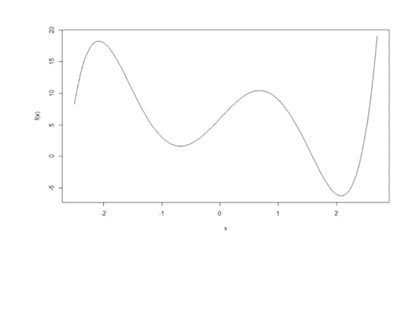

In [70]:
from IPython.display import Image
Image('fig8.png',width=500,height=100)

In [ ]:
# 문제해결형에서 사용하는 함수!!
# x가 2보다 커지면 함수값이 한없이 커짐

# backtracking line search 생각하면 초기 계획점 -2결정하고 alpha 10이면 우선 8만큼 이동
# 함수값은 무한대로 감
# 알파값 작게 초기값으로 주어져야 찾아나갈 수 있음

# 어떤 알파값을 주느냐에 따라서도 어떤 최소값이 찾아지는지 달라짐

In [71]:
# 문제해결 과제
def f(x):
    y=x[0]**5-8*x[0]**3+10*x[0]+6
    return y

In [73]:
x=sp.IndexedBase('x')
gradients=np.array([sp.diff(f(x), x[i]) for i in range(1)])
grads=sp.lambdify(x,gradients,'numpy')

In [75]:
x_=np.array([-2]) # 초기값 결정 : -1,0,1,2 가 될 수 있음. -> 계산의 반복수와 최소값 다르게 계산될 것
local_descent_backtracking(f,grads,x_,alpha=1)

# 결과
# 10번 반복만에 두번째 최소값 찾음

1: alpha =0.5000
0.5 [-2] 18
1: alpha =0.2500
2: alpha =0.1250
1 0.125 [1.] 9.0 9.0
1: alpha =0.0625
2: alpha =0.0312
3: alpha =0.0156
2 0.015625 [2.125] -6.185028076171875 15.185028076171875
3 0.015625 [2.06907272] -6.250988262279577 0.06596018610770216
4 0.015625 [2.08638569] -6.2583239755482865 0.0073357132687092985
5 0.015625 [2.08214901] -6.258744049240125 0.0004200736918384962
6 0.015625 [2.08327727] -6.258774171722553 3.0122482428396324e-05
7 0.015625 [2.08298263] -6.2587762199384365 2.0482158831214292e-06
8 0.015625 [2.08305998] -6.258776361210465 1.4127202874192335e-07
9 0.015625 [2.0830397] -6.258776370918298 9.707832759886514e-09


(10, array([2.0830397]))

In [76]:
# alpha바꿈
x_=np.array([-2]) 
local_descent_backtracking(f,grads,x_,alpha=0.5)
# 같은 결과

0.5 [-2] 18
1: alpha =0.2500
2: alpha =0.1250
1 0.125 [1.] 9.0 9.0
1: alpha =0.0625
2: alpha =0.0312
3: alpha =0.0156
2 0.015625 [2.125] -6.185028076171875 15.185028076171875
3 0.015625 [2.06907272] -6.250988262279577 0.06596018610770216
4 0.015625 [2.08638569] -6.2583239755482865 0.0073357132687092985
5 0.015625 [2.08214901] -6.258744049240125 0.0004200736918384962
6 0.015625 [2.08327727] -6.258774171722553 3.0122482428396324e-05
7 0.015625 [2.08298263] -6.2587762199384365 2.0482158831214292e-06
8 0.015625 [2.08305998] -6.258776361210465 1.4127202874192335e-07
9 0.015625 [2.0830397] -6.258776370918298 9.707832759886514e-09


(10, array([2.0830397]))

In [77]:
# alpha바꿈
x_=np.array([-2]) 
local_descent_backtracking(f,grads,x_,alpha=0.1)

# 결과
# 첫번째 최소값 나옴

0.1 [-2] 18
1: alpha =0.0500
1 0.05 [-1.4] 8.573759999999996 9.426240000000004
2 0.05 [-0.5084] 1.9332867673833949 6.640473232616602
3 0.05 [-0.71493709] 1.5872805237715832 0.34600624361181165
4 0.05 [-0.6668898] 1.5719454875259045 0.01533503624567878
5 0.05 [-0.68264826] 1.570230668215248 0.0017148193106564236
6 0.05 [-0.6777289] 1.5700657651478922 0.00016490306735583715
7 0.05 [-0.67929205] 1.57004904688897 1.6718258922132634e-05
8 0.05 [-0.67879801] 1.5700473790759553 1.6678130148051196e-06
9 0.05 [-0.67895442] 1.5700472118339786 1.6724197671180718e-07
10 0.05 [-0.67890493] 1.5700471950908605 1.6743118003148538e-08
11 0.05 [-0.67892059] 1.5700471934137887 1.677071814754072e-09


(12, array([-0.67892059]))

In [ ]:
# alpha역시 backtracking method에서 주의깊게 선택해야하는 초기값 됨

In [79]:
# strong_backtracking
local_descent_strong_backtracking(f,grads,x_,1)

# 결과
# 반복수 훨씬 적어짐
# 지속적으로 curvature information이 이용된 (wolfe의 2nd 제약조건) strong_backtracking이 좀 더 efficient함
# 반복수는 더 적지만 계산 한번 더 수행해야함 : zoom phase 가져야하기 때문 , -> 복잡한건 사실!

0.6796875 [-2] 18
1 0.013275146484375 [2.078125] -6.257803271524608 24.257803271524608
2 0.013275146484375 [2.08336606] -6.258772178536361 0.0009689070117531173
3 0.013275146484375 [2.08302044] -6.258776349378962 4.170842601070035e-06
4 0.013275146484375 [2.08304561] -6.25877637151876 2.2139797550835283e-08


(5, array([2.08304561]))

# 8주차까지: 문제해결 중간보고서 제출

- 3개 함수 : 다변량
- 이 3개의 함수에 대해 종료 조건에 따라서 계산 어떻게 달라졌는지 비교
- backtracing line search 와 strong backtraking 각각 해보세요!!
- 총 6가지!!



- 문제해결 함수 : alpha,x_,종료조건 바꾸면서 결과 비교
- 초기값 잘못 설정했을 때 어떤 문제가 생길 수 있음 이런거 정리